In [1]:
%matplotlib inline

In [2]:
pip install --upgrade pip

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 23.5 MB/s eta 0:00:0000:0100:01
  Attempting uninstall: pip
    Found existing installation: pip 22.1.2
    Uninstalling pip-22.1.2:
      Successfully uninstalled pip-22.1.2
Note: you may need to restart the kernel to use updated packages.


In [2]:
import pandas as pd
import os
import shutil
from Bio import SeqIO
from Bio import AlignIO
import distance
import editdistance
import math
import subprocess
import numpy as np
import re
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib as mpl
import collections
import pybedtools
import joblib
import itertools as it
import pathlib
import scipy
import sys
sys.modules['sklearn.externals.joblib'] = joblib
from sklearn.externals.joblib import Parallel, delayed
import matplotlib.patches as patches
from matplotlib.ticker import FormatStrFormatter
import matplotlib.ticker as ticker

In [3]:
import plotly.express as px

In [4]:
#Input species name based on the 
#Species_DICT= {}
#Species_DICT['APSI']= 'APSI'
Species = 'Pt_76'
GENOME_PATH = os.path.abspath('../Mating_type/genome/seperate_haplotype/')
YN00_PATH = os.path.join(GENOME_PATH, 'yn00.ctl')
############yn00.ctl file:###############################
#seqfile = cds_codon.aln * sequence data file name
#outfile = yn.out * main result file
#verbose = 0 * 1: detailed output (list sequences), 0: concise output
#icode = 0 * 0:universal code; 1:mammalian mt; 2-10:see below
#weighting = 0 * weighting pathways between codons (0/1)?
#commonf3x4 = 0 * use one set of codon freqs for all pairs (0/1)?


In [5]:
Species_Path = os.path.join(GENOME_PATH, '%s' % Species)
if not os.path.exists(Species_Path):
       os.mkdir(os.path.join(GENOME_PATH, '%s' % Species))
BASE_OUT_PATH = os.path.join(Species_Path, 'output')
FIGURE_PATH = os.path.join(Species_Path, 'figures')
if not os.path.exists(FIGURE_PATH):
    os.mkdir(FIGURE_PATH)
if not os.path.exists(BASE_OUT_PATH):
    os.mkdir(BASE_OUT_PATH)

In [50]:
PAML_PATH = os.path.join(Species_Path, 'paml')
if not os.path.exists(PAML_PATH):
       os.mkdir(os.path.join(Species_Path, 'paml'))
shutil.copy2(YN00_PATH, PAML_PATH)

'/home/zhenyan/Mating_type/genome/seperate_haplotype/Pt_76/paml/yn00.ctl'

In [13]:
#copy neccessary files to corresponding species_path
#for key, value in Species_DICT.items():
#    Species_Path = os.path.join(GENOME_PATH, '%s' % value)
#    shutil.copy2(GENOME_PATH + '/' + key + '_h.faa' , Species_Path)
#    shutil.copy2(GENOME_PATH + '/' + key + '_p.faa' , Species_Path) 
shutil.copy2(GENOME_PATH + '/' + Species + '_h.faa' , Species_Path)
shutil.copy2(GENOME_PATH + '/' + Species + '_p.faa' , Species_Path) 
shutil.copy2(GENOME_PATH + '/' + Species + '_h.gff3' , Species_Path)
shutil.copy2(GENOME_PATH + '/' + Species + '_p.gff3' , Species_Path) 

FileNotFoundError: [Errno 2] No such file or directory: '/home/zhenyan/Mating_type/genome/seperate_haplotype/Pt_76_h.gff3'

In [107]:
#Run Orthofinder
#for key, value in Species_DICT.items():
#        Species_Path = os.path.join(GENOME_PATH, '%s' % key)
#        OF_options = ['-f']
#        OF_options.append(Species_Path)
#        OF_options.append('-t 16')
#        OF_command = 'orthofinder %s' % ' '.join(OF_options)
#        print(OF_command)
#       subprocess.check_output(OF_command, shell=True, stderr=subprocess.STDOUT)
OF_options = ['-f']
OF_options.append(Species_Path)
OF_options.append('-t 16')
OF_command = 'orthofinder %s' % ' '.join(OF_options)
print(OF_command)
subprocess.check_output(OF_command, shell=True, stderr=subprocess.STDOUT)

orthofinder -f /home/zhenyan/Mating_type/genome/seperate_haplotype/Pt_76 -t 16


b'\nOrthoFinder version 2.5.4 Copyright (C) 2014 David Emms\n\n2021-07-29 12:39:25 : Starting OrthoFinder 2.5.4\n16 thread(s) for highly parallel tasks (BLAST searches etc.)\n2 thread(s) for OrthoFinder algorithm\n\nChecking required programs are installed\n----------------------------------------\nTest can run "mcl -h" - ok\nTest can run "fastme -i /home/zhenyan/Mating_type/genome/seperate_haplotype/Pt_76/OrthoFinder/Results_Jul29/WorkingDirectory/SimpleTest.phy -o /home/zhenyan/Mating_type/genome/seperate_haplotype/Pt_76/OrthoFinder/Results_Jul29/WorkingDirectory/SimpleTest.tre" - ok\n\nDividing up work for BLAST for parallel processing\n--------------------------------------------------\n2021-07-29 12:39:25 : Creating diamond database 1 of 2\n2021-07-29 12:39:25 : Creating diamond database 2 of 2\n\nRunning diamond all-versus-all\n------------------------------\nUsing 16 thread(s)\n2021-07-29 12:39:25 : This may take some time....\n2021-07-29 12:41:36 : Done all-versus-all sequence 

In [108]:
Species_Ortho_Path = os.path.join(Species_Path, 'OrthoFinder', 'Results_Jul29')
Orthogroups_df = os.path.join(Species_Ortho_Path, 'Orthogroups') 
OG_Genecount = pd.read_csv(os.path.join(Orthogroups_df, 'Orthogroups.GeneCount.tsv'), sep='\t', header='infer')
#classify into three types, primary = haploid, primary < haploid, primary > haploid
total_gene_count = OG_Genecount['Total'].sum()
OG_p_uniq = OG_Genecount.loc[(OG_Genecount['%s_h' % Species] == 0)]
sum_OG_p_uniq = OG_p_uniq['%s_p' % Species].sum() 
OG_h_uniq = OG_Genecount.loc[(OG_Genecount['%s_p' % Species] == 0)]
sum_OG_h_uniq = OG_h_uniq['%s_h' % Species].sum() 
OG_Genecount.loc[OG_Genecount['%s_h' % Species] < OG_Genecount['%s_p' % Species]]
print('Total numbers of genes: %s' % total_gene_count)
print('Total numbers of orthogroup: %s' % len(OG_Genecount))
print('Total numbers of orthogroup unique in primary assembly: %s' % len(OG_p_uniq))
print('Total numbers of genes unique in primary assembly: %s' % sum_OG_p_uniq)
print('Total numbers of orthogroup unique in haploid assembly: %s' % len(OG_h_uniq))
print('Total numbers of genes unique in haploid assembly: %s' % sum_OG_h_uniq)

Total numbers of genes: 27315
Total numbers of orthogroup: 11026
Total numbers of orthogroup unique in primary assembly: 95
Total numbers of genes unique in primary assembly: 359
Total numbers of orthogroup unique in haploid assembly: 101
Total numbers of genes unique in haploid assembly: 344


In [14]:
#Define output folder for proteinortho, although proteinortho generate output file in the same folder as this script
PROTEINORTHO_OUT_PATH = os.path.join(Species_Path, 'proteinortho')
if not os.path.exists(PROTEINORTHO_OUT_PATH):
    os.mkdir(PROTEINORTHO_OUT_PATH)
def getortho(species):
    !proteinortho6.pl -synteny -cpus=16 -singles -project={species} /home/zhenyan/Mating_type/genome/seperate_haplotype/{species}/{species}_p.faa /home/zhenyan/Mating_type/genome/seperate_haplotype/{species}/{species}_h.faa
    return getortho
getortho(Species)
shutil.copy2(Species + '.proteinortho.tsv' , PROTEINORTHO_OUT_PATH)
shutil.copy2(Species + '.poff-graph' , PROTEINORTHO_OUT_PATH)
shutil.copy2(Species + '.poff.tsv' , PROTEINORTHO_OUT_PATH)

*****************************************************************
Proteinortho with PoFF version 6.0.31 - An orthology detection tool
*****************************************************************
Using 16 CPU threads, Detected 'diamond' version 2.0.11
Checking input files.
Checking /home/zhenyan/Mating_type/genome/seperate_haplotype/Pt_76/Pt_76_p.faa... /home/zhenyan/Mating_type/genome/seperate_haplotype/Pt_76/Pt_76_p.faa	14280 genes	ok
Checking /home/zhenyan/Mating_type/genome/seperate_haplotype/Pt_76/Pt_76_h.faa... /home/zhenyan/Mating_type/genome/seperate_haplotype/Pt_76/Pt_76_h.faa	14331 genes	ok

**Step 1**
Generating indices.
Building database for '/home/zhenyan/Mating_type/genome/seperate_haplotype/Pt_76/Pt_76_h.faa'	(14331 sequences)
Building database for '/home/zhenyan/Mating_type/genome/seperate_haplotype/Pt_76/Pt_76_p.faa'	(14280 sequences)

**Step 2** using diamond with : synteny
Running blast analysis: 100% (1/1)                                             
[OUTPUT] ->

'/home/zhenyan/Mating_type/genome/seperate_haplotype/Pt_76/proteinortho/Pt_76.poff.tsv'

In [15]:
proteinortho = pd.read_csv(os.path.join(PROTEINORTHO_OUT_PATH, Species + '.proteinortho.tsv'), sep='\t', header='infer')
graph_header= ['Target', 'Query', 'evalue_ab', 'bitscore_ab', 'evalue_ba', 'bitscore_ba', 'same_strand' , 'simscore']
poff_graph = pd.read_csv(os.path.join(PROTEINORTHO_OUT_PATH, Species + '.poff-graph'), sep='\t', names=graph_header, header=None, comment='#')
poff_tsv = pd.read_csv(os.path.join(PROTEINORTHO_OUT_PATH, Species + '.poff.tsv'), sep='\t', header='infer')

In [16]:
proorthograph_fh=os.path.join(PROTEINORTHO_OUT_PATH, Species + '.proteinortho.tsv')
poff_graph_fh=os.path.join(PROTEINORTHO_OUT_PATH, Species + '.poff-graph')

In [ ]:
#Read output of orthofinder

In [17]:
combine_p_h_faa = 'cat %s %s >%s' % (Species_Path + '/' + Species + '_p.faa', Species_Path + '/' + Species + '_h.faa', Species_Path + '/' + Species + '_ph.faa')
combine_p_h_cds = 'cat %s %s >%s' % (Species_Path + '/' + Species + '_p.cds', Species_Path + '/' + Species + '_h.cds', Species_Path + '/' + Species + '_ph.cds')
subprocess.check_output(combine_p_h_faa, shell=True, stderr=subprocess.STDOUT)
subprocess.check_output(combine_p_h_cds, shell=True, stderr=subprocess.STDOUT)

b''

In [18]:
def getFastaDict(fastaFile):
    d = {}
    for gene in SeqIO.parse(fastaFile, 'fasta'):
        d[gene.id] = gene
    return d

In [19]:
PH_PROTEIN_FASTA = os.path.join(Species_Path + '/' + Species + '_ph.faa')
PH_CDS_FASTA = os.path.join(Species_Path + '/' + Species + '_ph.cds')
SEQRECORD_PROTEIN_DICT = getFastaDict(PH_PROTEIN_FASTA)
SEQRECORD_CDS_DICT = getFastaDict(PH_CDS_FASTA)
threads = 8

In [ ]:
#poff_graph=open(poff_graph_fh).readlines()
#graph_header= ['Target', 'Query', 'evalue_ab', 'bitscore_ab', 'evalue_ba', 'bitscore_ba', 'same_strand' , 'simscore']
#po_df = pd.read_csv(poff_graph_fh, sep='\t', header=None, names=graph_header, comment='#' )

In [46]:
def writeAllelicFasta(alleleOne, alleleTwo, alleleType, outPath):
    '''writes fasta file containing fasta information for two alleles
    in the outPath'''
    assert(alleleType.upper() in ['CDS', 'GENE', 'PROTEIN'])
    seqRecordDict = globals()['SEQRECORD_' + alleleType.upper() + '_DICT']
    try:
        alleleSeqRecords = [seqRecordDict[alleleOne], seqRecordDict[alleleTwo]]
    except KeyError:
        print(alleleOne)
        print(alleleTwo)
        print(alleleType)
        sys.exit()
    with open(os.path.join(outPath, alleleType.lower() + '.fa'), 'w') as outFile:
        SeqIO.write(alleleSeqRecords, outFile, 'fasta')
    return True

In [47]:
# Define paml_script.sh
def writeAlignmentScript(alleleOutPath, scriptLoc = os.path.join(PAML_PATH, 'paml_script.sh')):
    with open(scriptLoc, 'a') as outFile:
        print('cd %s' % alleleOutPath, file=outFile)
        print('muscle -clwstrict -in protein.fa -out protein.aln', file=outFile)
        print('pal2nal.pl -output paml protein.aln cds.fa > cds_codon.aln', file=outFile)
        print('pal2nal.pl protein.aln cds.fa > cds_codon.clustal', file=outFile)
        print('cp %s/yn00.ctl ./' % PAML_PATH, file=outFile)
        print('yn00', file=outFile)
    return True

In [48]:
def prepareAlignmentBashScript(scriptLoc = os.path.join(PAML_PATH, 'paml_script.sh')):
    with open(scriptLoc, 'w') as pamlScript:
        print('#!/bin/bash', file=pamlScript)

    for index, [Query, Target] in alleleDf.iloc[:, :2].iterrows():
        #if we don't have a blast hit skip.
        if pd.isnull(Target):
            continue
        else:
            alleleOutPath = os.path.join(PAML_PATH, '%s_%s' % (Query, Target))
            if not os.path.exists(alleleOutPath):
                os.mkdir(os.path.join(PAML_PATH, '%s_%s' % (Query, Target)))
            writeAllelicFasta(Query, Target, 'CDS', alleleOutPath)
            writeAllelicFasta(Query, Target, 'PROTEIN', alleleOutPath)
            writeAlignmentScript(alleleOutPath, os.path.join(PAML_PATH, 'paml_script.sh'))
    return True

In [52]:
alleleDf = poff_graph.copy()
alleleDf['folder'] = alleleDf.Target + '_' + alleleDf.Query
alleleDf.set_index('folder', inplace=True)

In [51]:
prepareAlignmentBashScript(os.path.join(PAML_PATH, 'paml_script.sh'))

True

In [55]:
#run paml script
!bash {os.path.join(PAML_PATH, 'paml_script.sh')}


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 574, max 574, avg 574
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1722
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      574 /      574 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Ac

Counting site patterns..  0:00
          75 patterns at     1468 /     1468 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.29

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 794, max 794, avg 794
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2382
Reading sequences, sequential format..
Counting site patterns..  0:00
          56 patterns at      794 /      794 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Niel

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 345
Reading sequences, sequential format..
Counting site patterns..  0:00
          45 patterns at       94 /       94 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.69

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 69, max 82, avg 75
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 246
Reading sequences, sequential format..
Counting site patterns..

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 918
Reading sequences, sequential format..
Counting site patterns..  0:00
          59 patterns at      306 /      306 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 359, max 359, avg 359
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1077
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 633
Reading sequences, sequential format..
Counting site patterns..  0:00
          54 patterns at      211 /      211 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 277, max 277, avg 277
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 831
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 717
Reading sequences, sequential format..
Counting site patterns..  0:00
          58 patterns at      239 /      239 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 188, max 188, avg 188
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 564
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1539
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      513 /      513 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 115, max 115, avg 115
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 345
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 702
Reading sequences, sequential format..
Counting site patterns..  0:00
          70 patterns at      161 /      161 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.35

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 102, max 102, avg 102
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 306
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1677
Reading sequences, sequential format..
Counting site patterns..  0:00
          93 patterns at      510 /      510 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.21

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 226, max 226, avg 226
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 678
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 771
Reading sequences, sequential format..
Counting site patterns..  0:00
          58 patterns at      257 /      257 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 496, max 496, avg 496
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1488
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1449
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      328 /      328 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 500, max 524, avg 512
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1572
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 672
Reading sequences, sequential format..
Counting site patterns..  0:00
          54 patterns at      224 /      224 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 359, max 359, avg 359
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1077
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1128
Reading sequences, sequential format..
Counting site patterns..  0:00
          59 patterns at      376 /      376 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 522, max 522, avg 522
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1566
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 462
Reading sequences, sequential format..
Counting site patterns..  0:00
          69 patterns at      108 /      108 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.30

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 427, max 449, avg 438
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1347
Reading sequences, sequential format..
Counting site patter

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1506
Reading sequences, sequential format..
Counting site patterns..  0:00
          95 patterns at      393 /      393 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.11

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 136, max 159, avg 147
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1374
Reading sequences, sequential format..
Counting site patterns..  0:00
          67 patterns at      342 /      342 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 5.62

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 306, max 310, avg 308
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 930
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 432
Reading sequences, sequential format..
Counting site patterns..  0:00
          46 patterns at      144 /      144 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 199, max 199, avg 199
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 597
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 255
Reading sequences, sequential format..
Counting site patterns..  0:00
          44 patterns at       85 /       85 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 200, max 200, avg 200
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 600
Reading sequences, sequential format..
Counting site pattern

00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1902
Reading sequences, sequential format..
Counting site patterns..  0:00
          64 patterns at      634 /      634 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 959, max 974, avg 966
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 669
Reading sequences, sequential format..
Counting site patterns..  0:00
          57 patterns at      223 /      223 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 95, max 183, avg 139
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 549
Reading sequences, sequential format..
Counting site patterns

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 918
Reading sequences, sequential format..
Counting site patterns..  0:00
          86 patterns at      201 /      201 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.62

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 479, max 479, avg 479
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1437
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 423
Reading sequences, sequential format..
Counting site patterns..  0:00
          52 patterns at      112 /      112 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 95, max 103, avg 99
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 309
Reading sequences, sequential format..
Counting site patterns.

00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2250
Reading sequences, sequential format..
Counting site patterns..  0:00
          53 patterns at      584 /      584 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 452, max 452, avg 452
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

00:00:00    27 MB(14%)  Iter   1  100.00%  Align node       
00:00:00    27 MB(14%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 4506
Reading sequences, sequential format..
Counting site patterns..  0:00
          65 patterns at     1502 /     1502 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 10.09

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 157, max 231, avg 194
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Mar

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 819
Reading sequences, sequential format..
Counting site patterns..  0:00
          63 patterns at      273 /      273 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.97

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 85, max 85, avg 85
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 255
Reading sequences, sequential format..
Counting site patterns..

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 459
Reading sequences, sequential format..
Counting site patterns..  0:00
          51 patterns at      153 /      153 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 148, max 148, avg 148
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 444
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 843
Reading sequences, sequential format..
Counting site patterns..  0:00
          54 patterns at      281 /      281 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 720, max 720, avg 720
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2160
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2100
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      670 /      670 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 213, max 213, avg 213
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 639
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 432
Reading sequences, sequential format..
Counting site patterns..  0:00
          56 patterns at      144 /      144 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 342, max 342, avg 342
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1026
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 348
Reading sequences, sequential format..
Counting site patterns..  0:00
          51 patterns at      116 /      116 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 277, max 330, avg 303
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 996
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 411
Reading sequences, sequential format..
Counting site patterns..  0:00
          53 patterns at      137 /      137 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 554, max 587, avg 570
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1761
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 561
Reading sequences, sequential format..
Counting site patterns..  0:00
          56 patterns at      187 /      187 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 174, max 194, avg 184
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 582
Reading sequences, sequential format..
Counting site pattern

00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2244
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      748 /      748 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 623, max 623, avg 623
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 897
Reading sequences, sequential format..
Counting site patterns..  0:00
          59 patterns at      299 /      299 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 109, max 109, avg 109
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 327
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 453
Reading sequences, sequential format..
Counting site patterns..  0:00
          50 patterns at      151 /      151 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 134, max 167, avg 150
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 501
Reading sequences, sequential format..
Counting site pattern

00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3108
Reading sequences, sequential format..
Counting site patterns..  0:00
          63 patterns at      482 /      482 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.94

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 387, max 387, avg 387
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 300
Reading sequences, sequential format..
Counting site patterns..  0:00
          40 patterns at      100 /      100 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 467, max 467, avg 467
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1401
Reading sequences, sequential format..
Counting site patter

protein 2 seqs, lengths min 712, max 908, avg 810
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2724
Reading sequences, sequential format..
Counting site patterns..  0:00
          64 patterns at      712 /      712 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.96

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 262, max 262, avg 262
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.

00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2274
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      758 /      758 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 288, max 288, avg 288
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Ite

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 726
Reading sequences, sequential format..
Counting site patterns..  0:00
          57 patterns at      185 /      185 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.40

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 508, max 508, avg 508
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1524
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 804
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      268 /      268 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 1700, max 1706, avg 1703
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    29 MB(14%)  Iter   1  100.00%  Align node       
00:00:00    29 MB(14%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 5121
Reading sequences, sequential format..
Counting site pat

00:00:01    63 MB(32%)  Iter   1  100.00%  Align node       
00:00:01    63 MB(32%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 15636
Reading sequences, sequential format..
Counting site patterns..  0:00
          65 patterns at     5188 /     5188 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.95

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 285, max 285, avg 285
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Mar

00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2202
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      704 /      704 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.17

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 292, max 292, avg 292
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 468
Reading sequences, sequential format..
Counting site patterns..  0:00
          49 patterns at      156 /      156 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 320, max 473, avg 396
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1419
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1854
Reading sequences, sequential format..
Counting site patterns..  0:00
          69 patterns at      618 /      618 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 6.63

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 252, max 252, avg 252
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 756
Reading sequences, sequential format..
Counting site patter

00:00:00    25 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3312
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at     1104 /     1104 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 240, max 240, avg 240
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 699
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      233 /      233 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 250, max 250, avg 250
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 750
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1212
Reading sequences, sequential format..
Counting site patterns..  0:00
          57 patterns at      404 /      404 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 5.29

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 175, max 175, avg 175
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 525
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1182
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      394 /      394 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 706, max 731, avg 718
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2193
Reading sequences, sequential format..
Counting site patte

00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2001
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      667 /      667 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 124, max 124, avg 124
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1500
Reading sequences, sequential format..
Counting site patterns..  0:00
          84 patterns at      344 /      344 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.64

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 445, max 445, avg 445
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1335
Reading sequences, sequential format..
Counting site patte

00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2328
Reading sequences, sequential format..
Counting site patterns..  0:00
          73 patterns at      776 /      776 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.46

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 401, max 401, avg 401
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1110
Reading sequences, sequential format..
Counting site patterns..  0:00
          58 patterns at      370 /      370 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 80, max 80, avg 80
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 240
Reading sequences, sequential format..
Counting site patterns.

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1128
Reading sequences, sequential format..
Counting site patterns..  0:00
          59 patterns at      376 /      376 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 166, max 166, avg 166
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 201
Reading sequences, sequential format..
Counting site patterns..  0:00
          35 patterns at       67 /       67 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 446, max 446, avg 446
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1338
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1479
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      388 /      388 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 1445, max 1576, avg 1510
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    27 MB(14%)  Iter   1  100.00%  Align node       
00:00:00    27 MB(14%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 4968
Reading sequences, sequential format..
Counting site pa

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 861
Reading sequences, sequential format..
Counting site patterns..  0:00
          59 patterns at      287 /      287 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 251, max 251, avg 251
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 753
Reading sequences, sequential format..
Counting site pattern

00:00:00    25 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 4197
Reading sequences, sequential format..
Counting site patterns..  0:00
          63 patterns at      937 /      937 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 553, max 568, avg 560
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 963
Reading sequences, sequential format..
Counting site patterns..  0:00
          50 patterns at      321 /      321 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 1257, max 1257, avg 1257
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    26 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    26 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3771
Reading sequences, sequential format..
Counting site pat

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 756
Reading sequences, sequential format..
Counting site patterns..  0:00
          58 patterns at      252 /      252 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 1388, max 1388, avg 1388
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    27 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    27 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 4164
Reading sequences, sequential format..
Counting site pat

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1620
Reading sequences, sequential format..
Counting site patterns..  0:00
          59 patterns at      540 /      540 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 597, max 597, avg 597
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1791
Reading sequences, sequential format..
Counting site patte

00:00:00    28 MB(14%)  Iter   1  100.00%  Align node       
00:00:00    28 MB(14%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 4671
Reading sequences, sequential format..
Counting site patterns..  0:00
          67 patterns at     1557 /     1557 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 228, max 228, avg 228
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1074
Reading sequences, sequential format..
Counting site patterns..  0:00
          59 patterns at      358 /      358 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 328, max 328, avg 328
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 984
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 438
Reading sequences, sequential format..
Counting site patterns..  0:00
          50 patterns at      113 /      113 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 118, max 118, avg 118
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 354
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2181
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      727 /      727 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 339, max 339, avg 339
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1017
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 846
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      282 /      282 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 208, max 256, avg 232
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 768
Reading sequences, sequential format..
Counting site pattern

00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2232
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      744 /      744 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 1183, max 1183, avg 1183
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:01    25 MB(13%)  Iter   1  100.00%  Align node       
00:00:01    25 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, M

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1146
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      382 /      382 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 822, max 973, avg 897
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2919
Reading sequences, sequential format..
Counting site patte

00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2991
Reading sequences, sequential format..
Counting site patterns..  0:00
          63 patterns at      997 /      997 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 173, max 173, avg 173
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

00:00:01    42 MB(21%)  Iter   1  100.00%  Align node       
00:00:01    42 MB(21%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 10227
Reading sequences, sequential format..
Counting site patterns..  0:00
          71 patterns at     3409 /     3409 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 237, max 242, avg 239
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Mar

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1584
Reading sequences, sequential format..
Counting site patterns..  0:00
          75 patterns at      528 /      528 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.07

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 712, max 741, avg 726
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2946
Reading sequences, sequential format..
Counting site patterns..  0:00
          65 patterns at      982 /      982 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 71, max 71, avg 71
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2445
Reading sequences, sequential format..
Counting site patterns..  0:00
          78 patterns at      737 /      737 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.75

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 322, max 428, avg 375
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1284
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 945
Reading sequences, sequential format..
Counting site patterns..  0:00
          71 patterns at      315 /      315 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.10

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 581, max 581, avg 581
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1743
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2244
Reading sequences, sequential format..
Counting site patterns..  0:00
          67 patterns at      748 /      748 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 7.71

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 1104, max 1104, avg 1104
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    25 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3312
Reading sequences, sequential format..
Counting site pa

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1656
Reading sequences, sequential format..
Counting site patterns..  0:00
          63 patterns at      437 /      437 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.95

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 905, max 997, avg 951
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2991
Reading sequences, sequential format..
Counting site patte

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1311
Reading sequences, sequential format..
Counting site patterns..  0:00
          64 patterns at      437 /      437 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.00

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 328, max 402, avg 365
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2799
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      807 /      807 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 237, max 237, avg 237
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 711
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 978
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      317 /      317 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 170, max 170, avg 170
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 510
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 507
Reading sequences, sequential format..
Counting site patterns..  0:00
          52 patterns at      169 /      169 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 789, max 817, avg 803
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2451
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1623
Reading sequences, sequential format..
Counting site patterns..  0:00
          58 patterns at      541 /      541 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 625, max 625, avg 625
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1875
Reading sequences, sequential format..
Counting site patte

00:00:00    25 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3975
Reading sequences, sequential format..
Counting site patterns..  0:00
          64 patterns at      956 /      956 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 123, max 123, avg 123
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

00:00:00    26 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    26 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3708
Reading sequences, sequential format..
Counting site patterns..  0:00
          67 patterns at     1236 /     1236 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.08

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 251, max 251, avg 251
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 678
Reading sequences, sequential format..
Counting site patterns..  0:00
          79 patterns at      226 /      226 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 9.08

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 265, max 336, avg 300
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1008
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 609
Reading sequences, sequential format..
Counting site patterns..  0:00
          58 patterns at      182 /      182 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.79

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 598, max 598, avg 598
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1794
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1293
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      431 /      431 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 1130, max 1130, avg 1130
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    25 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3390
Reading sequences, sequential format..
Counting site pa

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1542
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      514 /      514 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 122, max 122, avg 122
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 366
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1056
Reading sequences, sequential format..
Counting site patterns..  0:00
         193 patterns at      228 /      228 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.33

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 611, max 777, avg 694
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2619
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 468
Reading sequences, sequential format..
Counting site patterns..  0:00
          51 patterns at      122 /      122 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 281, max 524, avg 402
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1572
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 849
Reading sequences, sequential format..
Counting site patterns..  0:00
          58 patterns at      283 /      283 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 1294, max 1294, avg 1294
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    26 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    26 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3882
Reading sequences, sequential format..
Counting site pat

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1455
Reading sequences, sequential format..
Counting site patterns..  0:00
          84 patterns at      448 /      448 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.81

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 405, max 405, avg 405
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1215
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 333
Reading sequences, sequential format..
Counting site patterns..  0:00
          50 patterns at      111 /      111 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 500, max 504, avg 502
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1512
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1551
Reading sequences, sequential format..
Counting site patterns..  0:00
          63 patterns at      381 /      381 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.98

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 354, max 354, avg 354
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1062
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 300
Reading sequences, sequential format..
Counting site patterns..  0:00
          47 patterns at      100 /      100 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 108, max 108, avg 108
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 324
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1251
Reading sequences, sequential format..
Counting site patterns..  0:00
          64 patterns at      305 /      305 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.47

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 1031, max 1031, avg 1031
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    25 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3093
Reading sequences, sequential format..
Counting site pa

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1113
Reading sequences, sequential format..
Counting site patterns..  0:00
          64 patterns at      371 /      371 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.02

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 203, max 211, avg 207
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 633
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 777
Reading sequences, sequential format..
Counting site patterns..  0:00
          59 patterns at      259 /      259 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 409, max 409, avg 409
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1227
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1362
Reading sequences, sequential format..
Counting site patterns..  0:00
          72 patterns at      454 /      454 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.88

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 201, max 201, avg 201
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 603
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 537
Reading sequences, sequential format..
Counting site patterns..  0:00
          53 patterns at      179 /      179 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 334, max 334, avg 334
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1002
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1404
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      468 /      468 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 1077, max 1077, avg 1077
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    25 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3231
Reading sequences, sequential format..
Counting site pa

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 783
Reading sequences, sequential format..
Counting site patterns..  0:00
          57 patterns at      233 /      233 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 163, max 163, avg 163
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 489
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 924
Reading sequences, sequential format..
Counting site patterns..  0:00
          71 patterns at      276 /      276 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 20.91

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 63, max 63, avg 63
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 189
Reading sequences, sequential format..
Counting site patterns.

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1080
Reading sequences, sequential format..
Counting site patterns..  0:00
          69 patterns at      256 /      256 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.89

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 595, max 595, avg 595
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1785
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1077
Reading sequences, sequential format..
Counting site patterns..  0:00
          51 patterns at      359 /      359 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 413, max 413, avg 413
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1239
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 705
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      235 /      235 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 252, max 323, avg 287
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 969
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 210
Reading sequences, sequential format..
Counting site patterns..  0:00
          35 patterns at       70 /       70 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 311, max 311, avg 311
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 933
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2232
Reading sequences, sequential format..
Counting site patterns..  0:00
          63 patterns at      744 /      744 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.03

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 431, max 431, avg 431
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1293
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1272
Reading sequences, sequential format..
Counting site patterns..  0:00
         153 patterns at      299 /      299 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.93

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 104, max 104, avg 104
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 312
Reading sequences, sequential format..
Counting site patter

00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2442
Reading sequences, sequential format..
Counting site patterns..  0:00
          72 patterns at      680 /      680 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.88

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 176, max 176, avg 176
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2808
Reading sequences, sequential format..
Counting site patterns..  0:00
         136 patterns at      926 /      926 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.12

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 183, max 183, avg 183
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 549
Reading sequences, sequential format..
Counting site patter

00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2259
Reading sequences, sequential format..
Counting site patterns..  0:00
          65 patterns at      530 /      530 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.99

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 995, max 995, avg 995
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 846
Reading sequences, sequential format..
Counting site patterns..  0:00
          49 patterns at      248 /      248 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 411, max 411, avg 411
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1233
Reading sequences, sequential format..
Counting site patter

00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2694
Reading sequences, sequential format..
Counting site patterns..  0:00
          57 patterns at      898 /      898 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 706, max 706, avg 706
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

protein 2 seqs, lengths min 319, max 396, avg 357
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1206
Reading sequences, sequential format..
Counting site patterns..  0:00
          71 patterns at      313 /      313 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.49

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 119, max 136, avg 127
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 418, max 418, avg 418
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1254
Reading sequences, sequential format..
Counting site patterns..  0:00
          73 patterns at      418 /      418 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 6.63

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Ac


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 254, max 254, avg 254
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 762
Reading sequences, sequential format..
Counting site patterns..  0:00
          58 patterns at      254 /      254 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Aci

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1230
Reading sequences, sequential format..
Counting site patterns..  0:00
          98 patterns at      410 /      410 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 7.26

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 614, max 614, avg 614
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1842
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1158
Reading sequences, sequential format..
Counting site patterns..  0:00
          55 patterns at      386 /      386 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 146, max 146, avg 146
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 438
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 198
Reading sequences, sequential format..
Counting site patterns..  0:00
          41 patterns at       66 /       66 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 233, max 233, avg 233
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 699
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1689
Reading sequences, sequential format..
Counting site patterns..  0:00
          83 patterns at      456 /      456 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.55

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 277, max 277, avg 277
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 831
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1131
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      278 /      278 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 376, max 402, avg 389
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1206
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 633
Reading sequences, sequential format..
Counting site patterns..  0:00
          48 patterns at      211 /      211 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 330, max 330, avg 330
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 990
Reading sequences, sequential format..
Counting site pattern

protein 2 seqs, lengths min 277, max 277, avg 277
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 831
Reading sequences, sequential format..
Counting site patterns..  0:00
          65 patterns at      277 /      277 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.03

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 126, max 126, avg 126
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.0


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 217, max 217, avg 217
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 651
Reading sequences, sequential format..
Counting site patterns..  0:00
          38 patterns at      217 /      217 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Aci

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1317
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      439 /      439 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 229, max 229, avg 229
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 687
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 450
Reading sequences, sequential format..
Counting site patterns..  0:00
          77 patterns at      117 /      117 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.85

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 305, max 305, avg 305
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 915
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1275
Reading sequences, sequential format..
Counting site patterns..  0:00
          55 patterns at      425 /      425 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 234, max 234, avg 234
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 702
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 657
Reading sequences, sequential format..
Counting site patterns..  0:00
          58 patterns at      202 /      202 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 90, max 90, avg 90
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 270
Reading sequences, sequential format..
Counting site patterns..

00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 621
Reading sequences, sequential format..
Counting site patterns..  0:00
          51 patterns at      207 /      207 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 401, max 401, avg 401
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 738
Reading sequences, sequential format..
Counting site patterns..  0:00
          59 patterns at      246 /      246 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 214, max 297, avg 255
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 891
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1107
Reading sequences, sequential format..
Counting site patterns..  0:00
          57 patterns at      369 /      369 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 139, max 139, avg 139
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 417
Reading sequences, sequential format..
Counting site patter

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1803
Reading sequences, sequential format..
Counting site patterns..  0:00
         108 patterns at      423 /      423 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.45

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 166, max 167, avg 166
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 345
Reading sequences, sequential format..
Counting site patterns..  0:00
          84 patterns at       89 /       89 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.48

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 719, max 719, avg 719
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2157
Reading sequences, sequential format..
Counting site patter

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 990
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      330 /      330 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 158, max 158, avg 158
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 552
Reading sequences, sequential format..
Counting site patterns..  0:00
          52 patterns at      184 /      184 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 273, max 281, avg 277
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 942
Reading sequences, sequential format..
Counting site pattern

protein 2 seqs, lengths min 309, max 309, avg 309
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 927
Reading sequences, sequential format..
Counting site patterns..  0:00
          59 patterns at      309 /      309 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 858, max 858, avg 858
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.0

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1008
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      311 /      311 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 242, max 255, avg 248
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 774
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 846
Reading sequences, sequential format..
Counting site patterns..  0:00
          69 patterns at      253 /      253 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.49

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 443, max 443, avg 443
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1329
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1782
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      594 /      594 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 247, max 247, avg 247
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 741
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 498
Reading sequences, sequential format..
Counting site patterns..  0:00
          56 patterns at      116 /      116 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.57

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 350, max 351, avg 350
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1053
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1362
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      454 /      454 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 516, max 516, avg 516
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1548
Reading sequences, sequential format..
Counting site patte

00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2460
Reading sequences, sequential format..
Counting site patterns..  0:00
          63 patterns at      718 /      718 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 385, max 389, avg 387
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 867
Reading sequences, sequential format..
Counting site patterns..  0:00
          58 patterns at      266 /      266 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 873, max 913, avg 893
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2739
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1464
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      488 /      488 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 1108, max 1109, avg 1108
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    25 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3327
Reading sequences, sequential format..
Counting site pa

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1023
Reading sequences, sequential format..
Counting site patterns..  0:00
          77 patterns at      267 /      267 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.63

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 163, max 163, avg 163
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 489
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 750
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      240 /      240 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.88

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 482, max 487, avg 484
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1461
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 981
Reading sequences, sequential format..
Counting site patterns..  0:00
          58 patterns at      327 /      327 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 83, max 83, avg 83
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 249
Reading sequences, sequential format..
Counting site patterns..

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 444
Reading sequences, sequential format..
Counting site patterns..  0:00
          47 patterns at      148 /      148 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 115, max 139, avg 127
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 417
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1416
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      472 /      472 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 604, max 655, avg 629
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1965
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2541
Reading sequences, sequential format..
Counting site patterns..  0:00
          63 patterns at      794 /      794 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.02

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 260, max 260, avg 260
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 780
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1512
Reading sequences, sequential format..
Counting site patterns..  0:00
          55 patterns at      383 /      383 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 298, max 298, avg 298
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 894
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 765
Reading sequences, sequential format..
Counting site patterns..  0:00
          41 patterns at      255 /      255 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 93, max 101, avg 97
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 303
Reading sequences, sequential format..
Counting site patterns.

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1128
Reading sequences, sequential format..
Counting site patterns..  0:00
          69 patterns at      362 /      362 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.17

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 318, max 342, avg 330
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1026
Reading sequences, sequential format..
Counting site patte

00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 978
Reading sequences, sequential format..
Counting site patterns..  0:00
         113 patterns at      224 /      224 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.01

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 181, max 323, avg 252
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 969
Re

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 642
Reading sequences, sequential format..
Counting site patterns..  0:00
          58 patterns at      214 /      214 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 239, max 239, avg 239
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 717
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1668
Reading sequences, sequential format..
Counting site patterns..  0:00
          69 patterns at      556 /      556 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.04

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 726, max 726, avg 726
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2178
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1677
Reading sequences, sequential format..
Counting site patterns..  0:00
          72 patterns at      460 /      460 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 14.10

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 86, max 86, avg 86
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 258
Reading sequences, sequential format..
Counting site patterns

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 279
Reading sequences, sequential format..
Counting site patterns..  0:00
          47 patterns at       93 /       93 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 837, max 898, avg 867
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2694
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1605
Reading sequences, sequential format..
Counting site patterns..  0:00
          74 patterns at      530 /      530 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.53

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 1820, max 1830, avg 1825
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    29 MB(15%)  Iter   1  100.00%  Align node       
00:00:00    29 MB(15%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 5490
Reading sequences, sequential format..
Counting site pa

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2262
Reading sequences, sequential format..
Counting site patterns..  0:00
          63 patterns at      754 /      754 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 513, max 513, avg 513
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1539
Reading sequences, sequential format..
Counting site patte

protein 2 seqs, lengths min 422, max 422, avg 422
00:00:01    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:01    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:01    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:01    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1266
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      422 /      422 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 380, max 380, avg 380
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 359, max 374, avg 366
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1128
Reading sequences, sequential format..
Counting site patterns..  0:00
          79 patterns at      357 /      357 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 7.28

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Ac


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 226, max 245, avg 235
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 735
Reading sequences, sequential format..
Counting site patterns..  0:00
          63 patterns at      226 /      226 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.95

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Aci

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 768
Reading sequences, sequential format..
Counting site patterns..  0:00
          58 patterns at      256 /      256 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 302, max 373, avg 337
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1134
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1053
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      351 /      351 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 280, max 280, avg 280
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 840
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 909
Reading sequences, sequential format..
Counting site patterns..  0:00
          63 patterns at      303 /      303 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 177, max 177, avg 177
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 531
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1623
Reading sequences, sequential format..
Counting site patterns..  0:00
          76 patterns at      364 /      364 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.48

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 462, max 462, avg 462
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1386
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 516
Reading sequences, sequential format..
Counting site patterns..  0:00
          50 patterns at      172 /      172 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 150, max 188, avg 169
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 564
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 333
Reading sequences, sequential format..
Counting site patterns..  0:00
          47 patterns at      111 /      111 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 258, max 258, avg 258
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 774
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1014
Reading sequences, sequential format..
Counting site patterns..  0:00
          63 patterns at      338 /      338 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 179, max 195, avg 187
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 585
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1401
Reading sequences, sequential format..
Counting site patterns..  0:00
          66 patterns at      300 /      300 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.00

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 303, max 303, avg 303
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 909
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 435
Reading sequences, sequential format..
Counting site patterns..  0:00
          44 patterns at      145 /      145 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 413, max 479, avg 446
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1437
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 426
Reading sequences, sequential format..
Counting site patterns..  0:00
          49 patterns at      142 /      142 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 1029, max 1029, avg 1029
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    25 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3087
Reading sequences, sequential format..
Counting site pat

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 933
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      311 /      311 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 493, max 493, avg 493
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1479
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3234
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at     1055 /     1055 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 77, max 77, avg 77
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 231
Reading sequences, sequential format..
Counting site patterns.

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 531
Reading sequences, sequential format..
Counting site patterns..  0:00
          55 patterns at      177 /      177 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 270, max 270, avg 270
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 810
Reading sequences, sequential format..
Counting site pattern

00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1749
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      583 /      583 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 1196, max 1196, avg 1196
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    26 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    26 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, M

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1515
Reading sequences, sequential format..
Counting site patterns..  0:00
          66 patterns at      505 /      505 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 5.43

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 565, max 588, avg 576
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1911
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      637 /      637 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 665, max 665, avg 665
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1995
Reading sequences, sequential format..
Counting site patte

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1524
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      508 /      508 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 172, max 172, avg 172
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

00:00:01    58 MB(29%)  Iter   1  100.00%  Align node       
00:00:01    58 MB(29%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 14346
Reading sequences, sequential format..
Counting site patterns..  0:00
          68 patterns at     4782 /     4782 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.92

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 68, max 68, avg 68
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1386
Reading sequences, sequential format..
Counting site patterns..  0:00
          63 patterns at      398 /      398 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 185, max 185, avg 185
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 555
Reading sequences, sequential format..
Counting site patter

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1125
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      375 /      375 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 332, max 348, avg 340
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 330
Reading sequences, sequential format..
Counting site patterns..  0:00
          46 patterns at      110 /      110 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 922, max 922, avg 922
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2766
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 657
Reading sequences, sequential format..
Counting site patterns..  0:00
          57 patterns at      219 /      219 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 303, max 303, avg 303
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 909
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 762
Reading sequences, sequential format..
Counting site patterns..  0:00
          58 patterns at      254 /      254 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 572, max 582, avg 577
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1863
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 747
Reading sequences, sequential format..
Counting site patterns..  0:00
          43 patterns at      249 /      249 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 292, max 310, avg 301
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 930
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 525
Reading sequences, sequential format..
Counting site patterns..  0:00
          56 patterns at      175 /      175 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 251, max 251, avg 251
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 753
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 678
Reading sequences, sequential format..
Counting site patterns..  0:00
          55 patterns at      226 /      226 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 164, max 164, avg 164
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 492
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1002
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      334 /      334 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.90

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 1970, max 1970, avg 1970
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    30 MB(15%)  Iter   1  100.00%  Align node       
00:00:00    30 MB(15%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 5910
Reading sequences, sequential format..
Counting site pa

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1068
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      356 /      356 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 381, max 382, avg 381
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 264
Reading sequences, sequential format..
Counting site patterns..  0:00
          45 patterns at       88 /       88 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 161, max 161, avg 161
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 483
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 513
Reading sequences, sequential format..
Counting site patterns..  0:00
          53 patterns at      171 /      171 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 617, max 833, avg 725
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2499
Reading sequences, sequential format..
Counting site patter

00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2982
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      994 /      994 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 253, max 498, avg 375
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1494


00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1515
Reading sequences, sequential format..
Counting site patterns..  0:00
          59 patterns at      479 /      479 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 146, max 258, avg 202
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1032
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      344 /      344 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.99

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 124, max 124, avg 124
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 372
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1548
Reading sequences, sequential format..
Counting site patterns..  0:00
          59 patterns at      513 /      513 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 120, max 120, avg 120
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 360
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1338
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      446 /      446 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 349, max 487, avg 418
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1461
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1476
Reading sequences, sequential format..
Counting site patterns..  0:00
         169 patterns at      298 /      298 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.21

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 473, max 473, avg 473
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1419
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 762
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      246 /      246 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.27

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 228, max 228, avg 228
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 684
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 687
Reading sequences, sequential format..
Counting site patterns..  0:00
          57 patterns at      229 /      229 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 846, max 846, avg 846
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2538
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 648
Reading sequences, sequential format..
Counting site patterns..  0:00
          56 patterns at      216 /      216 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 218, max 218, avg 218
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 654
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 864
Reading sequences, sequential format..
Counting site patterns..  0:00
          56 patterns at      288 /      288 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 164, max 164, avg 164
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 492
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 324
Reading sequences, sequential format..
Counting site patterns..  0:00
          43 patterns at      108 /      108 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 123, max 123, avg 123
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 369
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1080
Reading sequences, sequential format..
Counting site patterns..  0:00
          58 patterns at      360 /      360 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 127, max 127, avg 127
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 381
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 342
Reading sequences, sequential format..
Counting site patterns..  0:00
          39 patterns at      114 /      114 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 614, max 614, avg 614
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1842
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 882
Reading sequences, sequential format..
Counting site patterns..  0:00
          68 patterns at      294 /      294 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.26

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 125, max 126, avg 125
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 378
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 699
Reading sequences, sequential format..
Counting site patterns..  0:00
          57 patterns at      233 /      233 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 110, max 110, avg 110
00:00:01    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:01    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:01    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:01    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 330
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 381
Reading sequences, sequential format..
Counting site patterns..  0:00
          49 patterns at      127 /      127 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 125, max 125, avg 125
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 375
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 855
Reading sequences, sequential format..
Counting site patterns..  0:00
          59 patterns at      285 /      285 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 304, max 304, avg 304
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 912
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 336
Reading sequences, sequential format..
Counting site patterns..  0:00
          46 patterns at      112 /      112 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 122, max 122, avg 122
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 366
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 858
Reading sequences, sequential format..
Counting site patterns..  0:00
          63 patterns at      190 /      190 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.26

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 161, max 161, avg 161
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 483
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 444
Reading sequences, sequential format..
Counting site patterns..  0:00
          49 patterns at      148 /      148 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 69, max 101, avg 85
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 303
Reading sequences, sequential format..
Counting site patterns.

00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2520
Reading sequences, sequential format..
Counting site patterns..  0:00
          63 patterns at      827 /      827 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 155, max 155, avg 155
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1173
Reading sequences, sequential format..
Counting site patterns..  0:00
          56 patterns at      391 /      391 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 877, max 877, avg 877
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2631
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 876
Reading sequences, sequential format..
Counting site patterns..  0:00
          53 patterns at      292 /      292 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 115, max 125, avg 120
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 375
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 462
Reading sequences, sequential format..
Counting site patterns..  0:00
          54 patterns at      154 /      154 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 503, max 503, avg 503
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1509
Reading sequences, sequential format..
Counting site patter

00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 210
Reading sequences, sequential format..
Counting site patterns..  0:00
          34 patterns at       70 /       70 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 131, max 135, avg 133
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 405
Re

00:00:00    26 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    26 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3972
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at     1324 /     1324 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 364, max 364, avg 364
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2148
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      716 /      716 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 273, max 273, avg 273
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 819
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1158
Reading sequences, sequential format..
Counting site patterns..  0:00
          55 patterns at      386 /      386 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 614, max 970, avg 792
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2910
Reading sequences, sequential format..
Counting site patte

00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 300
Reading sequences, sequential format..
Counting site patterns..  0:00
          38 patterns at      100 /      100 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 916, max 916, avg 916
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 597
Reading sequences, sequential format..
Counting site patterns..  0:00
          55 patterns at      199 /      199 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 120, max 120, avg 120
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 360
Reading sequences, sequential format..
Counting site pattern

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1158
Reading sequences, sequential format..
Counting site patterns..  0:00
          65 patterns at      386 /      386 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.98

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 435, max 480, avg 457
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1092
Reading sequences, sequential format..
Counting site patterns..  0:00
          72 patterns at      361 /      361 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.58

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 474, max 477, avg 475
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1431
Reading sequences, sequential format..
Counting site patte

00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2679
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      893 /      893 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 164, max 164, avg 164
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1209
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      403 /      403 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 1263, max 1263, avg 1263
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    26 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    26 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3789
Reading sequences, sequential format..
Counting site pa

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1737
Reading sequences, sequential format..
Counting site patterns..  0:00
          71 patterns at      499 /      499 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.53

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 161, max 277, avg 219
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 831
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 912
Reading sequences, sequential format..
Counting site patterns..  0:00
          59 patterns at      304 /      304 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 246, max 246, avg 246
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 738
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 522
Reading sequences, sequential format..
Counting site patterns..  0:00
          52 patterns at      174 /      174 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 339, max 340, avg 339
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1077
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2073
Reading sequences, sequential format..
Counting site patterns..  0:00
          63 patterns at      525 /      525 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.70

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 162, max 188, avg 175
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 564
Reading sequences, sequential format..
Counting site patter

00:00:00    25 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3450
Reading sequences, sequential format..
Counting site patterns..  0:00
          68 patterns at     1148 /     1148 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 207, max 207, avg 207
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1611
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      537 /      537 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 153, max 153, avg 153
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 459
Reading sequences, sequential format..
Counting site patter

protein 2 seqs, lengths min 259, max 259, avg 259
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 777
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      259 /      259 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 488, max 488, avg 488
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.0

00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2400
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      800 /      800 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 400, max 400, avg 400
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 525
Reading sequences, sequential format..
Counting site patterns..  0:00
          58 patterns at      170 /      170 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 528, max 604, avg 566
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1200
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      374 /      374 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 336, max 336, avg 336
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1812
Reading sequences, sequential format..
Counting site patterns..  0:00
          63 patterns at      604 /      604 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 598, max 599, avg 598
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1797
Reading sequences, sequential format..
Counting site patte

00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 900
Reading sequences, sequential format..
Counting site patterns..  0:00
          49 patterns at      300 /      300 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 152, max 152, avg 152
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March

00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 390
Reading sequences, sequential format..
Counting site patterns..  0:00
          50 patterns at      130 /      130 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.85

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 452, max 477, avg 464
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 591
Reading sequences, sequential format..
Counting site patterns..  0:00
          58 patterns at      197 /      197 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 489, max 489, avg 489
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1467
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1257
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      349 /      349 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 533, max 533, avg 533
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1599
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 273
Reading sequences, sequential format..
Counting site patterns..  0:00
          50 patterns at       91 /       91 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 197, max 197, avg 197
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 591
Reading sequences, sequential format..
Counting site pattern

00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 834
Reading sequences, sequential format..
Counting site patterns..  0:00
          59 patterns at      278 /      278 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 136, max 136, avg 136
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1281
Reading sequences, sequential format..
Counting site patterns..  0:00
          57 patterns at      427 /      427 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 307, max 307, avg 307
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 921
Reading sequences, sequential format..
Counting site patter

00:00:00    27 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    27 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 4212
Reading sequences, sequential format..
Counting site patterns..  0:00
         100 patterns at     1402 /     1402 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.11

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 128, max 128, avg 128
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1005
Reading sequences, sequential format..
Counting site patterns..  0:00
          58 patterns at      335 /      335 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 92, max 92, avg 92
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 276
Reading sequences, sequential format..
Counting site patterns.

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1800
Reading sequences, sequential format..
Counting site patterns..  0:00
          70 patterns at      533 /      533 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.24

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 1627, max 1649, avg 1638
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    28 MB(14%)  Iter   1  100.00%  Align node       
00:00:00    28 MB(14%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 4947
Reading sequences, sequential format..
Counting site pa

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 576
Reading sequences, sequential format..
Counting site patterns..  0:00
          55 patterns at      192 /      192 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 203, max 203, avg 203
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 609
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1452
Reading sequences, sequential format..
Counting site patterns..  0:00
          95 patterns at      448 /      448 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.87

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 404, max 404, avg 404
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1212
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 354
Reading sequences, sequential format..
Counting site patterns..  0:00
          50 patterns at      118 /      118 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 151, max 151, avg 151
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 453
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 423
Reading sequences, sequential format..
Counting site patterns..  0:00
          51 patterns at      141 /      141 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 114, max 114, avg 114
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 342
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1026
Reading sequences, sequential format..
Counting site patterns..  0:00
          56 patterns at      342 /      342 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 209, max 251, avg 230
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 753
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1479
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      493 /      493 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 222, max 222, avg 222
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 666
Reading sequences, sequential format..
Counting site patter

protein 2 seqs, lengths min 615, max 615, avg 615
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1845
Reading sequences, sequential format..
Counting site patterns..  0:00
          55 patterns at      615 /      615 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 491, max 623, avg 557
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 648
Reading sequences, sequential format..
Counting site patterns..  0:00
          54 patterns at      216 /      216 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 179, max 179, avg 179
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 537
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 381
Reading sequences, sequential format..
Counting site patterns..  0:00
          48 patterns at      127 /      127 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 158, max 158, avg 158
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 474
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 462
Reading sequences, sequential format..
Counting site patterns..  0:00
          41 patterns at       84 /       84 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.74

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 472, max 472, avg 472
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1416
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1020
Reading sequences, sequential format..
Counting site patterns..  0:00
          70 patterns at      340 /      340 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 196, max 253, avg 224
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 759
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1890
Reading sequences, sequential format..
Counting site patterns..  0:00
          83 patterns at      600 /      600 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.38

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 141, max 141, avg 141
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 423
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 429
Reading sequences, sequential format..
Counting site patterns..  0:00
          37 patterns at      143 /      143 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 703, max 703, avg 703
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2109
Reading sequences, sequential format..
Counting site patter

00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2697
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      899 /      899 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 1074, max 1074, avg 1074
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    25 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, M

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1461
Reading sequences, sequential format..
Counting site patterns..  0:00
          51 patterns at      487 /      487 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 293, max 293, avg 293
00:00:01    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:01    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:01    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:01    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 879
Reading sequences, sequential format..
Counting site patter

00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 318
Reading sequences, sequential format..
Counting site patterns..  0:00
          53 patterns at      106 /      106 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 331, max 469, avg 400
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 813
Reading sequences, sequential format..
Counting site patterns..  0:00
          56 patterns at      229 /      229 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.08

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 255, max 255, avg 255
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 765
Reading sequences, sequential format..
Counting site pattern

00:00:00    33 MB(16%)  Iter   1  100.00%  Align node       
00:00:00    33 MB(16%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 6957
Reading sequences, sequential format..
Counting site patterns..  0:00
          66 patterns at     2319 /     2319 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 157, max 157, avg 157
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 489
Reading sequences, sequential format..
Counting site patterns..  0:00
          55 patterns at      163 /      163 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 770, max 770, avg 770
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2310
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1284
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      428 /      428 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 221, max 224, avg 222
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 672
Reading sequences, sequential format..
Counting site patter

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1308
Reading sequences, sequential format..
Counting site patterns..  0:00
          59 patterns at      436 /      436 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 345, max 369, avg 357
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 846
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      282 /      282 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 86, max 86, avg 86
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 258
Reading sequences, sequential format..
Counting site patterns..

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 474
Reading sequences, sequential format..
Counting site patterns..  0:00
          56 patterns at      158 /      158 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 233, max 233, avg 233
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 699
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 669
Reading sequences, sequential format..
Counting site patterns..  0:00
          54 patterns at      223 /      223 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 324, max 324, avg 324
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 972
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 708
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      194 /      194 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.70

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 461, max 461, avg 461
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1383
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 771
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      257 /      257 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 415, max 473, avg 444
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1419
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1722
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      542 /      542 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 429, max 429, avg 429
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1287
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1800
Reading sequences, sequential format..
Counting site patterns..  0:00
          69 patterns at      470 /      470 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.74

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 491, max 559, avg 525
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1677
Reading sequences, sequential format..
Counting site patte

00:00:01    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:01    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2799
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      933 /      933 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 257, max 257, avg 257
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 363
Reading sequences, sequential format..
Counting site patterns..  0:00
          44 patterns at      121 /      121 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 571, max 587, avg 579
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1761
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 960
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      320 /      320 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 174, max 174, avg 174
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 522
Reading sequences, sequential format..
Counting site pattern

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 864
Reading sequences, sequential format..
Counting site patterns..  0:00
          58 patterns at      288 /      288 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 330, max 330, avg 330
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1899
Reading sequences, sequential format..
Counting site patterns..  0:00
          59 patterns at      477 /      477 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 477, max 477, avg 477
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1431
Reading sequences, sequential format..
Counting site patte

protein 2 seqs, lengths min 327, max 327, avg 327
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 981
Reading sequences, sequential format..
Counting site patterns..  0:00
          51 patterns at      327 /      327 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 812, max 812, avg 812
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.0

protein 2 seqs, lengths min 928, max 1519, avg 1223
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    26 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    26 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 4557
Reading sequences, sequential format..
Counting site patterns..  0:00
          80 patterns at      928 /      928 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.48

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 734, max 741, avg 737
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  10

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 720
Reading sequences, sequential format..
Counting site patterns..  0:00
          59 patterns at      240 /      240 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 219, max 219, avg 219
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 657
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 969
Reading sequences, sequential format..
Counting site patterns..  0:00
          59 patterns at      323 /      323 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 345, max 527, avg 436
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1581
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 825
Reading sequences, sequential format..
Counting site patterns..  0:00
          56 patterns at      275 /      275 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 309, max 309, avg 309
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 927
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1341
Reading sequences, sequential format..
Counting site patterns..  0:00
          63 patterns at      447 /      447 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 185, max 185, avg 185
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 555
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 522
Reading sequences, sequential format..
Counting site patterns..  0:00
          50 patterns at      174 /      174 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 368, max 368, avg 368
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1104
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1023
Reading sequences, sequential format..
Counting site patterns..  0:00
          71 patterns at      314 /      314 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.61

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 428, max 560, avg 494
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1680
Reading sequences, sequential format..
Counting site patte

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1173
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      391 /      391 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 751, max 751, avg 751
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

00:00:00    25 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3108
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at     1036 /     1036 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 65, max 65, avg 65
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 168
Reading sequences, sequential format..
Counting site patterns..  0:00
          23 patterns at       56 /       56 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 352, max 352, avg 352
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1056
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 348
Reading sequences, sequential format..
Counting site patterns..  0:00
          47 patterns at      116 /      116 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 123, max 142, avg 132
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 426
Reading sequences, sequential format..
Counting site pattern

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1665
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      555 /      555 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 465, max 465, avg 465
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 600
Reading sequences, sequential format..
Counting site patterns..  0:00
          55 patterns at      200 /      200 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 319, max 319, avg 319
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 957
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1569
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      523 /      523 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 433, max 633, avg 533
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1899
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1461
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      381 /      381 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 279, max 279, avg 279
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 837
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1257
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      419 /      419 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 418, max 418, avg 418
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1254
Reading sequences, sequential format..
Counting site patte

protein 2 seqs, lengths min 186, max 266, avg 226
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 819
Reading sequences, sequential format..
Counting site patterns..  0:00
          72 patterns at      179 /      179 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.33

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 568, max 589, avg 578
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.0


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 220, max 220, avg 220
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 660
Reading sequences, sequential format..
Counting site patterns..  0:00
          50 patterns at      220 /      220 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Aci

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 393
Reading sequences, sequential format..
Counting site patterns..  0:00
          52 patterns at      131 /      131 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 651, max 651, avg 651
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1953
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 402
Reading sequences, sequential format..
Counting site patterns..  0:00
          49 patterns at      134 /      134 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 197, max 220, avg 208
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 660
Reading sequences, sequential format..
Counting site pattern

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1716
Reading sequences, sequential format..
Counting site patterns..  0:00
          64 patterns at      531 /      531 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.66

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 446, max 446, avg 446
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 531
Reading sequences, sequential format..
Counting site patterns..  0:00
          55 patterns at      177 /      177 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 571, max 571, avg 571
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1713
Reading sequences, sequential format..
Counting site patter

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1197
Reading sequences, sequential format..
Counting site patterns..  0:00
          69 patterns at      290 /      290 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.68

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 716, max 716, avg 716
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1917
Reading sequences, sequential format..
Counting site patterns..  0:00
          59 patterns at      639 /      639 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 225, max 225, avg 225
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 675
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 285
Reading sequences, sequential format..
Counting site patterns..  0:00
          46 patterns at       95 /       95 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 818, max 818, avg 818
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2454
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2202
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      734 /      734 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 483, max 483, avg 483
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1449
Reading sequences, sequential format..
Counting site patte

protein 2 seqs, lengths min 408, max 408, avg 408
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1224
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      408 /      408 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 137, max 137, avg 137
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 297, max 348, avg 322
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1044
Reading sequences, sequential format..
Counting site patterns..  0:00
          56 patterns at      297 /      297 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Ac


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 377, max 392, avg 384
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1203
Reading sequences, sequential format..
Counting site patterns..  0:00
         115 patterns at      368 /      368 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.06

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Ac


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 879, max 932, avg 905
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2796
Reading sequences, sequential format..
Counting site patterns..  0:00
          70 patterns at      879 /      879 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.57

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Ac

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1491
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      497 /      497 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 924, max 924, avg 924
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2772
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2331
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      749 /      749 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 274, max 274, avg 274
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 822
Reading sequences, sequential format..
Counting site patter

00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1791
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      597 /      597 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 1147, max 1147, avg 1147
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    25 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, M

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1239
Reading sequences, sequential format..
Counting site patterns..  0:00
          63 patterns at      413 /      413 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 736, max 736, avg 736
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2208
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 219
Reading sequences, sequential format..
Counting site patterns..  0:00
          40 patterns at       73 /       73 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 710, max 710, avg 710
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2130
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1167
Reading sequences, sequential format..
Counting site patterns..  0:00
          57 patterns at      389 /      389 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 626, max 626, avg 626
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1878
Reading sequences, sequential format..
Counting site patte

00:00:00    26 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    26 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 4101
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at     1367 /     1367 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 419, max 544, avg 481
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2661
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      735 /      735 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 901, max 901, avg 901
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2703
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1659
Reading sequences, sequential format..
Counting site patterns..  0:00
          67 patterns at      553 /      553 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 989, max 1038, avg 1013
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    25 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3114
Reading sequences, sequential format..
Counting site pat

00:00:00    28 MB(14%)  Iter   1  100.00%  Align node       
00:00:00    28 MB(14%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 4959
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at     1625 /     1625 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 218, max 247, avg 232
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2646
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      882 /      882 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 396, max 396, avg 396
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1323
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      441 /      441 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 147, max 217, avg 182
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 651
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 321
Reading sequences, sequential format..
Counting site patterns..  0:00
          48 patterns at      107 /      107 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 444, max 562, avg 503
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1686
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 354
Reading sequences, sequential format..
Counting site patterns..  0:00
          49 patterns at      100 /      100 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.36

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 70, max 70, avg 70
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 210
Reading sequences, sequential format..
Counting site patterns..

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1677
Reading sequences, sequential format..
Counting site patterns..  0:00
          71 patterns at      435 /      435 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.51

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 171, max 174, avg 172
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 522
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1197
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      399 /      399 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 829, max 829, avg 829
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2487
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1143
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      381 /      381 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 262, max 262, avg 262
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 786
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1938
Reading sequences, sequential format..
Counting site patterns..  0:00
          54 patterns at      646 /      646 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 411, max 531, avg 471
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1593
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 288
Reading sequences, sequential format..
Counting site patterns..  0:00
          46 patterns at       96 /       96 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 286, max 286, avg 286
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 858
Reading sequences, sequential format..
Counting site pattern

00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 615
Reading sequences, sequential format..
Counting site patterns..  0:00
          54 patterns at      119 /      119 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.44

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 123, max 123, avg 123
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1101
Reading sequences, sequential format..
Counting site patterns..  0:00
          57 patterns at      367 /      367 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 511, max 511, avg 511
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1533
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 438
Reading sequences, sequential format..
Counting site patterns..  0:00
          89 patterns at       97 /       97 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.33

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 519, max 540, avg 529
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1620
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 297
Reading sequences, sequential format..
Counting site patterns..  0:00
          40 patterns at       99 /       99 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 286, max 286, avg 286
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 858
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 447
Reading sequences, sequential format..
Counting site patterns..  0:00
          52 patterns at      149 /      149 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 546, max 546, avg 546
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1638
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 708
Reading sequences, sequential format..
Counting site patterns..  0:00
          58 patterns at      236 /      236 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 82, max 82, avg 82
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 246
Reading sequences, sequential format..
Counting site patterns..

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1089
Reading sequences, sequential format..
Counting site patterns..  0:00
          57 patterns at      361 /      361 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 432, max 432, avg 432
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1296
Reading sequences, sequential format..
Counting site patte

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1194
Reading sequences, sequential format..
Counting site patterns..  0:00
          58 patterns at      398 /      398 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 250, max 250, avg 250
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 660
Reading sequences, sequential format..
Counting site patterns..  0:00
          58 patterns at      220 /      220 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 604, max 722, avg 663
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2166
Reading sequences, sequential format..
Counting site patter

protein 2 seqs, lengths min 434, max 434, avg 434
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1302
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      434 /      434 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 346, max 443, avg 394
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 732
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      140 /      140 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.74

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 310, max 406, avg 358
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1569
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1641
Reading sequences, sequential format..
Counting site patterns..  0:00
          63 patterns at      547 /      547 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.01

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 332, max 351, avg 341
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1053
Reading sequences, sequential format..
Counting site patte

protein 2 seqs, lengths min 114, max 114, avg 114
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 342
Reading sequences, sequential format..
Counting site patterns..  0:00
          49 patterns at      114 /      114 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 348, max 348, avg 348
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.0

00:00:00    27 MB(14%)  Iter   1  100.00%  Align node       
00:00:00    27 MB(14%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 4416
Reading sequences, sequential format..
Counting site patterns..  0:00
          64 patterns at     1472 /     1472 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 93, max 93, avg 93
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 648
Reading sequences, sequential format..
Counting site patterns..  0:00
          75 patterns at      198 /      198 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 337, max 337, avg 337
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1011
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 882
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      294 /      294 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 315, max 361, avg 338
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1083
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 522
Reading sequences, sequential format..
Counting site patterns..  0:00
          54 patterns at      174 /      174 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 430, max 430, avg 430
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1290
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 738
Reading sequences, sequential format..
Counting site patterns..  0:00
          59 patterns at      246 /      246 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 189, max 191, avg 190
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 585
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 471
Reading sequences, sequential format..
Counting site patterns..  0:00
          56 patterns at      157 /      157 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 507, max 574, avg 540
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1725
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1974
Reading sequences, sequential format..
Counting site patterns..  0:00
         121 patterns at      499 /      499 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.54

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 186, max 186, avg 186
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 558
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 549
Reading sequences, sequential format..
Counting site patterns..  0:00
          55 patterns at      183 /      183 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 252, max 252, avg 252
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 756
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1023
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      272 /      272 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 350, max 572, avg 461
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1716
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 495
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      165 /      165 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.95

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 292, max 292, avg 292
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 876
Reading sequences, sequential format..
Counting site pattern

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1215
Reading sequences, sequential format..
Counting site patterns..  0:00
          59 patterns at      405 /      405 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 338, max 393, avg 365
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1656
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      552 /      552 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 164, max 164, avg 164
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2949
Reading sequences, sequential format..
Counting site patterns..  0:00
         109 patterns at      558 /      558 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.57

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 439, max 713, avg 576
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2139
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 543
Reading sequences, sequential format..
Counting site patterns..  0:00
          56 patterns at      181 /      181 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 624, max 624, avg 624
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1872
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1566
Reading sequences, sequential format..
Counting site patterns..  0:00
         102 patterns at      406 /      406 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.75

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 542, max 542, avg 542
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1626
Reading sequences, sequential format..
Counting site patte

00:00:00    25 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3279
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at     1093 /     1093 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 242, max 296, avg 269
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 456
Reading sequences, sequential format..
Counting site patterns..  0:00
          55 patterns at      152 /      152 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 561, max 561, avg 561
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 479, max 479, avg 479
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1437
Reading sequences, sequential format..
Counting site patterns..  0:00
          56 patterns at      479 /      479 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Ac

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1368
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      455 /      455 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 261, max 261, avg 261
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 783
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1317
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      439 /      439 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 115, max 115, avg 115
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 345
Reading sequences, sequential format..
Counting site patter

00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3129
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      807 /      807 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 303, max 303, avg 303
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1251
Reading sequences, sequential format..
Counting site patterns..  0:00
          68 patterns at      417 /      417 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.76

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 826, max 845, avg 835
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 588
Reading sequences, sequential format..
Counting site patterns..  0:00
          55 patterns at      196 /      196 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 788, max 788, avg 788
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2364
Reading sequences, sequential format..
Counting site patter

00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 282
Reading sequences, sequential format..
Counting site patterns..  0:00
          44 patterns at       94 /       94 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 1088, max 1088, avg 1088
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    25 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Ma

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 387
Reading sequences, sequential format..
Counting site patterns..  0:00
          52 patterns at      129 /      129 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 238, max 259, avg 248
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 777
Reading sequences, sequential format..
Counting site pattern

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1641
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      547 /      547 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 1632, max 1882, avg 1757
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:01    29 MB(14%)  Iter   1  100.00%  Align node       
00:00:01    29 MB(14%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, M

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1053
Reading sequences, sequential format..
Counting site patterns..  0:00
          59 patterns at      251 /      251 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 605, max 605, avg 605
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1815
Reading sequences, sequential format..
Counting site patte

00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1812
Reading sequences, sequential format..
Counting site patterns..  0:00
          55 patterns at      604 /      604 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 1152, max 1152, avg 1152
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    25 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, M

00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2925
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      975 /      975 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.33

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 172, max 173, avg 172
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 588
Reading sequences, sequential format..
Counting site patterns..  0:00
          53 patterns at      196 /      196 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 106, max 106, avg 106
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 318
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 537
Reading sequences, sequential format..
Counting site patterns..  0:00
          59 patterns at      179 /      179 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 67, max 67, avg 67
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 201
Reading sequences, sequential format..
Counting site patterns..

protein 2 seqs, lengths min 505, max 630, avg 567
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1890
Reading sequences, sequential format..
Counting site patterns..  0:00
         165 patterns at      505 /      505 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.09

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 345, max 442, avg 393
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1284
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      428 /      428 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 192, max 192, avg 192
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 576
Reading sequences, sequential format..
Counting site patter

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1095
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      365 /      365 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 142, max 142, avg 142
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1470
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      432 /      432 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 259, max 351, avg 305
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1053
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1587
Reading sequences, sequential format..
Counting site patterns..  0:00
          94 patterns at      420 /      420 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.00

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 592, max 592, avg 592
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1776
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1587
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      326 /      326 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 376, max 399, avg 387
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1197
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1281
Reading sequences, sequential format..
Counting site patterns..  0:00
          63 patterns at      427 /      427 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 542, max 542, avg 542
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:01    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:01    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1626
Reading sequences, sequential format..
Counting site patte

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1596
Reading sequences, sequential format..
Counting site patterns..  0:00
          57 patterns at      532 /      532 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 116, max 116, avg 116
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 705
Reading sequences, sequential format..
Counting site patterns..  0:00
          53 patterns at      235 /      235 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.76

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 496, max 496, avg 496
00:00:01    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:01    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:01    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:01    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1488
Reading sequences, sequential format..
Counting site patter

protein 2 seqs, lengths min 644, max 644, avg 644
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1932
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      644 /      644 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 525, max 541, avg 533
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 373, max 373, avg 373
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1119
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      373 /      373 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Ac

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 801
Reading sequences, sequential format..
Counting site patterns..  0:00
          59 patterns at      267 /      267 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 279, max 279, avg 279
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 837
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1692
Reading sequences, sequential format..
Counting site patterns..  0:00
          57 patterns at      564 /      564 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 702, max 702, avg 702
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2106
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1080
Reading sequences, sequential format..
Counting site patterns..  0:00
          51 patterns at      360 /      360 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 123, max 123, avg 123
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 369
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 330
Reading sequences, sequential format..
Counting site patterns..  0:00
          49 patterns at      110 /      110 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 288, max 295, avg 291
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 891
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 594
Reading sequences, sequential format..
Counting site patterns..  0:00
          58 patterns at      127 /      127 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.36

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 319, max 319, avg 319
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 957
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 936
Reading sequences, sequential format..
Counting site patterns..  0:00
          55 patterns at      312 /      312 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 788, max 789, avg 788
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2367
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1182
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      394 /      394 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 1065, max 1326, avg 1195
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    26 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    26 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3978
Reading sequences, sequential format..
Counting site pa

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2274
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      758 /      758 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 139, max 139, avg 139
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 417
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 582
Reading sequences, sequential format..
Counting site patterns..  0:00
          51 patterns at      194 /      194 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 824, max 824, avg 824
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2472
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2229
Reading sequences, sequential format..
Counting site patterns..  0:00
          59 patterns at      743 /      743 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 408, max 408, avg 408
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1224
Reading sequences, sequential format..
Counting site patte

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1554
Reading sequences, sequential format..
Counting site patterns..  0:00
          63 patterns at      500 /      500 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.97

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 561, max 561, avg 561
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2904
Reading sequences, sequential format..
Counting site patterns..  0:00
          64 patterns at      968 /      968 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 122, max 122, avg 122
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 528
Reading sequences, sequential format..
Counting site patterns..  0:00
          50 patterns at      176 /      176 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 150, max 150, avg 150
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 450
Reading sequences, sequential format..
Counting site pattern

00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1734
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      553 /      553 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 909, max 909, avg 909
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Ite

00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2769
Reading sequences, sequential format..
Counting site patterns..  0:00
          54 patterns at      915 /      915 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 1217, max 1217, avg 1217
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:01    26 MB(13%)  Iter   1  100.00%  Align node       
00:00:01    26 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, M

protein 2 seqs, lengths min 160, max 285, avg 222
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 855
Reading sequences, sequential format..
Counting site patterns..  0:00
          54 patterns at      160 /      160 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 169, max 169, avg 169
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.0

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 744
Reading sequences, sequential format..
Counting site patterns..  0:00
          56 patterns at      248 /      248 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 87, max 89, avg 88
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 282
Reading sequences, sequential format..
Counting site patterns..

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 318
Reading sequences, sequential format..
Counting site patterns..  0:00
          39 patterns at      106 /      106 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 352, max 352, avg 352
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1056
Reading sequences, sequential format..
Counting site patter

00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 399
Reading sequences, sequential format..
Counting site patterns..  0:00
          47 patterns at      121 /      121 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 239, max 239, avg 239
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 583, max 583, avg 583
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1749
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      583 /      583 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Ac


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 381, max 517, avg 449
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1551
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      381 /      381 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Ac

00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 429
Reading sequences, sequential format..
Counting site patterns..  0:00
          50 patterns at      136 /      136 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.15

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 339, max 377, avg 358
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2262
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      754 /      754 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 418, max 418, avg 418
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1254
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 621
Reading sequences, sequential format..
Counting site patterns..  0:00
          54 patterns at      207 /      207 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 62, max 62, avg 62
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 186
Reading sequences, sequential format..
Counting site patterns..

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 606
Reading sequences, sequential format..
Counting site patterns..  0:00
          54 patterns at      202 /      202 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 328, max 635, avg 481
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1905
Reading sequences, sequential format..
Counting site patter

00:00:00    25 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3354
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at     1118 /     1118 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 793, max 796, avg 794
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2244
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      678 /      678 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 96, max 173, avg 134
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 519
Reading sequences, sequential format..
Counting site pattern

00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2580
Reading sequences, sequential format..
Counting site patterns..  0:00
          51 patterns at      860 /      860 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 318, max 318, avg 318
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1350
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      450 /      450 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 419, max 452, avg 435
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1356
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1974
Reading sequences, sequential format..
Counting site patterns..  0:00
          91 patterns at      504 /      504 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.82

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 538, max 538, avg 538
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1614
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1578
Reading sequences, sequential format..
Counting site patterns..  0:00
          64 patterns at      494 /      494 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.02

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 196, max 196, avg 196
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 588
Reading sequences, sequential format..
Counting site patter

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 861
Reading sequences, sequential format..
Counting site patterns..  0:00
          41 patterns at      287 /      287 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 104, max 104, avg 104
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March

00:00:00    26 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    26 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3663
Reading sequences, sequential format..
Counting site patterns..  0:00
          63 patterns at     1221 /     1221 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.96

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 153, max 218, avg 185
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1425
Reading sequences, sequential format..
Counting site patterns..  0:00
          71 patterns at      416 /      416 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.01

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 175, max 175, avg 175
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 525
Reading sequences, sequential format..
Counting site patter

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1677
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      559 /      559 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 1315, max 1326, avg 1320
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    26 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    26 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, M

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 231
Reading sequences, sequential format..
Counting site patterns..  0:00
          28 patterns at       77 /       77 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 420, max 498, avg 459
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1494
Reading sequences, sequential format..
Counting site patter

00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2340
Reading sequences, sequential format..
Counting site patterns..  0:00
          63 patterns at      780 /      780 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.03

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 394, max 394, avg 394
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 357
Reading sequences, sequential format..
Counting site patterns..  0:00
          46 patterns at      119 /      119 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 68, max 68, avg 68
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 20

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1602
Reading sequences, sequential format..
Counting site patterns..  0:00
         119 patterns at      384 /      384 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.78

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 239, max 239, avg 239
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 717
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 573
Reading sequences, sequential format..
Counting site patterns..  0:00
          75 patterns at       83 /       83 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.04

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 224, max 224, avg 224
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 672
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 447
Reading sequences, sequential format..
Counting site patterns..  0:00
          47 patterns at      149 /      149 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 472, max 472, avg 472
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1416
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2727
Reading sequences, sequential format..
Counting site patterns..  0:00
          63 patterns at      909 /      909 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 233, max 488, avg 360
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1464
Reading sequences, sequential format..
Counting site patte

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1164
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      388 /      388 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 391, max 391, avg 391
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1116
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      372 /      372 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 498, max 498, avg 498
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1494
Reading sequences, sequential format..
Counting site patte

protein 2 seqs, lengths min 217, max 217, avg 217
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 651
Reading sequences, sequential format..
Counting site patterns..  0:00
          56 patterns at      217 /      217 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 276, max 276, avg 276
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.0


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 382, max 386, avg 384
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1158
Reading sequences, sequential format..
Counting site patterns..  0:00
         113 patterns at      382 /      382 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.56

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Ac


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 657, max 657, avg 657
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1971
Reading sequences, sequential format..
Counting site patterns..  0:00
          64 patterns at      657 /      657 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Ac


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 419, max 419, avg 419
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1257
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      419 /      419 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Ac

00:00:00    28 MB(14%)  Iter   1  100.00%  Align node       
00:00:00    28 MB(14%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 5523
Reading sequences, sequential format..
Counting site patterns..  0:00
          69 patterns at     1462 /     1462 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.64

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 1160, max 1160, avg 1160
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    25 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, M

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 708
Reading sequences, sequential format..
Counting site patterns..  0:00
          56 patterns at      236 /      236 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 705, max 712, avg 708
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:01    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:01    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2136
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 576
Reading sequences, sequential format..
Counting site patterns..  0:00
          52 patterns at      182 /      182 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.82

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 193, max 193, avg 193
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 579
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 933
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      311 /      311 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 313, max 313, avg 313
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 939
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 867
Reading sequences, sequential format..
Counting site patterns..  0:00
          97 patterns at      265 /      265 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.00

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 1215, max 1215, avg 1215
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    26 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    26 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3645
Reading sequences, sequential format..
Counting site pat

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 723
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      241 /      241 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 407, max 439, avg 423
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1317
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 768
Reading sequences, sequential format..
Counting site patterns..  0:00
          58 patterns at      256 /      256 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 185, max 189, avg 187
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 567
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 639
Reading sequences, sequential format..
Counting site patterns..  0:00
          52 patterns at      155 /      155 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 198, max 198, avg 198
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 594
Reading sequences, sequential format..
Counting site pattern

protein 2 seqs, lengths min 468, max 484, avg 476
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1452
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      468 /      468 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 344, max 527, avg 435
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 825, max 825, avg 825
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2475
Reading sequences, sequential format..
Counting site patterns..  0:00
          63 patterns at      825 /      825 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Ac

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 990
Reading sequences, sequential format..
Counting site patterns..  0:00
          64 patterns at      330 /      330 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 273, max 349, avg 311
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1047
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 447
Reading sequences, sequential format..
Counting site patterns..  0:00
          46 patterns at      149 /      149 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.02

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 179, max 179, avg 179
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 537
Reading sequences, sequential format..
Counting site pattern

00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1431
Reading sequences, sequential format..
Counting site patterns..  0:00
          71 patterns at      303 /      303 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.26

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 223, max 258, avg 240
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Ite

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 441
Reading sequences, sequential format..
Counting site patterns..  0:00
          47 patterns at      147 /      147 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 439, max 477, avg 458
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1431
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1905
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      635 /      635 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 237, max 238, avg 237
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 741
Reading sequences, sequential format..
Counting site patter

00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2013
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      667 /      667 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 151, max 264, avg 207
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1257
Reading sequences, sequential format..
Counting site patterns..  0:00
          58 patterns at      419 /      419 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 182, max 182, avg 182
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 546
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 273
Reading sequences, sequential format..
Counting site patterns..  0:00
          42 patterns at       91 /       91 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 560, max 621, avg 590
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1863
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1314
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      438 /      438 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 476, max 476, avg 476
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1428
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2373
Reading sequences, sequential format..
Counting site patterns..  0:00
          63 patterns at      791 /      791 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 349, max 382, avg 365
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1146
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1014
Reading sequences, sequential format..
Counting site patterns..  0:00
          76 patterns at      265 /      265 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.30

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 531, max 531, avg 531
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1593
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1023
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      341 /      341 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 542, max 555, avg 548
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1665
Reading sequences, sequential format..
Counting site patte

00:00:00    32 MB(16%)  Iter   1  100.00%  Align node       
00:00:00    32 MB(16%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 6435
Reading sequences, sequential format..
Counting site patterns..  0:00
          64 patterns at     2145 /     2145 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.00

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 407, max 407, avg 407
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1212
Reading sequences, sequential format..
Counting site patterns..  0:00
          54 patterns at      404 /      404 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 446, max 446, avg 446
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1338
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 771
Reading sequences, sequential format..
Counting site patterns..  0:00
          59 patterns at      257 /      257 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 569, max 569, avg 569
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1707
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1395
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      433 /      433 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 269, max 269, avg 269
00:00:01    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:01    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:01    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:01    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 807
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 306
Reading sequences, sequential format..
Counting site patterns..  0:00
          43 patterns at      102 /      102 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 445, max 445, avg 445
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1335
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1674
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      558 /      558 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 846, max 940, avg 893
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2826
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 819
Reading sequences, sequential format..
Counting site patterns..  0:00
          56 patterns at      273 /      273 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 102, max 102, avg 102
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 306
Reading sequences, sequential format..
Counting site pattern

protein 2 seqs, lengths min 708, max 708, avg 708
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2124
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      708 /      708 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 109, max 109, avg 109
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 528
Reading sequences, sequential format..
Counting site patterns..  0:00
          57 patterns at      176 /      176 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 133, max 133, avg 133
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 399
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 966
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      297 /      297 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.50

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 417, max 417, avg 417
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1251
Reading sequences, sequential format..
Counting site patter

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1257
Reading sequences, sequential format..
Counting site patterns..  0:00
          49 patterns at      234 /      234 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 272, max 286, avg 279
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1059
Reading sequences, sequential format..
Counting site patterns..  0:00
          54 patterns at      353 /      353 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 340, max 340, avg 340
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1020
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1350
Reading sequences, sequential format..
Counting site patterns..  0:00
          81 patterns at      415 /      415 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.21

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 375, max 408, avg 391
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1224
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 726
Reading sequences, sequential format..
Counting site patterns..  0:00
          41 patterns at      242 /      242 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 221, max 356, avg 288
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1068
Reading sequences, sequential format..
Counting site patter

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1344
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      448 /      448 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 144, max 144, avg 144
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1287
Reading sequences, sequential format..
Counting site patterns..  0:00
          40 patterns at      429 /      429 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 336, max 336, avg 336
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1008
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2193
Reading sequences, sequential format..
Counting site patterns..  0:00
          76 patterns at      726 /      726 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 17.81

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 379, max 379, avg 379
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1137
Reading sequences, sequential format..
Counting site patt

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1845
Reading sequences, sequential format..
Counting site patterns..  0:00
          63 patterns at      615 /      615 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 116, max 162, avg 139
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 498
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1080
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      360 /      360 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 140, max 140, avg 140
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 420
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 447
Reading sequences, sequential format..
Counting site patterns..  0:00
          52 patterns at      149 /      149 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 184, max 184, avg 184
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 552
Reading sequences, sequential format..
Counting site pattern

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1440
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      480 /      480 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 250, max 250, avg 250
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2397
Reading sequences, sequential format..
Counting site patterns..  0:00
          74 patterns at      561 /      561 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.83

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 467, max 503, avg 485
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2076
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      692 /      692 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 1105, max 1105, avg 1105
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    25 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3315
Reading sequences, sequential format..
Counting site pa

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 486
Reading sequences, sequential format..
Counting site patterns..  0:00
          50 patterns at      162 /      162 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 561, max 561, avg 561
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1683
Reading sequences, sequential format..
Counting site patter

00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 702
Reading sequences, sequential format..
Counting site patterns..  0:00
          59 patterns at      234 /      234 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 229, max 229, avg 229
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1470
Reading sequences, sequential format..
Counting site patterns..  0:00
          77 patterns at      387 /      387 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.08

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 329, max 329, avg 329
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 987
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 921
Reading sequences, sequential format..
Counting site patterns..  0:00
          57 patterns at      307 /      307 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 444, max 444, avg 444
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1332
Reading sequences, sequential format..
Counting site patter

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1686
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      560 /      560 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 149, max 149, avg 149
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 519
Reading sequences, sequential format..
Counting site patterns..  0:00
          58 patterns at      173 /      173 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 2048, max 2070, avg 2059
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    31 MB(15%)  Iter   1  100.00%  Align node       
00:00:00    31 MB(15%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 6210
Reading sequences, sequential format..
Counting site pat

00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2868
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      956 /      956 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 385, max 385, avg 385
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1473
Reading sequences, sequential format..
Counting site patterns..  0:00
          82 patterns at      491 /      491 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.98

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 497, max 497, avg 497
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 693
Reading sequences, sequential format..
Counting site patterns..  0:00
          56 patterns at      231 /      231 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 1143, max 1143, avg 1143
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    25 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3429
Reading sequences, sequential format..
Counting site pat

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1572
Reading sequences, sequential format..
Counting site patterns..  0:00
          97 patterns at      457 /      457 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.23

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 216, max 216, avg 216
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 648
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2418
Reading sequences, sequential format..
Counting site patterns..  0:00
          64 patterns at      732 /      732 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 1126, max 1274, avg 1200
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    26 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    26 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3822
Reading sequences, sequential format..
Counting site pa

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 438
Reading sequences, sequential format..
Counting site patterns..  0:00
          52 patterns at      146 /      146 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 387, max 387, avg 387
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1161
Reading sequences, sequential format..
Counting site patter

00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2541
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      847 /      847 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 409, max 499, avg 454
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 423
Reading sequences, sequential format..
Counting site patterns..  0:00
          51 patterns at      141 /      141 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 787, max 804, avg 795
00:00:01    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:01    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:01    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:01    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2427
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 522
Reading sequences, sequential format..
Counting site patterns..  0:00
          53 patterns at      174 /      174 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 170, max 170, avg 170
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 510
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 411
Reading sequences, sequential format..
Counting site patterns..  0:00
          54 patterns at      137 /      137 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 476, max 476, avg 476
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1428
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 669
Reading sequences, sequential format..
Counting site patterns..  0:00
          64 patterns at      213 /      213 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 10.98

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 237, max 237, avg 237
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 711
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2547
Reading sequences, sequential format..
Counting site patterns..  0:00
         148 patterns at      752 /      752 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.18

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 166, max 166, avg 166
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 498
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1515
Reading sequences, sequential format..
Counting site patterns..  0:00
          66 patterns at      453 /      453 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.98

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 161, max 226, avg 193
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 678
Reading sequences, sequential format..
Counting site patter

00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1797
Reading sequences, sequential format..
Counting site patterns..  0:00
          64 patterns at      599 /      599 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 351, max 351, avg 351
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 912
Reading sequences, sequential format..
Counting site patterns..  0:00
          56 patterns at      304 /      304 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 175, max 223, avg 199
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 669
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1239
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      413 /      413 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 224, max 239, avg 231
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 717
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 381
Reading sequences, sequential format..
Counting site patterns..  0:00
          46 patterns at      127 /      127 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 467, max 467, avg 467
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1401
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 876
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      268 /      268 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 277, max 277, avg 277
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 831
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 333
Reading sequences, sequential format..
Counting site patterns..  0:00
          43 patterns at      111 /      111 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 197, max 197, avg 197
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 591
Reading sequences, sequential format..
Counting site pattern

00:00:00    26 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    26 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3972
Reading sequences, sequential format..
Counting site patterns..  0:00
         104 patterns at     1300 /     1300 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.22

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 401, max 401, avg 401
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1152
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      384 /      384 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 883, max 883, avg 883
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2649
Reading sequences, sequential format..
Counting site patte

protein 2 seqs, lengths min 688, max 1084, avg 886
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3252
Reading sequences, sequential format..
Counting site patterns..  0:00
          80 patterns at      688 /      688 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.07

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 581, max 714, avg 647
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100

protein 2 seqs, lengths min 417, max 417, avg 417
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1251
Reading sequences, sequential format..
Counting site patterns..  0:00
          64 patterns at      417 /      417 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.94

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 360, max 360, avg 360
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 204
Reading sequences, sequential format..
Counting site patterns..  0:00
          31 patterns at       68 /       68 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 146, max 146, avg 146
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 438
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3348
Reading sequences, sequential format..
Counting site patterns..  0:00
          64 patterns at     1116 /     1116 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 232, max 395, avg 313
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1188
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 858
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      286 /      286 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 295, max 295, avg 295
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 885
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 711
Reading sequences, sequential format..
Counting site patterns..  0:00
          50 patterns at      237 /      237 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 265, max 313, avg 289
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 939
Reading sequences, sequential format..
Counting site pattern

00:00:00    25 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3282
Reading sequences, sequential format..
Counting site patterns..  0:00
          63 patterns at     1091 /     1091 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 69, max 69, avg 69
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 324
Reading sequences, sequential format..
Counting site patterns..  0:00
          51 patterns at      108 /      108 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 576, max 576, avg 576
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1728
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 474
Reading sequences, sequential format..
Counting site patterns..  0:00
          52 patterns at      141 /      141 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 112, max 112, avg 112
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 336
Reading sequences, sequential format..
Counting site pattern

00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1851
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      617 /      617 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 213, max 213, avg 213
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 534
Reading sequences, sequential format..
Counting site patterns..  0:00
          57 patterns at      178 /      178 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 86, max 86, avg 86
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 258
Reading sequences, sequential format..
Counting site patterns..

00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 816
Reading sequences, sequential format..
Counting site patterns..  0:00
          69 patterns at      209 /      209 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.31

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 287, max 287, avg 287
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1320
Reading sequences, sequential format..
Counting site patterns..  0:00
          69 patterns at      367 /      367 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.84

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 400, max 426, avg 413
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1305
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 639
Reading sequences, sequential format..
Counting site patterns..  0:00
          72 patterns at      206 /      206 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.10

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 714, max 714, avg 714
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2142
Reading sequences, sequential format..
Counting site patter

00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 720
Reading sequences, sequential format..
Counting site patterns..  0:00
          54 patterns at      240 /      240 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 338, max 346, avg 342
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March

protein 2 seqs, lengths min 740, max 740, avg 740
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2220
Reading sequences, sequential format..
Counting site patterns..  0:00
          63 patterns at      740 /      740 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 218, max 218, avg 218
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 423, max 423, avg 423
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1269
Reading sequences, sequential format..
Counting site patterns..  0:00
          65 patterns at      423 /      423 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Ac

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 363
Reading sequences, sequential format..
Counting site patterns..  0:00
          48 patterns at      121 /      121 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 265, max 277, avg 271
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 855
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1650
Reading sequences, sequential format..
Counting site patterns..  0:00
          69 patterns at      550 /      550 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 13.43

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 274, max 274, avg 274
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 822
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 744
Reading sequences, sequential format..
Counting site patterns..  0:00
          71 patterns at      248 /      248 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.36

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 344, max 573, avg 458
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1719
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1026
Reading sequences, sequential format..
Counting site patterns..  0:00
          69 patterns at      244 /      244 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.52

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 463, max 463, avg 463
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1389
Reading sequences, sequential format..
Counting site patte

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1287
Reading sequences, sequential format..
Counting site patterns..  0:00
          63 patterns at      429 /      429 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 578, max 628, avg 603
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 450
Reading sequences, sequential format..
Counting site patterns..  0:00
          47 patterns at      110 /      110 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 531, max 531, avg 531
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1593
Reading sequences, sequential format..
Counting site patter

protein 2 seqs, lengths min 90, max 117, avg 103
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 351
Reading sequences, sequential format..
Counting site patterns..  0:00
          46 patterns at       90 /       90 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 633, max 633, avg 633
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 384, max 384, avg 384
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1152
Reading sequences, sequential format..
Counting site patterns..  0:00
          75 patterns at      384 /      384 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Ac

00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 645
Reading sequences, sequential format..
Counting site patterns..  0:00
          59 patterns at      215 /      215 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 250, max 348, avg 299
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1320
Reading sequences, sequential format..
Counting site patterns..  0:00
          64 patterns at      408 /      408 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 238, max 238, avg 238
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 714
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 711
Reading sequences, sequential format..
Counting site patterns..  0:00
          69 patterns at      237 /      237 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 6.26

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 310, max 323, avg 316
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 969
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 666
Reading sequences, sequential format..
Counting site patterns..  0:00
          57 patterns at      222 /      222 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 113, max 171, avg 142
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 513
Reading sequences, sequential format..
Counting site pattern

protein 2 seqs, lengths min 392, max 603, avg 497
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1809
Reading sequences, sequential format..
Counting site patterns..  0:00
          56 patterns at      392 /      392 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 814, max 835, avg 824
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.

protein 2 seqs, lengths min 580, max 580, avg 580
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1740
Reading sequences, sequential format..
Counting site patterns..  0:00
          51 patterns at      580 /      580 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 11.11

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 76, max 113, avg 94
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.0

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 312
Reading sequences, sequential format..
Counting site patterns..  0:00
          48 patterns at      104 /      104 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 176, max 180, avg 178
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 540
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 318
Reading sequences, sequential format..
Counting site patterns..  0:00
          47 patterns at      104 /      104 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 68, max 68, avg 68
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 204
Reading sequences, sequential format..
Counting site patterns..

00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2838
Reading sequences, sequential format..
Counting site patterns..  0:00
          95 patterns at      500 /      500 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 10.06

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 1211, max 1346, avg 1278
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    26 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    26 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 885
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      295 /      295 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 1106, max 1106, avg 1106
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    25 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3318
Reading sequences, sequential format..
Counting site pat

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 810
Reading sequences, sequential format..
Counting site patterns..  0:00
          56 patterns at      270 /      270 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 525, max 525, avg 525
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1575
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1113
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      371 /      371 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 761, max 761, avg 761
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2283
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1734
Reading sequences, sequential format..
Counting site patterns..  0:00
          63 patterns at      467 /      467 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.99

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 875, max 896, avg 885
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2688
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2013
Reading sequences, sequential format..
Counting site patterns..  0:00
          59 patterns at      552 /      552 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.03

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 726, max 726, avg 726
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2178
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1029
Reading sequences, sequential format..
Counting site patterns..  0:00
          54 patterns at      343 /      343 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 605, max 704, avg 654
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2112
Reading sequences, sequential format..
Counting site patte

00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2130
Reading sequences, sequential format..
Counting site patterns..  0:00
          84 patterns at      589 /      589 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.70

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 341, max 341, avg 341
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1038
Reading sequences, sequential format..
Counting site patterns..  0:00
          59 patterns at      265 /      265 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 280, max 280, avg 280
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 840
Reading sequences, sequential format..
Counting site patter

00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 501
Reading sequences, sequential format..
Counting site patterns..  0:00
          57 patterns at      167 /      167 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 668, max 668, avg 668
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 549
Reading sequences, sequential format..
Counting site patterns..  0:00
          58 patterns at      183 /      183 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 50, max 50, avg 50
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 150
Reading sequences, sequential format..
Counting site patterns..

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 552
Reading sequences, sequential format..
Counting site patterns..  0:00
          40 patterns at      184 /      184 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 395, max 395, avg 395
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1185
Reading sequences, sequential format..
Counting site patter

00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1008
Reading sequences, sequential format..
Counting site patterns..  0:00
         116 patterns at      269 /      269 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.89

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 333, max 338, avg 335
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2517
Reading sequences, sequential format..
Counting site patterns..  0:00
         100 patterns at      578 /      578 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.01

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 385, max 509, avg 447
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:01    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:01    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1527
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 177
Reading sequences, sequential format..
Counting site patterns..  0:00
          35 patterns at       59 /       59 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 161, max 162, avg 161
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 486
Reading sequences, sequential format..
Counting site pattern

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1209
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      403 /      403 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 140, max 140, avg 140
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 669
Reading sequences, sequential format..
Counting site patterns..  0:00
          52 patterns at      223 /      223 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 794, max 794, avg 794
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:01    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:01    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2382
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1884
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      628 /      628 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 388, max 388, avg 388
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1164
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 924
Reading sequences, sequential format..
Counting site patterns..  0:00
          58 patterns at      308 /      308 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 370, max 370, avg 370
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1110
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 276
Reading sequences, sequential format..
Counting site patterns..  0:00
          44 patterns at       92 /       92 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 369, max 369, avg 369
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1107
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 903
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      301 /      301 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 116, max 116, avg 116
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 348
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 699
Reading sequences, sequential format..
Counting site patterns..  0:00
          57 patterns at      233 /      233 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 418, max 418, avg 418
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1254
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1383
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      461 /      461 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 203, max 320, avg 261
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 960
Reading sequences, sequential format..
Counting site patter

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1500
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      500 /      500 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 387, max 401, avg 394
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2358
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      503 /      503 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 1064, max 1064, avg 1064
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:01    25 MB(12%)  Iter   1  100.00%  Align node       
00:00:01    25 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3192
Reading sequences, sequential format..
Counting site pa

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1926
Reading sequences, sequential format..
Counting site patterns..  0:00
          63 patterns at      642 /      642 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 425, max 425, avg 425
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1275
Reading sequences, sequential format..
Counting site patte

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1296
Reading sequences, sequential format..
Counting site patterns..  0:00
          48 patterns at      432 /      432 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.07

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 118, max 118, avg 118
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1080
Reading sequences, sequential format..
Counting site patterns..  0:00
          64 patterns at      360 /      360 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 307, max 317, avg 312
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1020
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 444
Reading sequences, sequential format..
Counting site patterns..  0:00
          45 patterns at      148 /      148 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 122, max 122, avg 122
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 366
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 486
Reading sequences, sequential format..
Counting site patterns..  0:00
          63 patterns at      123 /      123 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.64

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 497, max 497, avg 497
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1491
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2253
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      638 /      638 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 1075, max 1158, avg 1116
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    25 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3474
Reading sequences, sequential format..
Counting site pa

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 588
Reading sequences, sequential format..
Counting site patterns..  0:00
          56 patterns at      196 /      196 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 695, max 760, avg 727
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2280
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 492
Reading sequences, sequential format..
Counting site patterns..  0:00
          71 patterns at      132 /      132 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.75

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 736, max 763, avg 749
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2289
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 168
Reading sequences, sequential format..
Counting site patterns..  0:00
          27 patterns at       56 /       56 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 109, max 109, avg 109
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 327
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1812
Reading sequences, sequential format..
Counting site patterns..  0:00
          54 patterns at      602 /      602 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.02

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 73, max 73, avg 73
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 219
Reading sequences, sequential format..
Counting site patterns.

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 969
Reading sequences, sequential format..
Counting site patterns..  0:00
          65 patterns at      255 /      255 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 13.90

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 484, max 484, avg 484
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1452
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1137
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      379 /      379 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 160, max 248, avg 204
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 744
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1542
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      514 /      514 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 252, max 252, avg 252
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 756
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 735
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      245 /      245 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 538, max 538, avg 538
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1614
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 420
Reading sequences, sequential format..
Counting site patterns..  0:00
          56 patterns at      140 /      140 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.13

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 336, max 336, avg 336
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1008
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1359
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      453 /      453 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 106, max 106, avg 106
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 318
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 498
Reading sequences, sequential format..
Counting site patterns..  0:00
          50 patterns at      147 /      147 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 171, max 171, avg 171
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 513
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1470
Reading sequences, sequential format..
Counting site patterns..  0:00
          58 patterns at      490 /      490 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 197, max 201, avg 199
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 603
Reading sequences, sequential format..
Counting site patter

00:00:00    25 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3537
Reading sequences, sequential format..
Counting site patterns..  0:00
          63 patterns at     1179 /     1179 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 425, max 425, avg 425
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1560
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      520 /      520 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.10

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 681, max 681, avg 681
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2043
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 750
Reading sequences, sequential format..
Counting site patterns..  0:00
          59 patterns at      250 /      250 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 703, max 703, avg 703
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2109
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 453
Reading sequences, sequential format..
Counting site patterns..  0:00
          42 patterns at      151 /      151 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 243, max 243, avg 243
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 729
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1455
Reading sequences, sequential format..
Counting site patterns..  0:00
          63 patterns at      485 /      485 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 406, max 449, avg 427
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1347
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1647
Reading sequences, sequential format..
Counting site patterns..  0:00
          63 patterns at      549 /      549 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 1319, max 1351, avg 1335
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    26 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    26 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 4053
Reading sequences, sequential format..
Counting site pa

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 309
Reading sequences, sequential format..
Counting site patterns..  0:00
          43 patterns at      103 /      103 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 431, max 477, avg 454
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1431
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1380
Reading sequences, sequential format..
Counting site patterns..  0:00
          77 patterns at      418 /      418 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.20

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 958, max 958, avg 958
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2874
Reading sequences, sequential format..
Counting site patte

protein 2 seqs, lengths min 1982, max 1982, avg 1982
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:01    30 MB(15%)  Iter   1  100.00%  Align node       
00:00:01    30 MB(15%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 5946
Reading sequences, sequential format..
Counting site patterns..  0:00
          71 patterns at     1982 /     1982 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 8.02

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 282, max 341, avg 311
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  1


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 212, max 212, avg 212
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 636
Reading sequences, sequential format..
Counting site patterns..  0:00
          55 patterns at      212 /      212 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Aci

00:00:00    26 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    26 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3897
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at     1299 /     1299 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 282, max 282, avg 282
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 456
Reading sequences, sequential format..
Counting site patterns..  0:00
          56 patterns at      152 /      152 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 915, max 915, avg 915
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2745
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 798
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      266 /      266 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 545, max 545, avg 545
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:01    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:01    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1635
Reading sequences, sequential format..
Counting site patter

00:00:00    25 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3348
Reading sequences, sequential format..
Counting site patterns..  0:00
          64 patterns at     1048 /     1048 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 958, max 958, avg 958
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

00:00:00    25 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3051
Reading sequences, sequential format..
Counting site patterns..  0:00
          59 patterns at     1017 /     1017 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 609, max 609, avg 609
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 540
Reading sequences, sequential format..
Counting site patterns..  0:00
          45 patterns at      170 /      170 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 659, max 659, avg 659
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1977
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1803
Reading sequences, sequential format..
Counting site patterns..  0:00
          63 patterns at      601 /      601 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 283, max 311, avg 297
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 933
Reading sequences, sequential format..
Counting site patter

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1713
Reading sequences, sequential format..
Counting site patterns..  0:00
          63 patterns at      497 /      497 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 132, max 132, avg 132
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1239
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      354 /      354 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.20

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 216, max 216, avg 216
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 648
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 924
Reading sequences, sequential format..
Counting site patterns..  0:00
          56 patterns at      308 /      308 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 308, max 308, avg 308
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 924
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 558
Reading sequences, sequential format..
Counting site patterns..  0:00
          98 patterns at      113 /      113 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.39

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 116, max 116, avg 116
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 348
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2205
Reading sequences, sequential format..
Counting site patterns..  0:00
          67 patterns at      717 /      717 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.79

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 299, max 299, avg 299
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 897
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2109
Reading sequences, sequential format..
Counting site patterns..  0:00
          57 patterns at      703 /      703 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 621, max 626, avg 623
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1878
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2499
Reading sequences, sequential format..
Counting site patterns..  0:00
          64 patterns at      833 /      833 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 800, max 800, avg 800
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2400
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 552
Reading sequences, sequential format..
Counting site patterns..  0:00
          48 patterns at      103 /      103 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 141, max 141, avg 141
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 423
Reading sequences, sequential format..
Counting site pattern

protein 2 seqs, lengths min 249, max 249, avg 249
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 747
Reading sequences, sequential format..
Counting site patterns..  0:00
          58 patterns at      249 /      249 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.07

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 197, max 197, avg 197
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.0

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 270
Reading sequences, sequential format..
Counting site patterns..  0:00
          33 patterns at       90 /       90 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 235, max 235, avg 235
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 705
Reading sequences, sequential format..
Counting site pattern

protein 2 seqs, lengths min 159, max 225, avg 192
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 675
Reading sequences, sequential format..
Counting site patterns..  0:00
          69 patterns at      159 /      159 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.63

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 604, max 604, avg 604
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.0

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 543
Reading sequences, sequential format..
Counting site patterns..  0:00
          54 patterns at      181 /      181 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 131, max 131, avg 131
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 393
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 198
Reading sequences, sequential format..
Counting site patterns..  0:00
          33 patterns at       66 /       66 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 164, max 164, avg 164
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 492
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1368
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      450 /      450 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 885, max 965, avg 925
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2895
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 720
Reading sequences, sequential format..
Counting site patterns..  0:00
          58 patterns at      240 /      240 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 252, max 252, avg 252
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 756
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 867
Reading sequences, sequential format..
Counting site patterns..  0:00
          59 patterns at      289 /      289 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 527, max 637, avg 582
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1977
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 816
Reading sequences, sequential format..
Counting site patterns..  0:00
          52 patterns at      231 /      231 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 125, max 168, avg 146
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 507
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 372
Reading sequences, sequential format..
Counting site patterns..  0:00
          47 patterns at      124 /      124 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 269, max 269, avg 269
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 807
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 711
Reading sequences, sequential format..
Counting site patterns..  0:00
          59 patterns at      189 /      189 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 1005, max 1102, avg 1053
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    25 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3306
Reading sequences, sequential format..
Counting site pat

00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2901
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      967 /      967 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 809, max 809, avg 809
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2973
Reading sequences, sequential format..
Counting site patterns..  0:00
          85 patterns at      920 /      920 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.98

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 106, max 106, avg 106
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 882
Reading sequences, sequential format..
Counting site patterns..  0:00
          50 patterns at      294 /      294 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 148, max 148, avg 148
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 444
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 858
Reading sequences, sequential format..
Counting site patterns..  0:00
          51 patterns at      240 /      240 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 614, max 614, avg 614
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1842
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 483
Reading sequences, sequential format..
Counting site patterns..  0:00
          52 patterns at      161 /      161 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 538, max 538, avg 538
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1614
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1410
Reading sequences, sequential format..
Counting site patterns..  0:00
          55 patterns at      464 /      464 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 353, max 373, avg 363
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1119
Reading sequences, sequential format..
Counting site patte

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1143
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      381 /      381 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 524, max 524, avg 524
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 738
Reading sequences, sequential format..
Counting site patterns..  0:00
          55 patterns at      246 /      246 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.96

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 509, max 516, avg 512
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1548
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 453
Reading sequences, sequential format..
Counting site patterns..  0:00
          53 patterns at      151 /      151 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 621, max 621, avg 621
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1863
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 453
Reading sequences, sequential format..
Counting site patterns..  0:00
          47 patterns at      151 /      151 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 422, max 479, avg 450
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1437
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1080
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      360 /      360 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 427, max 427, avg 427
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1281
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1071
Reading sequences, sequential format..
Counting site patterns..  0:00
          58 patterns at      357 /      357 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 198, max 198, avg 198
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 594
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 804
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      268 /      268 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 178, max 202, avg 190
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 606
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1014
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      338 /      338 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 341, max 359, avg 350
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1077
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1713
Reading sequences, sequential format..
Counting site patterns..  0:00
          65 patterns at      435 /      435 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.54

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 339, max 567, avg 453
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1701
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 318
Reading sequences, sequential format..
Counting site patterns..  0:00
          45 patterns at      106 /      106 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 755, max 755, avg 755
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2265
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1224
Reading sequences, sequential format..
Counting site patterns..  0:00
         134 patterns at      332 /      332 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.72

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 708, max 708, avg 708
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2124
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1281
Reading sequences, sequential format..
Counting site patterns..  0:00
          58 patterns at      411 /      411 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 77, max 77, avg 77
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 231
Reading sequences, sequential format..
Counting site patterns.

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1704
Reading sequences, sequential format..
Counting site patterns..  0:00
          74 patterns at      418 /      418 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.79

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 431, max 432, avg 431
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1296
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3285
Reading sequences, sequential format..
Counting site patterns..  0:00
          65 patterns at     1056 /     1056 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 675, max 675, avg 675
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2025
Reading sequences, sequential format..
Counting site patte

00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2613
Reading sequences, sequential format..
Counting site patterns..  0:00
          63 patterns at      871 /      871 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 459, max 460, avg 459
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1767
Reading sequences, sequential format..
Counting site patterns..  0:00
          63 patterns at      589 /      589 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 422, max 483, avg 452
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1449
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 582
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      194 /      194 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.84

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 453, max 498, avg 475
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1494
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 525
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      175 /      175 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 323, max 323, avg 323
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 969
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1326
Reading sequences, sequential format..
Counting site patterns..  0:00
          59 patterns at      442 /      442 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 507, max 507, avg 507
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1521
Reading sequences, sequential format..
Counting site patte

protein 2 seqs, lengths min 337, max 337, avg 337
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1011
Reading sequences, sequential format..
Counting site patterns..  0:00
          57 patterns at      337 /      337 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 653, max 653, avg 653
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 564
Reading sequences, sequential format..
Counting site patterns..  0:00
          50 patterns at      188 /      188 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 382, max 382, avg 382
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1146
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1254
Reading sequences, sequential format..
Counting site patterns..  0:00
          57 patterns at      418 /      418 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 625, max 625, avg 625
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1875
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 402
Reading sequences, sequential format..
Counting site patterns..  0:00
          52 patterns at      134 /      134 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 275, max 331, avg 303
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1038
Reading sequences, sequential format..
Counting site patter

00:00:00    26 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    26 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3939
Reading sequences, sequential format..
Counting site patterns..  0:00
          65 patterns at     1279 /     1279 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 523, max 655, avg 589
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

protein 2 seqs, lengths min 190, max 311, avg 250
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 933
Reading sequences, sequential format..
Counting site patterns..  0:00
          76 patterns at      190 /      190 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.91

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 742, max 742, avg 742
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.0


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 402, max 402, avg 402
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1206
Reading sequences, sequential format..
Counting site patterns..  0:00
          59 patterns at      402 /      402 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Ac



ns = 2  	ls = 1632
Reading sequences, sequential format..
Counting site patterns..  0:00
          73 patterns at      520 /      520 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 9.29

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 384, max 474, avg 429
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1422
Reading sequences, sequential format..
Counting site patterns..  0:00
         104 patterns at      384 /      384 sites (100.0%

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2550
Reading sequences, sequential format..
Counting site patterns..  0:00
          63 patterns at      850 /      850 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 554, max 554, avg 554
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1662
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2247
Reading sequences, sequential format..
Counting site patterns..  0:00
          63 patterns at      749 /      749 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 6.19

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 362, max 362, avg 362
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1086
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3183
Reading sequences, sequential format..
Counting site patterns..  0:00
          63 patterns at     1061 /     1061 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.07

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 759, max 759, avg 759
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2277
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 603
Reading sequences, sequential format..
Counting site patterns..  0:00
          56 patterns at      150 /      150 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.93

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 147, max 147, avg 147
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 441
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 234
Reading sequences, sequential format..
Counting site patterns..  0:00
          41 patterns at       78 /       78 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 452, max 452, avg 452
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1356
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 504
Reading sequences, sequential format..
Counting site patterns..  0:00
          48 patterns at      148 /      148 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 366, max 366, avg 366
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1098
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2286
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      762 /      762 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 182, max 192, avg 187
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 579
Reading sequences, sequential format..
Counting site patter

00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2223
Reading sequences, sequential format..
Counting site patterns..  0:00
          65 patterns at      741 /      741 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.55

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 572, max 572, avg 572
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

00:00:00    27 MB(14%)  Iter   1  100.00%  Align node       
00:00:00    27 MB(14%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 4449
Reading sequences, sequential format..
Counting site patterns..  0:00
          63 patterns at     1462 /     1462 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 213, max 241, avg 227
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1005
Reading sequences, sequential format..
Counting site patterns..  0:00
          59 patterns at      335 /      335 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 182, max 182, avg 182
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 546
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1359
Reading sequences, sequential format..
Counting site patterns..  0:00
          66 patterns at      444 /      444 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 360, max 360, avg 360
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1080
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1191
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      397 /      397 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 278, max 386, avg 332
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1158
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 399
Reading sequences, sequential format..
Counting site patterns..  0:00
          44 patterns at      133 /      133 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 173, max 173, avg 173
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 519
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 585
Reading sequences, sequential format..
Counting site patterns..  0:00
          54 patterns at      195 /      195 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 730, max 730, avg 730
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2190
Reading sequences, sequential format..
Counting site patter

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1347
Reading sequences, sequential format..
Counting site patterns..  0:00
          55 patterns at      449 /      449 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 359, max 410, avg 384
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 996
Reading sequences, sequential format..
Counting site patterns..  0:00
          58 patterns at      332 /      332 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 304, max 304, avg 304
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 912
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 522
Reading sequences, sequential format..
Counting site patterns..  0:00
          55 patterns at      174 /      174 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 235, max 235, avg 235
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 705
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1380
Reading sequences, sequential format..
Counting site patterns..  0:00
          64 patterns at      460 /      460 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 8.00

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 735, max 735, avg 735
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2205
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 813
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      271 /      271 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 62, max 71, avg 66
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 213
Reading sequences, sequential format..
Counting site patterns..

00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1743
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      581 /      581 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 307, max 386, avg 346
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1377
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      459 /      459 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 107, max 107, avg 107
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 321
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2457
Reading sequences, sequential format..
Counting site patterns..  0:00
          69 patterns at      771 /      771 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.28

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 414, max 414, avg 414
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1242
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 648
Reading sequences, sequential format..
Counting site patterns..  0:00
          55 patterns at      216 /      216 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 326, max 326, avg 326
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 978
Reading sequences, sequential format..
Counting site pattern

00:00:00    27 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    27 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 4188
Reading sequences, sequential format..
Counting site patterns..  0:00
          64 patterns at     1396 /     1396 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 124, max 124, avg 124
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

protein 2 seqs, lengths min 1389, max 1389, avg 1389
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    27 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    27 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 4167
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at     1389 /     1389 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 390, max 390, avg 390
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  1

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1671
Reading sequences, sequential format..
Counting site patterns..  0:00
          65 patterns at      557 /      557 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 446, max 468, avg 457
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1404
Reading sequences, sequential format..
Counting site patte

protein 2 seqs, lengths min 706, max 710, avg 708
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2133
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      705 /      705 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.13

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 239, max 239, avg 239
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 892, max 892, avg 892
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2676
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      892 /      892 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Ac

00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2016
Reading sequences, sequential format..
Counting site patterns..  0:00
          59 patterns at      672 /      672 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.10

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 517, max 517, avg 517
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2211
Reading sequences, sequential format..
Counting site patterns..  0:00
          64 patterns at      737 /      737 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 334, max 350, avg 342
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 609
Reading sequences, sequential format..
Counting site patterns..  0:00
          55 patterns at      203 /      203 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 562, max 562, avg 562
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 423
Reading sequences, sequential format..
Counting site patterns..  0:00
          49 patterns at      141 /      141 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 237, max 237, avg 237
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 711
Reading sequences, sequential format..
Counting site pattern

00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 507
Reading sequences, sequential format..
Counting site patterns..  0:00
          54 patterns at      169 /      169 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 1535, max 1535, avg 1535
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    27 MB(14%)  Iter   1  100.00%  Align node       
00:00:00    27 MB(14%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Ma

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1866
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      621 /      621 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 427, max 521, avg 474
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1563
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1008
Reading sequences, sequential format..
Counting site patterns..  0:00
          56 patterns at      336 /      336 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 1147, max 1147, avg 1147
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    25 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3441
Reading sequences, sequential format..
Counting site pa

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 414
Reading sequences, sequential format..
Counting site patterns..  0:00
          51 patterns at      138 /      138 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 467, max 495, avg 481
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1485
Reading sequences, sequential format..
Counting site patter

00:00:01    40 MB(20%)  Iter   1  100.00%  Align node       
00:00:01    40 MB(20%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 9564
Reading sequences, sequential format..
Counting site patterns..  0:00
          66 patterns at     3145 /     3145 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.97

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 647, max 751, avg 699
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 960
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      320 /      320 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 579, max 836, avg 707
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March

00:00:00    32 MB(16%)  Iter   1  100.00%  Align node       
00:00:00    32 MB(16%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 6543
Reading sequences, sequential format..
Counting site patterns..  0:00
          64 patterns at     2181 /     2181 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.99

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 152, max 196, avg 174
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2007
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      669 /      669 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 521, max 521, avg 521
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1563
Reading sequences, sequential format..
Counting site patte

00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2151
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      717 /      717 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 345, max 345, avg 345
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2061
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      687 /      687 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 384, max 384, avg 384
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1152
Reading sequences, sequential format..
Counting site patte

00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2619
Reading sequences, sequential format..
Counting site patterns..  0:00
         126 patterns at      821 /      821 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.09

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 718, max 718, avg 718
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 864
Reading sequences, sequential format..
Counting site patterns..  0:00
          48 patterns at      232 /      232 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 324, max 324, avg 324
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 972
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1086
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      362 /      362 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 287, max 292, avg 289
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 876
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1083
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      361 /      361 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 319, max 496, avg 407
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1488
Reading sequences, sequential format..
Counting site patte

protein 2 seqs, lengths min 393, max 393, avg 393
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1179
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      393 /      393 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 1701, max 1725, avg 1713
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  1


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 831, max 864, avg 847
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:01    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:01    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2592
Reading sequences, sequential format..
Counting site patterns..  0:00
          64 patterns at      831 /      831 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Ac


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 541, max 541, avg 541
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1623
Reading sequences, sequential format..
Counting site patterns..  0:00
          57 patterns at      541 /      541 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Ac


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 425, max 425, avg 425
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1275
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      425 /      425 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Ac


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 443, max 443, avg 443
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1329
Reading sequences, sequential format..
Counting site patterns..  0:00
          63 patterns at      443 /      443 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Ac

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 237
Reading sequences, sequential format..
Counting site patterns..  0:00
          35 patterns at       79 /       79 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 1529, max 1529, avg 1529
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    27 MB(14%)  Iter   1  100.00%  Align node       
00:00:00    27 MB(14%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 4587
Reading sequences, sequential format..
Counting site pat

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 945
Reading sequences, sequential format..
Counting site patterns..  0:00
          53 patterns at      216 /      216 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 217, max 221, avg 219
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 663
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 474
Reading sequences, sequential format..
Counting site patterns..  0:00
          48 patterns at      158 /      158 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 103, max 138, avg 120
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 414
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1428
Reading sequences, sequential format..
Counting site patterns..  0:00
          52 patterns at      476 /      476 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 155, max 155, avg 155
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 465
Reading sequences, sequential format..
Counting site patter

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 867
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      289 /      289 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 1256, max 1258, avg 1257
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    26 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    26 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Ma

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 684
Reading sequences, sequential format..
Counting site patterns..  0:00
          57 patterns at      228 /      228 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 350, max 358, avg 354
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1074
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 249
Reading sequences, sequential format..
Counting site patterns..  0:00
          43 patterns at       83 /       83 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 207, max 207, avg 207
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 621
Reading sequences, sequential format..
Counting site pattern

00:00:00    25 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3450
Reading sequences, sequential format..
Counting site patterns..  0:00
          66 patterns at     1150 /     1150 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 6.39

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 527, max 527, avg 527
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 312
Reading sequences, sequential format..
Counting site patterns..  0:00
          42 patterns at      104 /      104 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 138, max 138, avg 138
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 414
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 567
Reading sequences, sequential format..
Counting site patterns..  0:00
          55 patterns at      189 /      189 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 453, max 453, avg 453
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1359
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 642
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      200 /      200 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 123, max 123, avg 123
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 369
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 705
Reading sequences, sequential format..
Counting site patterns..  0:00
          58 patterns at      235 /      235 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 310, max 310, avg 310
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 930
Reading sequences, sequential format..
Counting site pattern

00:00:00    25 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3363
Reading sequences, sequential format..
Counting site patterns..  0:00
          83 patterns at     1094 /     1094 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.68

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 91, max 114, avg 102
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March

protein 2 seqs, lengths min 371, max 456, avg 413
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1368
Reading sequences, sequential format..
Counting site patterns..  0:00
          67 patterns at      371 /      371 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.68

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 165, max 243, avg 204
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 361, max 429, avg 395
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1287
Reading sequences, sequential format..
Counting site patterns..  0:00
          86 patterns at      361 /      361 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.44

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Ac

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 363
Reading sequences, sequential format..
Counting site patterns..  0:00
          38 patterns at      121 /      121 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 151, max 151, avg 151
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 453
Reading sequences, sequential format..
Counting site pattern

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1086
Reading sequences, sequential format..
Counting site patterns..  0:00
          66 patterns at      362 /      362 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 6.03

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 395, max 407, avg 401
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 483
Reading sequences, sequential format..
Counting site patterns..  0:00
          45 patterns at      144 /      144 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 127, max 127, avg 127
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 381
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1728
Reading sequences, sequential format..
Counting site patterns..  0:00
          63 patterns at      347 /      347 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.95

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 89, max 142, avg 115
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 426
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 702
Reading sequences, sequential format..
Counting site patterns..  0:00
          56 patterns at      234 /      234 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 1150, max 1386, avg 1268
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:01    26 MB(13%)  Iter   1  100.00%  Align node       
00:00:01    26 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 4158
Reading sequences, sequential format..
Counting site pat

00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 450
Reading sequences, sequential format..
Counting site patterns..  0:00
          52 patterns at      150 /      150 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 278, max 278, avg 278
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1098
Reading sequences, sequential format..
Counting site patterns..  0:00
          47 patterns at      366 /      366 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 849, max 849, avg 849
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2547
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 447
Reading sequences, sequential format..
Counting site patterns..  0:00
          51 patterns at      149 /      149 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 177, max 177, avg 177
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 531
Reading sequences, sequential format..
Counting site pattern

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1365
Reading sequences, sequential format..
Counting site patterns..  0:00
          54 patterns at      455 /      455 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 122, max 122, avg 122
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 441
Reading sequences, sequential format..
Counting site patterns..  0:00
          49 patterns at      147 /      147 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 588, max 650, avg 619
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1950
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1503
Reading sequences, sequential format..
Counting site patterns..  0:00
          58 patterns at      501 /      501 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 151, max 151, avg 151
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 453
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 837
Reading sequences, sequential format..
Counting site patterns..  0:00
          57 patterns at      279 /      279 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 221, max 221, avg 221
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 663
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 564
Reading sequences, sequential format..
Counting site patterns..  0:00
          53 patterns at      188 /      188 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 462, max 462, avg 462
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1386
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1548
Reading sequences, sequential format..
Counting site patterns..  0:00
          63 patterns at      516 /      516 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 344, max 526, avg 435
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1578
Reading sequences, sequential format..
Counting site patte

00:00:00    25 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3573
Reading sequences, sequential format..
Counting site patterns..  0:00
          67 patterns at     1188 /     1188 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 196, max 196, avg 196
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 399
Reading sequences, sequential format..
Counting site patterns..  0:00
          48 patterns at      133 /      133 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 52, max 52, avg 52
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 156
Reading sequences, sequential format..
Counting site patterns..

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 630
Reading sequences, sequential format..
Counting site patterns..  0:00
          56 patterns at      210 /      210 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 442, max 502, avg 472
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1506
Reading sequences, sequential format..
Counting site patter

00:00:00    25 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 4125
Reading sequences, sequential format..
Counting site patterns..  0:00
          63 patterns at      933 /      933 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.00

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 569, max 592, avg 580
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 720
Reading sequences, sequential format..
Counting site patterns..  0:00
          50 patterns at      151 /      151 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 125, max 181, avg 153
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 558
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 609
Reading sequences, sequential format..
Counting site patterns..  0:00
          64 patterns at      165 /      165 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.72

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 975, max 1277, avg 1126
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    25 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3831
Reading sequences, sequential format..
Counting site patt

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 498
Reading sequences, sequential format..
Counting site patterns..  0:00
          53 patterns at      166 /      166 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 1606, max 1606, avg 1606
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    28 MB(14%)  Iter   1  100.00%  Align node       
00:00:00    28 MB(14%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 4818
Reading sequences, sequential format..
Counting site pat

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1143
Reading sequences, sequential format..
Counting site patterns..  0:00
         110 patterns at      345 /      345 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.76

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 148, max 208, avg 178
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 624
Reading sequences, sequential format..
Counting site patter

00:00:00    26 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    26 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3879
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at     1293 /     1293 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 462, max 462, avg 462
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1821
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      607 /      607 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 751, max 751, avg 751
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2253
Reading sequences, sequential format..
Counting site patte

00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1089
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      363 /      363 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:01

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 479, max 479, avg 479
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1437


00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2283
Reading sequences, sequential format..
Counting site patterns..  0:00
          95 patterns at      744 /      744 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.26

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 153, max 163, avg 158
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1425
Reading sequences, sequential format..
Counting site patterns..  0:00
          72 patterns at      343 /      343 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.59

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 254, max 254, avg 254
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 762
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 948
Reading sequences, sequential format..
Counting site patterns..  0:00
          68 patterns at      301 /      301 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.62

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 346, max 363, avg 354
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1089
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 660
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      189 /      189 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.62

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 320, max 320, avg 320
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 960
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1137
Reading sequences, sequential format..
Counting site patterns..  0:00
         180 patterns at      323 /      323 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.94

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 314, max 314, avg 314
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 942
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 561
Reading sequences, sequential format..
Counting site patterns..  0:00
          56 patterns at      187 /      187 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 789, max 792, avg 790
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2376
Reading sequences, sequential format..
Counting site patter

00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 210
Reading sequences, sequential format..
Counting site patterns..  0:00
          40 patterns at       70 /       70 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 155, max 155, avg 155
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 372
Reading sequences, sequential format..
Counting site patterns..  0:00
          47 patterns at      124 /      124 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 816, max 816, avg 816
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2448
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1182
Reading sequences, sequential format..
Counting site patterns..  0:00
          68 patterns at      394 /      394 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 10.00

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 594, max 594, avg 594
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1782
Reading sequences, sequential format..
Counting site patt

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 459
Reading sequences, sequential format..
Counting site patterns..  0:00
          50 patterns at      153 /      153 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 1486, max 1486, avg 1486
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    27 MB(14%)  Iter   1  100.00%  Align node       
00:00:00    27 MB(14%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 4458
Reading sequences, sequential format..
Counting site pat

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1263
Reading sequences, sequential format..
Counting site patterns..  0:00
         226 patterns at      265 /      265 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.25

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 168, max 168, avg 168
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 504
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3450
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at     1145 /     1145 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 1145, max 1150, avg 1147
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:01    25 MB(13%)  Iter   1  100.00%  Align node       
00:00:01    25 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3450
Reading sequences, sequential format..
Counting site pa

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1482
Reading sequences, sequential format..
Counting site patterns..  0:00
          59 patterns at      494 /      494 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 323, max 361, avg 342
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1083
Reading sequences, sequential format..
Counting site patte

00:00:00    26 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    26 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3786
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at     1260 /     1260 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 365, max 389, avg 377
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

protein 2 seqs, lengths min 372, max 372, avg 372
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1116
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      372 /      372 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 926, max 926, avg 926
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 873, max 1103, avg 988
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3309
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      873 /      873 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic A

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1110
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      370 /      370 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 512, max 512, avg 512
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2844
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      948 /      948 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 138, max 196, avg 167
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 588
Reading sequences, sequential format..
Counting site patter

00:00:00    28 MB(14%)  Iter   1  100.00%  Align node       
00:00:00    28 MB(14%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 4785
Reading sequences, sequential format..
Counting site patterns..  0:00
          66 patterns at     1595 /     1595 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.41

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 138, max 192, avg 165
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1203
Reading sequences, sequential format..
Counting site patterns..  0:00
          71 patterns at      396 /      396 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.91

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 527, max 527, avg 527
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1581
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1470
Reading sequences, sequential format..
Counting site patterns..  0:00
          59 patterns at      490 /      490 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 497, max 497, avg 497
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1491
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1110
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      370 /      370 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 650, max 746, avg 698
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2421
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 864
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      288 /      288 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 786, max 786, avg 786
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2358
Reading sequences, sequential format..
Counting site patter

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1344
Reading sequences, sequential format..
Counting site patterns..  0:00
          59 patterns at      448 /      448 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 638, max 797, avg 717
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 408
Reading sequences, sequential format..
Counting site patterns..  0:00
          39 patterns at      136 /      136 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 104, max 104, avg 104
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 312
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1857
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      619 /      619 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 223, max 223, avg 223
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 669
Reading sequences, sequential format..
Counting site patter

00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2877
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      959 /      959 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 363, max 363, avg 363
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 357
Reading sequences, sequential format..
Counting site patterns..  0:00
          47 patterns at      119 /      119 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 918, max 918, avg 918
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2754
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2142
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      714 /      714 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 160, max 160, avg 160
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 480
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 267
Reading sequences, sequential format..
Counting site patterns..  0:00
          41 patterns at       66 /       66 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.01

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 623, max 640, avg 631
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1920
Reading sequences, sequential format..
Counting site patter

00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2343
Reading sequences, sequential format..
Counting site patterns..  0:00
          64 patterns at      781 /      781 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 1100, max 1100, avg 1100
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    25 MB(13%)  


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 98, max 98, avg 98
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 294
Reading sequences, sequential format..
Counting site patterns..  0:00
          44 patterns at       98 /       98 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids 

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1614
Reading sequences, sequential format..
Counting site patterns..  0:00
          54 patterns at      538 /      538 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 778, max 778, avg 778
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 696
Reading sequences, sequential format..
Counting site patterns..  0:00
          59 patterns at      220 /      220 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 145, max 145, avg 145
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 435
Reading sequences, sequential format..
Counting site pattern

00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 336
Reading sequences, sequential format..
Counting site patterns..  0:00
          39 patterns at       57 /       57 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.39

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 802, max 802, avg 802
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 678
Reading sequences, sequential format..
Counting site patterns..  0:00
          58 patterns at      226 /      226 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 750, max 750, avg 750
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2250
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1941
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      647 /      647 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 229, max 343, avg 286
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1029
Reading sequences, sequential format..
Counting site patte

protein 2 seqs, lengths min 306, max 372, avg 339
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1116
Reading sequences, sequential format..
Counting site patterns..  0:00
          70 patterns at      306 /      306 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.21

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 202, max 202, avg 202
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1083
Reading sequences, sequential format..
Counting site patterns..  0:00
          54 patterns at      361 /      361 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 253, max 253, avg 253
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 435
Reading sequences, sequential format..
Counting site patterns..  0:00
          58 patterns at      145 /      145 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 149, max 149, avg 149
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 447
Reading sequences, sequential format..
Counting site pattern

protein 2 seqs, lengths min 197, max 197, avg 197
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 591
Reading sequences, sequential format..
Counting site patterns..  0:00
          57 patterns at      197 /      197 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 176, max 254, avg 215
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.0

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1167
Reading sequences, sequential format..
Counting site patterns..  0:00
         100 patterns at      361 /      361 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.34

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 254, max 254, avg 254
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 762
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1746
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      582 /      582 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 146, max 167, avg 156
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 510
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 912
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      304 /      304 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 113, max 113, avg 113
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 339
Reading sequences, sequential format..
Counting site pattern

00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2013
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      671 /      671 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 332, max 364, avg 348
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2379
Reading sequences, sequential format..
Counting site patterns..  0:00
          66 patterns at      765 /      765 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.08

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 959, max 959, avg 959
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2877
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1143
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      381 /      381 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 270, max 270, avg 270
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 810
Reading sequences, sequential format..
Counting site patter

00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1842
Reading sequences, sequential format..
Counting site patterns..  0:00
          57 patterns at      614 /      614 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.96

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 132, max 132, avg 132
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2442
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      814 /      814 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 70, max 70, avg 70
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 855
Reading sequences, sequential format..
Counting site patterns..  0:00
          57 patterns at      190 /      190 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 305, max 305, avg 305
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 915
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 993
Reading sequences, sequential format..
Counting site patterns..  0:00
          59 patterns at      331 /      331 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 215, max 215, avg 215
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 645
Reading sequences, sequential format..
Counting site pattern

00:00:00    48 MB(24%)  Iter   1  100.00%  Align node       
00:00:00    48 MB(24%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 12987
Reading sequences, sequential format..
Counting site patterns..  0:00
          64 patterns at     3663 /     3663 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 108, max 147, avg 127
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Mar

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1683
Reading sequences, sequential format..
Counting site patterns..  0:00
          64 patterns at      561 /      561 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 431, max 530, avg 480
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1215
Reading sequences, sequential format..
Counting site patterns..  0:00
          54 patterns at      253 /      253 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 489, max 489, avg 489
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1467


YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 333
Reading sequences, sequential format..
Counting site patterns..  0:00
          45 patterns at      111 /      111 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 174, max 174, avg 174
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 522
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1056
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      352 /      352 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 311, max 315, avg 313
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 945
Reading sequences, sequential format..
Counting site patter

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 936
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      312 /      312 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 529, max 529, avg 529
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 873
Reading sequences, sequential format..
Counting site patterns..  0:00
          57 patterns at      291 /      291 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 1122, max 1309, avg 1215
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    26 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    26 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3927
Reading sequences, sequential format..
Counting site pat

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1143
Reading sequences, sequential format..
Counting site patterns..  0:00
          42 patterns at      381 /      381 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 267, max 300, avg 283
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 900
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1782
Reading sequences, sequential format..
Counting site patterns..  0:00
          63 patterns at      527 /      527 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.93

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 192, max 346, avg 269
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1038
Reading sequences, sequential format..
Counting site patte

00:00:00    25 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3162
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at     1049 /     1049 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 191, max 371, avg 281
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 525
Reading sequences, sequential format..
Counting site patterns..  0:00
          50 patterns at      148 /      148 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 700, max 700, avg 700
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2100
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2916
Reading sequences, sequential format..
Counting site patterns..  0:00
          70 patterns at      732 /      732 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 5.86

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 446, max 446, avg 446
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1338
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 849
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      264 /      264 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 540, max 540, avg 540
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1620
Reading sequences, sequential format..
Counting site patter

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1068
Reading sequences, sequential format..
Counting site patterns..  0:00
          99 patterns at      351 /      351 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.31

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 323, max 350, avg 336
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

00:00:00    29 MB(14%)  Iter   1  100.00%  Align node       
00:00:00    29 MB(14%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 5127
Reading sequences, sequential format..
Counting site patterns..  0:00
          64 patterns at     1709 /     1709 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.91

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 118, max 118, avg 118
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1359
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      453 /      453 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 231, max 231, avg 231
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 693
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 309
Reading sequences, sequential format..
Counting site patterns..  0:00
          41 patterns at      103 /      103 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 154, max 175, avg 164
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 525
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 666
Reading sequences, sequential format..
Counting site patterns..  0:00
          57 patterns at      222 /      222 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 131, max 131, avg 131
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 393
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 819
Reading sequences, sequential format..
Counting site patterns..  0:00
          52 patterns at      209 /      209 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 2723, max 2839, avg 2781
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    37 MB(18%)  Iter   1  100.00%  Align node       
00:00:00    37 MB(18%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 8535
Reading sequences, sequential format..
Counting site pat

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1146
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      382 /      382 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 126, max 126, avg 126
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 378
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 855
Reading sequences, sequential format..
Counting site patterns..  0:00
          59 patterns at      285 /      285 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 120, max 120, avg 120
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 360
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 396
Reading sequences, sequential format..
Counting site patterns..  0:00
          50 patterns at      132 /      132 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 102, max 133, avg 117
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 399
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1005
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      202 /      202 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.31

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 277, max 432, avg 354
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1296
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 855
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      285 /      285 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.04

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 319, max 319, avg 319
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 957
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 801
Reading sequences, sequential format..
Counting site patterns..  0:00
          64 patterns at      267 /      267 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.15

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 155, max 155, avg 155
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 465
Reading sequences, sequential format..
Counting site pattern

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1464
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      488 /      488 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 274, max 393, avg 333
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 516
Reading sequences, sequential format..
Counting site patterns..  0:00
          57 patterns at      172 /      172 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 255, max 255, avg 255
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 765
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 492
Reading sequences, sequential format..
Counting site patterns..  0:00
          56 patterns at      116 /      116 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.99

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 101, max 101, avg 101
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 303
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1389
Reading sequences, sequential format..
Counting site patterns..  0:00
          59 patterns at      453 /      453 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 239, max 239, avg 239
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 717
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 855
Reading sequences, sequential format..
Counting site patterns..  0:00
          45 patterns at      285 /      285 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 167, max 167, avg 167
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 501
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1188
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      396 /      396 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 522, max 522, avg 522
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1566
Reading sequences, sequential format..
Counting site patte

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1155
Reading sequences, sequential format..
Counting site patterns..  0:00
          58 patterns at      385 /      385 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 522, max 801, avg 661
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1176
Reading sequences, sequential format..
Counting site patterns..  0:00
          68 patterns at      367 /      367 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.74

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 513, max 513, avg 513
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1539
Reading sequences, sequential format..
Counting site patte

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 984
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      328 /      328 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 390, max 390, avg 390
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2664
Reading sequences, sequential format..
Counting site patterns..  0:00
          64 patterns at      888 /      888 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 117, max 227, avg 172
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 723
Reading sequences, sequential format..
Counting site patter

00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2022
Reading sequences, sequential format..
Counting site patterns..  0:00
          64 patterns at      674 /      674 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.02

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 208, max 208, avg 208
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 540
Reading sequences, sequential format..
Counting site patterns..  0:00
          55 patterns at      180 /      180 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 377, max 379, avg 378
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1137
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1437
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      375 /      375 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 424, max 424, avg 424
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1272
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1935
Reading sequences, sequential format..
Counting site patterns..  0:00
          64 patterns at      645 /      645 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.01

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 105, max 150, avg 127
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 450
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 318
Reading sequences, sequential format..
Counting site patterns..  0:00
          42 patterns at      106 /      106 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 909, max 909, avg 909
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2727
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 801
Reading sequences, sequential format..
Counting site patterns..  0:00
          59 patterns at      267 /      267 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 98, max 98, avg 98
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 294
Reading sequences, sequential format..
Counting site patterns..

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 669
Reading sequences, sequential format..
Counting site patterns..  0:00
          87 patterns at      217 /      217 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.48

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 266, max 266, avg 266
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 798
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 807
Reading sequences, sequential format..
Counting site patterns..  0:00
          66 patterns at      175 /      175 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 7.41

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 144, max 144, avg 144
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 432
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1035
Reading sequences, sequential format..
Counting site patterns..  0:00
          56 patterns at      345 /      345 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 345, max 389, avg 367
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1167
Reading sequences, sequential format..
Counting site patte

00:00:00    28 MB(14%)  Iter   1  100.00%  Align node       
00:00:00    28 MB(14%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 5076
Reading sequences, sequential format..
Counting site patterns..  0:00
          63 patterns at     1557 /     1557 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 1061, max 1066, avg 1063
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    25 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, M

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 774
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      258 /      258 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 546, max 546, avg 546
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1638
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 285
Reading sequences, sequential format..
Counting site patterns..  0:00
          44 patterns at       95 /       95 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 761, max 761, avg 761
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2283
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 360
Reading sequences, sequential format..
Counting site patterns..  0:00
          54 patterns at      120 /      120 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 223, max 223, avg 223
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 669
Reading sequences, sequential format..
Counting site pattern

protein 2 seqs, lengths min 487, max 487, avg 487
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1461
Reading sequences, sequential format..
Counting site patterns..  0:00
          70 patterns at      487 /      487 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.15

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 177, max 177, avg 177
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 522, max 783, avg 652
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2349
Reading sequences, sequential format..
Counting site patterns..  0:00
          52 patterns at      522 /      522 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Ac


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 175, max 175, avg 175
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 525
Reading sequences, sequential format..
Counting site patterns..  0:00
          54 patterns at      175 /      175 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Aci

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1377
Reading sequences, sequential format..
Counting site patterns..  0:00
          59 patterns at      387 /      387 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 100, max 100, avg 100
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 300
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 951
Reading sequences, sequential format..
Counting site patterns..  0:00
          58 patterns at      317 /      317 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 285, max 285, avg 285
00:00:01    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:01    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:01    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:01    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 855
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 339
Reading sequences, sequential format..
Counting site patterns..  0:00
          43 patterns at      113 /      113 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 85, max 123, avg 104
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 393
Reading sequences, sequential format..
Counting site patterns

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1434
Reading sequences, sequential format..
Counting site patterns..  0:00
          42 patterns at      478 /      478 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 108, max 108, avg 108
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 324
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 204
Reading sequences, sequential format..
Counting site patterns..  0:00
          41 patterns at       68 /       68 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 349, max 446, avg 397
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1338
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 894
Reading sequences, sequential format..
Counting site patterns..  0:00
          59 patterns at      298 /      298 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 277, max 302, avg 289
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 906
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 663
Reading sequences, sequential format..
Counting site patterns..  0:00
          54 patterns at      157 /      157 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 287, max 287, avg 287
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 861
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1779
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      593 /      593 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 552, max 552, avg 552
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1656
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1311
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      263 /      263 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 168, max 181, avg 174
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 543
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 363
Reading sequences, sequential format..
Counting site patterns..  0:00
          41 patterns at      121 /      121 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 491, max 491, avg 491
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1473
Reading sequences, sequential format..
Counting site patter

00:00:00    25 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3921
Reading sequences, sequential format..
Counting site patterns..  0:00
         101 patterns at     1037 /     1037 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.02

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 579, max 598, avg 588
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1071
Reading sequences, sequential format..
Counting site patterns..  0:00
          59 patterns at      357 /      357 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 71, max 71, avg 71
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 213
Reading sequences, sequential format..
Counting site patterns.

00:00:01    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:01    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 459
Reading sequences, sequential format..
Counting site patterns..  0:00
          54 patterns at      153 /      153 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 127, max 127, avg 127
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 531
Reading sequences, sequential format..
Counting site patterns..  0:00
          55 patterns at      177 /      177 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 1137, max 1137, avg 1137
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:01    25 MB(13%)  Iter   1  100.00%  Align node       
00:00:01    25 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3411
Reading sequences, sequential format..
Counting site pat

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1281
Reading sequences, sequential format..
Counting site patterns..  0:00
          63 patterns at      427 /      427 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.91

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 643, max 643, avg 643
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1929
Reading sequences, sequential format..
Counting site patte

protein 2 seqs, lengths min 1491, max 1491, avg 1491
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    27 MB(14%)  Iter   1  100.00%  Align node       
00:00:00    27 MB(14%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 4473
Reading sequences, sequential format..
Counting site patterns..  0:00
          75 patterns at     1491 /     1491 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.04

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 490, max 490, avg 490
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  1

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1560
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      520 /      520 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 452, max 452, avg 452
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1356
Reading sequences, sequential format..
Counting site patte

00:00:00    26 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    26 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3702
Reading sequences, sequential format..
Counting site patterns..  0:00
          64 patterns at     1208 /     1208 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 342, max 342, avg 342
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1719
Reading sequences, sequential format..
Counting site patterns..  0:00
         110 patterns at      431 /      431 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.08

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 504, max 504, avg 504
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1512
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1674
Reading sequences, sequential format..
Counting site patterns..  0:00
          64 patterns at      558 /      558 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 334, max 334, avg 334
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1002
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 390
Reading sequences, sequential format..
Counting site patterns..  0:00
          53 patterns at      130 /      130 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 454, max 454, avg 454
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1362
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 870
Reading sequences, sequential format..
Counting site patterns..  0:00
          82 patterns at      261 /      261 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.96

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 384, max 428, avg 406
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1284
Reading sequences, sequential format..
Counting site patter

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1518
Reading sequences, sequential format..
Counting site patterns..  0:00
          70 patterns at      500 /      500 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 10.18

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 297, max 405, avg 351
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Mar

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 591
Reading sequences, sequential format..
Counting site patterns..  0:00
          49 patterns at      197 /      197 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.48

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 133, max 133, avg 133
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 399
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 846
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      282 /      282 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 368, max 368, avg 368
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1104
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1698
Reading sequences, sequential format..
Counting site patterns..  0:00
          63 patterns at      566 /      566 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.03

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 194, max 223, avg 208
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 669
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 756
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      252 /      252 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 611, max 1035, avg 823
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3105
Reading sequences, sequential format..
Counting site patte

protein 2 seqs, lengths min 93, max 163, avg 128
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 501
Reading sequences, sequential format..
Counting site patterns..  0:00
          85 patterns at       89 /       89 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.62

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 159, max 159, avg 159
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00

00:00:00    39 MB(19%)  Iter   1  100.00%  Align node       
00:00:00    39 MB(19%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 9690
Reading sequences, sequential format..
Counting site patterns..  0:00
          72 patterns at     2780 /     2780 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.38

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 1460, max 1596, avg 1528
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    27 MB(14%)  Iter   1  100.00%  Align node       
00:00:00    27 MB(14%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, M

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 837
Reading sequences, sequential format..
Counting site patterns..  0:00
          65 patterns at      279 /      279 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 7.61

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 447, max 447, avg 447
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1341
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1476
Reading sequences, sequential format..
Counting site patterns..  0:00
          58 patterns at      492 /      492 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 554, max 554, avg 554
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1662
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1206
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      306 /      306 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 379, max 379, avg 379
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1137
Reading sequences, sequential format..
Counting site patte

protein 2 seqs, lengths min 243, max 243, avg 243
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 729
Reading sequences, sequential format..
Counting site patterns..  0:00
          59 patterns at      243 /      243 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 538, max 538, avg 538
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.0

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 876
Reading sequences, sequential format..
Counting site patterns..  0:00
          63 patterns at      259 /      259 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 10.12

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 297, max 353, avg 325
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1059
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1368
Reading sequences, sequential format..
Counting site patterns..  0:00
          56 patterns at      456 /      456 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 616, max 767, avg 691
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2301
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1575
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      525 /      525 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 442, max 494, avg 468
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1482
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 714
Reading sequences, sequential format..
Counting site patterns..  0:00
          55 patterns at      235 /      235 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 214, max 223, avg 218
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 669
Reading sequences, sequential format..
Counting site pattern

00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2487
Reading sequences, sequential format..
Counting site patterns..  0:00
          59 patterns at      829 /      829 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 933, max 933, avg 933
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 375
Reading sequences, sequential format..
Counting site patterns..  0:00
          51 patterns at      125 /      125 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 496, max 496, avg 496
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1488
Reading sequences, sequential format..
Counting site patter

protein 2 seqs, lengths min 177, max 177, avg 177
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 531
Reading sequences, sequential format..
Counting site patterns..  0:00
          52 patterns at      177 /      177 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 480, max 497, avg 488
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.0

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 822
Reading sequences, sequential format..
Counting site patterns..  0:00
          57 patterns at      274 /      274 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 295, max 430, avg 362
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1290
Reading sequences, sequential format..
Counting site patter

00:00:00    26 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    26 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 4395
Reading sequences, sequential format..
Counting site patterns..  0:00
          79 patterns at      971 /      971 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.48

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 462, max 646, avg 554
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 870
Reading sequences, sequential format..
Counting site patterns..  0:00
          63 patterns at      290 /      290 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 148, max 148, avg 148
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 444
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 327
Reading sequences, sequential format..
Counting site patterns..  0:00
          46 patterns at      109 /      109 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 237, max 237, avg 237
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 711
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1065
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      355 /      355 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 128, max 128, avg 128
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 384
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1023
Reading sequences, sequential format..
Counting site patterns..  0:00
          59 patterns at      341 /      341 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 114, max 150, avg 132
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 450
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1713
Reading sequences, sequential format..
Counting site patterns..  0:00
          66 patterns at      341 /      341 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.56

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 328, max 429, avg 378
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1293
Reading sequences, sequential format..
Counting site patte

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1200
Reading sequences, sequential format..
Counting site patterns..  0:00
          59 patterns at      400 /      400 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 405, max 405, avg 405
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1125
Reading sequences, sequential format..
Counting site patterns..  0:00
          63 patterns at      288 /      288 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 108, max 108, avg 108
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 324
Reading sequences, sequential format..
Counting site patter

00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1893
Reading sequences, sequential format..
Counting site patterns..  0:00
          93 patterns at      566 /      566 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.83

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 302, max 302, avg 302
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 441
Reading sequences, sequential format..
Counting site patterns..  0:00
          43 patterns at      147 /      147 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 346, max 372, avg 359
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1116
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1524
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      508 /      508 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 176, max 176, avg 176
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 528
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 429
Reading sequences, sequential format..
Counting site patterns..  0:00
          46 patterns at      143 /      143 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 554, max 554, avg 554
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1662
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1425
Reading sequences, sequential format..
Counting site patterns..  0:00
          56 patterns at      475 /      475 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 779, max 861, avg 820
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2586
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 291
Reading sequences, sequential format..
Counting site patterns..  0:00
          35 patterns at       61 /       61 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 375, max 375, avg 375
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1125
Reading sequences, sequential format..
Counting site patter

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 858
Reading sequences, sequential format..
Counting site patterns..  0:00
          53 patterns at      286 /      286 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 662, max 662, avg 662
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1821
Reading sequences, sequential format..
Counting site patterns..  0:00
          58 patterns at      550 /      550 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.48

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 387, max 412, avg 399
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1236
Reading sequences, sequential format..
Counting site patte

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1617
Reading sequences, sequential format..
Counting site patterns..  0:00
          63 patterns at      359 /      359 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 1109, max 1109, avg 1109
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    25 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, M

00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 594
Reading sequences, sequential format..
Counting site patterns..  0:00
          58 patterns at      174 /      174 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.67

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 187, max 194, avg 190
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March

00:00:00    27 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    27 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 4302
Reading sequences, sequential format..
Counting site patterns..  0:00
          65 patterns at     1434 /     1434 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 231, max 255, avg 243
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1269
Reading sequences, sequential format..
Counting site patterns..  0:00
          58 patterns at      423 /      423 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 683, max 811, avg 747
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2433
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2763
Reading sequences, sequential format..
Counting site patterns..  0:00
          65 patterns at      896 /      896 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.32

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 423, max 423, avg 423
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1269
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 261
Reading sequences, sequential format..
Counting site patterns..  0:00
          40 patterns at       48 /       48 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.64

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 733, max 733, avg 733
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2199
Reading sequences, sequential format..
Counting site patter

protein 2 seqs, lengths min 273, max 284, avg 278
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 852
Reading sequences, sequential format..
Counting site patterns..  0:00
          65 patterns at      273 /      273 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.26

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 646, max 646, avg 646
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.0

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 888
Reading sequences, sequential format..
Counting site patterns..  0:00
          66 patterns at      293 /      293 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.57

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 266, max 350, avg 308
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1059
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 777
Reading sequences, sequential format..
Counting site patterns..  0:00
          51 patterns at      259 /      259 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 361, max 461, avg 411
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1383
Reading sequences, sequential format..
Counting site patter

protein 2 seqs, lengths min 215, max 259, avg 237
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 777
Reading sequences, sequential format..
Counting site patterns..  0:00
          67 patterns at      215 /      215 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.61

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 1137, max 1166, avg 1151
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  10

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2055
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      685 /      685 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 149, max 161, avg 155
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 483
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 933
Reading sequences, sequential format..
Counting site patterns..  0:00
          56 patterns at      311 /      311 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 1339, max 1339, avg 1339
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    26 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    26 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 4017
Reading sequences, sequential format..
Counting site pat

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 936
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      312 /      312 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 941, max 941, avg 941
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2823
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1452
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      484 /      484 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 449, max 449, avg 449
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1347
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 945
Reading sequences, sequential format..
Counting site patterns..  0:00
          58 patterns at      205 /      205 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.00

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 849, max 849, avg 849
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2547
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 213
Reading sequences, sequential format..
Counting site patterns..  0:00
          37 patterns at       71 /       71 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 203, max 203, avg 203
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 609
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 729
Reading sequences, sequential format..
Counting site patterns..  0:00
          50 patterns at      243 /      243 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 254, max 254, avg 254
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 762
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 720
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      228 /      228 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.07

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 501, max 541, avg 521
00:00:01    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:01    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:01    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:01    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1623
Reading sequences, sequential format..
Counting site patter

protein 2 seqs, lengths min 163, max 163, avg 163
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 489
Reading sequences, sequential format..
Counting site patterns..  0:00
          53 patterns at      163 /      163 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.46

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 484, max 484, avg 484
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.0

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3096
Reading sequences, sequential format..
Counting site patterns..  0:00
          64 patterns at     1032 /     1032 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 256, max 256, avg 256
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 768
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2580
Reading sequences, sequential format..
Counting site patterns..  0:00
         113 patterns at      742 /      742 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.34

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 500, max 546, avg 523
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1638
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1770
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      460 /      460 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 162, max 189, avg 175
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 567
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1791
Reading sequences, sequential format..
Counting site patterns..  0:00
          63 patterns at      597 /      597 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 478, max 553, avg 515
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1659
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2019
Reading sequences, sequential format..
Counting site patterns..  0:00
          58 patterns at      671 /      671 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.13

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 590, max 590, avg 590
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1770
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 867
Reading sequences, sequential format..
Counting site patterns..  0:00
          57 patterns at      289 /      289 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 171, max 200, avg 185
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 600
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1500
Reading sequences, sequential format..
Counting site patterns..  0:00
          79 patterns at      500 /      500 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.04

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 1271, max 1271, avg 1271
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    26 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    26 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3813
Reading sequences, sequential format..
Counting site pa

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 228
Reading sequences, sequential format..
Counting site patterns..  0:00
          41 patterns at       76 /       76 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 77, max 77, avg 77
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 231
Reading sequences, sequential format..
Counting site patterns..

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1452
Reading sequences, sequential format..
Counting site patterns..  0:00
          72 patterns at      484 /      484 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 15.83

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 888, max 888, avg 888
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2664
Reading sequences, sequential format..
Counting site patt

00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 933
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      311 /      311 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 501, max 501, avg 501
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March

00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2655
Reading sequences, sequential format..
Counting site patterns..  0:00
          64 patterns at      885 /      885 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 1506, max 1506, avg 1506
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    27 MB(14%)  Iter   1  100.00%  Align node       
00:00:00    27 MB(14%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, M

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2124
Reading sequences, sequential format..
Counting site patterns..  0:00
          69 patterns at      572 /      572 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.48

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 559, max 563, avg 561
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1689
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 444
Reading sequences, sequential format..
Counting site patterns..  0:00
          40 patterns at      148 /      148 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 112, max 157, avg 134
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 471
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 705
Reading sequences, sequential format..
Counting site patterns..  0:00
          57 patterns at      235 /      235 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 824, max 862, avg 843
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2586
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 399
Reading sequences, sequential format..
Counting site patterns..  0:00
          43 patterns at       91 /       91 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 297, max 375, avg 336
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1125
Reading sequences, sequential format..
Counting site patter

00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 936
Reading sequences, sequential format..
Counting site patterns..  0:00
          59 patterns at      268 /      268 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 238, max 238, avg 238
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 777
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      229 /      229 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 281, max 281, avg 281
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 843
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 447
Reading sequences, sequential format..
Counting site patterns..  0:00
          52 patterns at      112 /      112 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 654, max 654, avg 654
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1962
Reading sequences, sequential format..
Counting site patter

protein 2 seqs, lengths min 488, max 488, avg 488
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1464
Reading sequences, sequential format..
Counting site patterns..  0:00
          64 patterns at      488 /      488 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.36

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 783, max 842, avg 812
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 700, max 707, avg 703
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2121
Reading sequences, sequential format..
Counting site patterns..  0:00
          65 patterns at      700 /      700 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.04

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Ac


ns = 2  	ls = 2028
Reading sequences, sequential format..
Counting site patterns..  0:00
          63 patterns at      676 /      676 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 877, max 877, avg 877
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2631
Reading sequences, sequential format..
Counting site patterns..  0:00
          63 patterns at      877 /      877 sites (100.0%)

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1296
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      432 /      432 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 381, max 452, avg 416
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1356
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 450
Reading sequences, sequential format..
Counting site patterns..  0:00
          57 patterns at      150 /      150 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 191, max 191, avg 191
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 573
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 951
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      317 /      317 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 377, max 377, avg 377
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1131
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 756
Reading sequences, sequential format..
Counting site patterns..  0:00
          59 patterns at      252 /      252 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 300, max 300, avg 300
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 900
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 291
Reading sequences, sequential format..
Counting site patterns..  0:00
          44 patterns at       97 /       97 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 685, max 685, avg 685
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2055
Reading sequences, sequential format..
Counting site patter

protein 2 seqs, lengths min 269, max 269, avg 269
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 807
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      269 /      269 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 432, max 432, avg 432
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.0


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 395, max 395, avg 395
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1185
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      395 /      395 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Ac


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 154, max 154, avg 154
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 462
Reading sequences, sequential format..
Counting site patterns..  0:00
          49 patterns at      154 /      154 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Aci

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 594
Reading sequences, sequential format..
Counting site patterns..  0:00
          54 patterns at      198 /      198 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 114, max 204, avg 159
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 612
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 645
Reading sequences, sequential format..
Counting site patterns..  0:00
          54 patterns at      215 /      215 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 554, max 637, avg 595
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1911
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 651
Reading sequences, sequential format..
Counting site patterns..  0:00
          58 patterns at      217 /      217 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 86, max 86, avg 86
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 258
Reading sequences, sequential format..
Counting site patterns..

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1560
Reading sequences, sequential format..
Counting site patterns..  0:00
         131 patterns at      520 /      520 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.74

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 331, max 354, avg 342
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1062
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1206
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      337 /      337 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 374, max 404, avg 389
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1212
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 360
Reading sequences, sequential format..
Counting site patterns..  0:00
          50 patterns at      120 /      120 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 246, max 246, avg 246
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 738
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2991
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      997 /      997 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 88, max 88, avg 88
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 264
Reading sequences, sequential format..
Counting site patterns.

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 948
Reading sequences, sequential format..
Counting site patterns..  0:00
          56 patterns at      316 /      316 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 446, max 446, avg 446
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2559
Reading sequences, sequential format..
Counting site patterns..  0:00
          57 patterns at      628 /      628 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 191, max 191, avg 191
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 573
Reading sequences, sequential format..
Counting site patter

protein 2 seqs, lengths min 183, max 183, avg 183
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 549
Reading sequences, sequential format..
Counting site patterns..  0:00
          58 patterns at      183 /      183 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 435, max 435, avg 435
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.0

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2412
Reading sequences, sequential format..
Counting site patterns..  0:00
          63 patterns at      804 /      804 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 411, max 453, avg 432
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1359
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 456
Reading sequences, sequential format..
Counting site patterns..  0:00
          42 patterns at      152 /      152 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 466, max 659, avg 562
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1977
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1158
Reading sequences, sequential format..
Counting site patterns..  0:00
          64 patterns at      376 /      376 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.03

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 219, max 219, avg 219
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 657
Reading sequences, sequential format..
Counting site patter

00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 837
Reading sequences, sequential format..
Counting site patterns..  0:00
          59 patterns at      279 /      279 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 185, max 185, avg 185
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March

00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2541
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      733 /      733 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 1082, max 1082, avg 1082
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    25 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, M

00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2157
Reading sequences, sequential format..
Counting site patterns..  0:00
          59 patterns at      719 /      719 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.06

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 151, max 151, avg 151
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

00:00:00    27 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    27 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 4182
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at     1394 /     1394 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 114, max 114, avg 114
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1119
Reading sequences, sequential format..
Counting site patterns..  0:00
          55 patterns at      373 /      373 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 349, max 349, avg 349
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 537
Reading sequences, sequential format..
Counting site patterns..  0:00
          54 patterns at      179 /      179 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 482, max 576, avg 529
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1728
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1578
Reading sequences, sequential format..
Counting site patterns..  0:00
          65 patterns at      526 /      526 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.84

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 200, max 200, avg 200
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 600
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1422
Reading sequences, sequential format..
Counting site patterns..  0:00
          59 patterns at      474 /      474 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 463, max 463, avg 463
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1389
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 441
Reading sequences, sequential format..
Counting site patterns..  0:00
          44 patterns at       83 /       83 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 164, max 164, avg 164
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 492
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 753
Reading sequences, sequential format..
Counting site patterns..  0:00
          58 patterns at      251 /      251 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 252, max 252, avg 252
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 756
Reading sequences, sequential format..
Counting site pattern

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1269
Reading sequences, sequential format..
Counting site patterns..  0:00
          57 patterns at      230 /      230 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 653, max 653, avg 653
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

protein 2 seqs, lengths min 328, max 351, avg 339
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1053
Reading sequences, sequential format..
Counting site patterns..  0:00
          57 patterns at      328 /      328 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.00

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 147, max 164, avg 155
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.

00:00:00    31 MB(16%)  Iter   1  100.00%  Align node       
00:00:00    31 MB(16%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 6327
Reading sequences, sequential format..
Counting site patterns..  0:00
          64 patterns at     2102 /     2102 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 555, max 555, avg 555
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 642
Reading sequences, sequential format..
Counting site patterns..  0:00
          52 patterns at      214 /      214 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 436, max 581, avg 508
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1743
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 957
Reading sequences, sequential format..
Counting site patterns..  0:00
          57 patterns at      218 /      218 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 302, max 302, avg 302
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 906
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1410
Reading sequences, sequential format..
Counting site patterns..  0:00
          78 patterns at      422 /      422 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.68

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 1285, max 1285, avg 1285
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    26 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    26 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3855
Reading sequences, sequential format..
Counting site pa

00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1815
Reading sequences, sequential format..
Counting site patterns..  0:00
          59 patterns at      595 /      595 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 530, max 530, avg 530
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

protein 2 seqs, lengths min 212, max 212, avg 212
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 636
Reading sequences, sequential format..
Counting site patterns..  0:00
          55 patterns at      212 /      212 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 472, max 495, avg 483
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.0

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1332
Reading sequences, sequential format..
Counting site patterns..  0:00
          54 patterns at      412 /      412 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 158, max 158, avg 158
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 474
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1221
Reading sequences, sequential format..
Counting site patterns..  0:00
          58 patterns at      243 /      243 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 235, max 235, avg 235
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 705
Reading sequences, sequential format..
Counting site patter

00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2106
Reading sequences, sequential format..
Counting site patterns..  0:00
          59 patterns at      702 /      702 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 308, max 308, avg 308
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 432
Reading sequences, sequential format..
Counting site patterns..  0:00
          51 patterns at      144 /      144 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 285, max 472, avg 378
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1416
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 381
Reading sequences, sequential format..
Counting site patterns..  0:00
          51 patterns at      127 /      127 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 127, max 127, avg 127
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 381
Reading sequences, sequential format..
Counting site pattern

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1419
Reading sequences, sequential format..
Counting site patterns..  0:00
          43 patterns at      465 /      465 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 467, max 469, avg 468
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 906
Reading sequences, sequential format..
Counting site patterns..  0:00
          59 patterns at      240 /      240 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 287, max 287, avg 287
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 861
Reading sequences, sequential format..
Counting site pattern

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 957
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      319 /      319 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 599, max 617, avg 608
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 621
Reading sequences, sequential format..
Counting site patterns..  0:00
          59 patterns at      207 /      207 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 148, max 148, avg 148
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 444
Reading sequences, sequential format..
Counting site pattern

00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2247
Reading sequences, sequential format..
Counting site patterns..  0:00
         121 patterns at      598 /      598 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.73

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 249, max 249, avg 249
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1773
Reading sequences, sequential format..
Counting site patterns..  0:00
          59 patterns at      590 /      590 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 74, max 74, avg 74
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2

protein 2 seqs, lengths min 439, max 474, avg 456
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1422
Reading sequences, sequential format..
Counting site patterns..  0:00
          63 patterns at      439 /      439 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.84

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 488, max 488, avg 488
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1437
Reading sequences, sequential format..
Counting site patterns..  0:00
          71 patterns at      428 /      428 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 5.98

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 109, max 126, avg 117
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 840
Reading sequences, sequential format..
Counting site patterns..  0:00
          65 patterns at      280 /      280 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.21

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 288, max 364, avg 326
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1254
Reading sequences, sequential format..
Counting site patter

00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2916
Reading sequences, sequential format..
Counting site patterns..  0:00
          68 patterns at      966 /      966 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.07

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 614, max 614, avg 614
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

00:00:00    25 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3396
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at     1013 /     1013 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 195, max 195, avg 195
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1281
Reading sequences, sequential format..
Counting site patterns..  0:00
          64 patterns at      385 /      385 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 382, max 382, avg 382
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1146
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1035
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      259 /      259 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 202, max 365, avg 283
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1095
Reading sequences, sequential format..
Counting site patte

00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2199
Reading sequences, sequential format..
Counting site patterns..  0:00
          58 patterns at      733 /      733 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 126, max 126, avg 126
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1176
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      334 /      334 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 183, max 183, avg 183
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 549
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 468
Reading sequences, sequential format..
Counting site patterns..  0:00
          57 patterns at      156 /      156 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 149, max 149, avg 149
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 447
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 447
Reading sequences, sequential format..
Counting site patterns..  0:00
          54 patterns at      149 /      149 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 180, max 180, avg 180
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 540
Reading sequences, sequential format..
Counting site pattern

00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2022
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      674 /      674 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 195, max 206, avg 200
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1362
Reading sequences, sequential format..
Counting site patterns..  0:00
          80 patterns at      280 /      280 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.63

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 651, max 652, avg 651
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1956
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 891
Reading sequences, sequential format..
Counting site patterns..  0:00
          59 patterns at      297 /      297 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 246, max 246, avg 246
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 738
Reading sequences, sequential format..
Counting site pattern

00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 531
Reading sequences, sequential format..
Counting site patterns..  0:00
          56 patterns at      177 /      177 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 592, max 592, avg 592
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 402
Reading sequences, sequential format..
Counting site patterns..  0:00
          47 patterns at       92 /       92 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 572, max 827, avg 699
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2484
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 630
Reading sequences, sequential format..
Counting site patterns..  0:00
          55 patterns at      210 /      210 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 275, max 275, avg 275
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 825
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 540
Reading sequences, sequential format..
Counting site patterns..  0:00
          55 patterns at      180 /      180 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 516, max 516, avg 516
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1548
Reading sequences, sequential format..
Counting site patter

00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 795
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      265 /      265 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 396, max 419, avg 407
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1377
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      459 /      459 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 100, max 100, avg 100
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 300
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 294
Reading sequences, sequential format..
Counting site patterns..  0:00
          44 patterns at       98 /       98 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 326, max 327, avg 326
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 981
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1263
Reading sequences, sequential format..
Counting site patterns..  0:00
          70 patterns at      369 /      369 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.95

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 387, max 413, avg 400
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1251
Reading sequences, sequential format..
Counting site patte

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1500
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      500 /      500 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 395, max 400, avg 397
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

00:00:00    25 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3330
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at     1110 /     1110 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 103, max 103, avg 103
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 615
Reading sequences, sequential format..
Counting site patterns..  0:00
          57 patterns at      205 /      205 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 267, max 327, avg 297
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1014
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1422
Reading sequences, sequential format..
Counting site patterns..  0:00
          59 patterns at      269 /      269 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 252, max 257, avg 254
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 792
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 432
Reading sequences, sequential format..
Counting site patterns..  0:00
          49 patterns at      144 /      144 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 569, max 569, avg 569
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1707
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 792
Reading sequences, sequential format..
Counting site patterns..  0:00
          65 patterns at      264 /      264 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 556, max 696, avg 626
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2088
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1587
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      529 /      529 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 265, max 270, avg 267
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 810
Reading sequences, sequential format..
Counting site patter

00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 807
Reading sequences, sequential format..
Counting site patterns..  0:00
          59 patterns at      173 /      173 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.59

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 610, max 633, avg 621
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1101
Reading sequences, sequential format..
Counting site patterns..  0:00
          59 patterns at      367 /      367 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.92

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 837, max 856, avg 846
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2571
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 459
Reading sequences, sequential format..
Counting site patterns..  0:00
          54 patterns at      153 /      153 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 703, max 703, avg 703
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2109
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1575
Reading sequences, sequential format..
Counting site patterns..  0:00
          56 patterns at      525 /      525 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 717, max 717, avg 717
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2151
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 246
Reading sequences, sequential format..
Counting site patterns..  0:00
          46 patterns at       82 /       82 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 246, max 246, avg 246
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 738
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2034
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      648 /      648 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 504, max 578, avg 541
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1776
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1323
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      441 /      441 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 1507, max 1507, avg 1507
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    27 MB(14%)  Iter   1  100.00%  Align node       
00:00:00    27 MB(14%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 4521
Reading sequences, sequential format..
Counting site pa

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 696
Reading sequences, sequential format..
Counting site patterns..  0:00
          56 patterns at      232 /      232 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 813, max 1073, avg 943
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3219
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1122
Reading sequences, sequential format..
Counting site patterns..  0:00
          49 patterns at      251 /      251 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 474, max 474, avg 474
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1422
Reading sequences, sequential format..
Counting site patte

00:00:00    28 MB(14%)  Iter   1  100.00%  Align node       
00:00:00    28 MB(14%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 5409
Reading sequences, sequential format..
Counting site patterns..  0:00
          73 patterns at     1331 /     1331 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.91

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 662, max 662, avg 662
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 540
Reading sequences, sequential format..
Counting site patterns..  0:00
          71 patterns at      157 /      157 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.39

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 78, max 109, avg 93
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 339
Reading sequences, sequential format..
Counting site patterns.

00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1530
Reading sequences, sequential format..
Counting site patterns..  0:00
          75 patterns at      466 /      466 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.16

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 87, max 87, avg 87
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter  

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1503
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      501 /      501 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 1445, max 1445, avg 1445
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    27 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    27 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 4335
Reading sequences, sequential format..
Counting site pa

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 543
Reading sequences, sequential format..
Counting site patterns..  0:00
          49 patterns at      137 /      137 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 308, max 407, avg 357
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1221
Reading sequences, sequential format..
Counting site patter

00:00:00    26 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    26 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3657
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at     1219 /     1219 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 156, max 188, avg 172
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 513
Reading sequences, sequential format..
Counting site patterns..  0:00
          94 patterns at      153 /      153 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.14

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 1020, max 1020, avg 1020
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    25 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3060
Reading sequences, sequential format..
Counting site pat

protein 2 seqs, lengths min 348, max 348, avg 348
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1044
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      348 /      348 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 1288, max 1317, avg 1302
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  1

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 369
Reading sequences, sequential format..
Counting site patterns..  0:00
          43 patterns at       88 /       88 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 288, max 418, avg 353
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1254
Reading sequences, sequential format..
Counting site patter

protein 2 seqs, lengths min 497, max 497, avg 497
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1491
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      497 /      497 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 166, max 166, avg 166
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 663
Reading sequences, sequential format..
Counting site patterns..  0:00
          52 patterns at      221 /      221 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 270, max 270, avg 270
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 810
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 816
Reading sequences, sequential format..
Counting site patterns..  0:00
          80 patterns at      239 /      239 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 8.33

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 176, max 228, avg 202
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 723
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 270
Reading sequences, sequential format..
Counting site patterns..  0:00
          43 patterns at       90 /       90 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 89, max 89, avg 89
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 267
Reading sequences, sequential format..
Counting site patterns..

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 429
Reading sequences, sequential format..
Counting site patterns..  0:00
          53 patterns at      143 /      143 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 519, max 519, avg 519
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1557
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 474
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      146 /      146 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 417, max 417, avg 417
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1251
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 309
Reading sequences, sequential format..
Counting site patterns..  0:00
          49 patterns at      103 /      103 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 234, max 234, avg 234
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 702
Reading sequences, sequential format..
Counting site pattern

protein 2 seqs, lengths min 419, max 520, avg 469
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1563
Reading sequences, sequential format..
Counting site patterns..  0:00
          80 patterns at      418 /      418 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.88

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 379, max 379, avg 379
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 711
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      237 /      237 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 635, max 697, avg 666
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2091
Reading sequences, sequential format..
Counting site patter

00:00:00    25 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3504
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at     1168 /     1168 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 115, max 115, avg 115
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

00:00:00    25 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3324
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at     1108 /     1108 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 518, max 518, avg 518
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1410
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      470 /      470 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 473, max 504, avg 488
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1512
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 810
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      270 /      270 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 679, max 679, avg 679
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2037
Reading sequences, sequential format..
Counting site patter

protein 2 seqs, lengths min 535, max 572, avg 553
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1716
Reading sequences, sequential format..
Counting site patterns..  0:00
          87 patterns at      535 /      535 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.79

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 443, max 443, avg 443
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 297
Reading sequences, sequential format..
Counting site patterns..  0:00
          33 patterns at       74 /       74 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 499, max 499, avg 499
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1497
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 804
Reading sequences, sequential format..
Counting site patterns..  0:00
          57 patterns at      268 /      268 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 109, max 109, avg 109
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 327
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 414
Reading sequences, sequential format..
Counting site patterns..  0:00
          34 patterns at       70 /       70 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.08

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 1126, max 1126, avg 1126
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    25 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3378
Reading sequences, sequential format..
Counting site pat

00:00:00    25 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3327
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at     1109 /     1109 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 213, max 213, avg 213
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 495
Reading sequences, sequential format..
Counting site patterns..  0:00
          51 patterns at      165 /      165 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 546, max 570, avg 558
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1710
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1557
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      498 /      498 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 164, max 164, avg 164
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 492
Reading sequences, sequential format..
Counting site patter

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1155
Reading sequences, sequential format..
Counting site patterns..  0:00
          56 patterns at      385 /      385 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 627, max 664, avg 645
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 504
Reading sequences, sequential format..
Counting site patterns..  0:00
          49 patterns at      168 /      168 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 108, max 108, avg 108
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 324
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 567
Reading sequences, sequential format..
Counting site patterns..  0:00
          58 patterns at      171 /      171 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 211, max 211, avg 211
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 633
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 801
Reading sequences, sequential format..
Counting site patterns..  0:00
          53 patterns at      267 /      267 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 431, max 431, avg 431
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1293
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 912
Reading sequences, sequential format..
Counting site patterns..  0:00
          47 patterns at      304 /      304 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 246, max 322, avg 284
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 966
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 636
Reading sequences, sequential format..
Counting site patterns..  0:00
          67 patterns at      182 /      182 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.70

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 137, max 137, avg 137
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 411
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1890
Reading sequences, sequential format..
Counting site patterns..  0:00
          76 patterns at      514 /      514 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.01

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 81, max 81, avg 81
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 243
Reading sequences, sequential format..
Counting site patterns.

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 495
Reading sequences, sequential format..
Counting site patterns..  0:00
          48 patterns at      165 /      165 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 223, max 267, avg 245
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 801
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1467
Reading sequences, sequential format..
Counting site patterns..  0:00
          54 patterns at      489 /      489 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 537, max 537, avg 537
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1611
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 483
Reading sequences, sequential format..
Counting site patterns..  0:00
          51 patterns at      161 /      161 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 132, max 164, avg 148
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 492
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 414
Reading sequences, sequential format..
Counting site patterns..  0:00
          46 patterns at      138 /      138 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 359, max 359, avg 359
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1077
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 879
Reading sequences, sequential format..
Counting site patterns..  0:00
          57 patterns at      225 /      225 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.77

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 530, max 530, avg 530
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1590
Reading sequences, sequential format..
Counting site patter

00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 747
Reading sequences, sequential format..
Counting site patterns..  0:00
          54 patterns at      202 /      202 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 337, max 337, avg 337
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 627
Reading sequences, sequential format..
Counting site patterns..  0:00
          56 patterns at      209 /      209 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 772, max 772, avg 772
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2316
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 903
Reading sequences, sequential format..
Counting site patterns..  0:00
          58 patterns at      299 /      299 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 337, max 337, avg 337
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1011
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 954
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      318 /      318 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 286, max 286, avg 286
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 858
Reading sequences, sequential format..
Counting site pattern

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1416
Reading sequences, sequential format..
Counting site patterns..  0:00
          67 patterns at      442 /      442 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 485, max 485, avg 485
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 864
Reading sequences, sequential format..
Counting site patterns..  0:00
          58 patterns at      288 /      288 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 352, max 352, avg 352
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1056
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2586
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      862 /      862 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 181, max 185, avg 183
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 564
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1269
Reading sequences, sequential format..
Counting site patterns..  0:00
          74 patterns at      374 /      374 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.29

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 467, max 467, avg 467
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1401
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 690
Reading sequences, sequential format..
Counting site patterns..  0:00
         107 patterns at      130 /      130 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.59

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 1911, max 1911, avg 1911
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    30 MB(15%)  Iter   1  100.00%  Align node       
00:00:00    30 MB(15%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 5733
Reading sequences, sequential format..
Counting site pat

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1227
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      376 /      376 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 356, max 356, avg 356
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1068
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2130
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      710 /      710 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 178, max 178, avg 178
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 534
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 258
Reading sequences, sequential format..
Counting site patterns..  0:00
          43 patterns at       86 /       86 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 132, max 184, avg 158
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 552
Reading sequences, sequential format..
Counting site pattern

protein 2 seqs, lengths min 405, max 405, avg 405
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1215
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      405 /      405 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 300, max 333, avg 316
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1005
Reading sequences, sequential format..
Counting site patterns..  0:00
          52 patterns at      334 /      334 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 157, max 157, avg 157
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 471
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 279
Reading sequences, sequential format..
Counting site patterns..  0:00
          45 patterns at       93 /       93 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 84, max 84, avg 84
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 252
Reading sequences, sequential format..
Counting site patterns..

protein 2 seqs, lengths min 264, max 284, avg 274
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 852
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      264 /      264 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.09

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 205, max 279, avg 242
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.0

00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 453
Reading sequences, sequential format..
Counting site patterns..  0:00
          47 patterns at      151 /      151 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 470, max 620, avg 545
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 519
Reading sequences, sequential format..
Counting site patterns..  0:00
          58 patterns at      173 /      173 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 279, max 466, avg 372
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:01    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:01    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1398
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1200
Reading sequences, sequential format..
Counting site patterns..  0:00
          56 patterns at      400 /      400 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 1610, max 2082, avg 1846
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:01    29 MB(15%)  Iter   1  100.00%  Align node       
00:00:01    29 MB(15%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 6249
Reading sequences, sequential format..
Counting site pa

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 771
Reading sequences, sequential format..
Counting site patterns..  0:00
          59 patterns at      257 /      257 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 193, max 283, avg 238
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 849
Reading sequences, sequential format..
Counting site pattern

00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2019
Reading sequences, sequential format..
Counting site patterns..  0:00
         159 patterns at      592 /      592 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.64

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 302, max 518, avg 410
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

00:00:00    26 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    26 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 4773
Reading sequences, sequential format..
Counting site patterns..  0:00
          72 patterns at      923 /      923 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.99

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 246, max 284, avg 265
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1806
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      602 /      602 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 342, max 342, avg 342
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1026
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 345
Reading sequences, sequential format..
Counting site patterns..  0:00
          41 patterns at      115 /      115 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 731, max 731, avg 731
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2193
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 408
Reading sequences, sequential format..
Counting site patterns..  0:00
          42 patterns at      136 /      136 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 403, max 403, avg 403
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1209
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1644
Reading sequences, sequential format..
Counting site patterns..  0:00
          69 patterns at      547 /      547 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.30

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 310, max 310, avg 310
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 930
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 306
Reading sequences, sequential format..
Counting site patterns..  0:00
          49 patterns at       84 /       84 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.70

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 396, max 421, avg 408
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1263
Reading sequences, sequential format..
Counting site patter

00:00:00    26 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    26 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 4110
Reading sequences, sequential format..
Counting site patterns..  0:00
          66 patterns at     1361 /     1361 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 234, max 234, avg 234
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1260
Reading sequences, sequential format..
Counting site patterns..  0:00
         105 patterns at      287 /      287 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.66

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 386, max 386, avg 386
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1158
Reading sequences, sequential format..
Counting site patte

protein 2 seqs, lengths min 483, max 483, avg 483
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1449
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      483 /      483 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 391, max 391, avg 391
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1188
Reading sequences, sequential format..
Counting site patterns..  0:00
          67 patterns at      374 /      374 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.66

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 507, max 550, avg 528
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 927
Reading sequences, sequential format..
Counting site patterns..  0:00
          64 patterns at      298 /      298 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.49

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 359, max 359, avg 359
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1197
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      399 /      399 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 381, max 505, avg 443
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1515
Reading sequences, sequential format..
Counting site patte

00:00:00    31 MB(16%)  Iter   1  100.00%  Align node       
00:00:00    31 MB(16%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 6357
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at     2061 /     2061 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 214, max 214, avg 214
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

protein 2 seqs, lengths min 325, max 325, avg 325
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 975
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      325 /      325 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 223, max 223, avg 223
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.0

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 771
Reading sequences, sequential format..
Counting site patterns..  0:00
          56 patterns at      257 /      257 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 386, max 402, avg 394
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1206
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 687
Reading sequences, sequential format..
Counting site patterns..  0:00
          54 patterns at      229 /      229 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 631, max 891, avg 761
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2673
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1512
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      408 /      408 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 102, max 102, avg 102
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 306
Reading sequences, sequential format..
Counting site patter

00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3000
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at     1000 /     1000 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 436, max 501, avg 468
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1098
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      294 /      294 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 124, max 124, avg 124
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 372
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 513
Reading sequences, sequential format..
Counting site patterns..  0:00
          53 patterns at      171 /      171 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 136, max 136, avg 136
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 408
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 984
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      328 /      328 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 210, max 210, avg 210
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 630
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 765
Reading sequences, sequential format..
Counting site patterns..  0:00
          56 patterns at      255 /      255 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 414, max 478, avg 446
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1434
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 657
Reading sequences, sequential format..
Counting site patterns..  0:00
          68 patterns at      170 /      170 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.99

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 459, max 459, avg 459
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1377
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1428
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      447 /      447 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.59

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 275, max 329, avg 302
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1041
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 993
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      331 /      331 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 171, max 171, avg 171
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 513
Reading sequences, sequential format..
Counting site pattern

00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2109
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      703 /      703 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 248, max 373, avg 310
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 324
Reading sequences, sequential format..
Counting site patterns..  0:00
          48 patterns at      108 /      108 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 411, max 534, avg 472
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1995
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 657
Reading sequences, sequential format..
Counting site patterns..  0:00
          57 patterns at      153 /      153 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 897, max 983, avg 940
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2994
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2268
Reading sequences, sequential format..
Counting site patterns..  0:00
          65 patterns at      382 /      382 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.96

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 854, max 854, avg 854
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2562
Reading sequences, sequential format..
Counting site patte

00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2835
Reading sequences, sequential format..
Counting site patterns..  0:00
         301 patterns at      650 /      650 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 925, max 925, avg 925
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1764
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      588 /      588 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 344, max 350, avg 347
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1050
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 972
Reading sequences, sequential format..
Counting site patterns..  0:00
         174 patterns at      246 /      246 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.36

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 1042, max 1148, avg 1095
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    25 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3954
Reading sequences, sequential format..
Counting site pat

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1197
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      399 /      399 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 367, max 404, avg 385
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1212
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 780
Reading sequences, sequential format..
Counting site patterns..  0:00
         117 patterns at      255 /      255 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.13

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 464, max 464, avg 464
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1392
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 438
Reading sequences, sequential format..
Counting site patterns..  0:00
          50 patterns at      146 /      146 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 203, max 248, avg 225
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 762
Reading sequences, sequential format..
Counting site pattern

00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3276
Reading sequences, sequential format..
Counting site patterns..  0:00
         447 patterns at      675 /      675 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.18

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 1031, max 1367, avg 1199
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    26 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    26 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, M

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 576
Reading sequences, sequential format..
Counting site patterns..  0:00
          55 patterns at      192 /      192 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 314, max 314, avg 314
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 942
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 543
Reading sequences, sequential format..
Counting site patterns..  0:00
         137 patterns at      153 /      153 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.68

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 170, max 218, avg 194
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 654
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1734
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      478 /      478 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 132, max 132, avg 132
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 396
Reading sequences, sequential format..
Counting site patter

00:00:00    26 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    26 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 4032
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at     1344 /     1344 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 251, max 251, avg 251
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    19 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

In [34]:
def assignDistancesToAlleles(folder, alignmentFile, alleleType):
    '''Adds Hamming and Levenshtein distance columns to an allele pair
    (indexed by 'folder' name) in df'''
    #print(folder)
    if pd.isnull(folder):
        return np.nan, np.nan
    assert(alleleType.upper() in ['PROTEIN', 'CDS', 'GENE'])
    seq1, seq2 = AlignIO.read(open(alignmentFile, 'r'), format='clustal', seq_count=2)
    seq1 = str(seq1.seq).upper()
    seq2 = str(seq2.seq).upper()
    assert(len(seq1) == len(seq2))
    return editdistance.eval(seq1, seq2)/len(seq1), distance.hamming(seq1, seq2, normalized=True)

def assignDistancesToAllAlleles(df_folder_index, all_folders, tmp_path, suffix):
    """
    Reads in the index that contains the folder pairings for the alignements.
    Returns a protein_df and CDS_df that contain the hamming and levenshtein distance each.
    """
    cleaned_index = [x for x in df_folder_index if x in all_folders]
    count = 0
    total = len(df_folder_index)
    percentDone = 0
    protein_lev_dict = {}
    protein_ham_dict = {}
    CDS_lev_dict = {}
    CDS_ham_dict = {}
    
    #print("Calculating distances and adding them to the allele DataFrame...")
    
    for folder in cleaned_index:
        if pd.isnull(folder):
            proteinAlignmentFile = ''
            cdsAlignmentFile = ''
        else:
            proteinAlignmentFile = os.path.join(PAML_PATH, folder, 'protein.aln')
            cdsAlignmentFile = os.path.join(PAML_PATH, folder, 'cds_codon.clustal')
        #here the nan get overwritten. This doesn't matter though as they are all
        #nan anyway.
        protein_lev_dict[folder], protein_ham_dict[folder]  = \
        assignDistancesToAlleles(folder, proteinAlignmentFile, 'PROTEIN')
        CDS_lev_dict[folder], CDS_ham_dict[folder]  = \
        assignDistancesToAlleles(folder, cdsAlignmentFile, 'CDS')

        count += 1
        #if round(count/total * 100) > percentDone:
            #percentDone = round(count/total * 100)
            #print("%s%% complete" % percentDone)
            
    newdf_columns=['protein_hamming', 'protein_levenshtein', 'cds_hamming', 'cds_levenshtein']
    if len(protein_ham_dict) > 0:
        df = pd.DataFrame([protein_ham_dict,protein_lev_dict,CDS_ham_dict,CDS_lev_dict]).T
        df.rename(columns=dict(zip(df.columns,newdf_columns)),inplace=True)
        out_name = os.path.join(tmp_path, '%s_%s.%s' % (df.index[0],df.index[-1],suffix))
        df.round(4).to_csv(out_name, sep='\t')

In [67]:
def parse_dNdS_to_df(line, folder):
#    """
#    Function that parses out dN and dS of a yn00 file and calls the 
#    assign_dNdS function. Therefore returns a single element
#    pd.Series with folder name as index.
#    """
    dN = re.findall(r'dN = [-| ]?(.*) w', line)[0]
    dS = re.findall(r'dS = [-| ]?(.*) dN', line)[0]
    return assign_dNdS(dS, folder)

def assign_dNdS(dS, folder):
    '''
    Function that cacluates the dN/dS ratio an returns it as a series usind the folder as index.
    Input: dN, dS, folder(name)
    Output: single element pd.Series with folder name as index.
    '''
    if float(dS) >= 0:
        series = pd.Series(float(dS), index=[folder])
    else:
        series = pd.Series([np.nan], index=[folder])
    return series

def assign_dNdS_to_all_alleles(folder_index, all_folders, tmp_path, suffix):
    """Function that parses out the different dN/dS ratios from a yn.out file for a list/index
    of folders that contain these yn.out files. The output dataframe is saved to tmp folder using
    the suffix.
    Input:  folder_index, list or index where to find the yn.out for each pairing.
            all_folders, are all possible folders. This is used to filter out nan and so from
                paralizing etc.
            tmp_path, is the path were 
    Output: Saved out tmp df with the suffix as file ending.
    
    """
    cleaned_index = [x for x in folder_index if x in all_folders]
    #print(cleaned_index)
#add dn/ds generated in yn00.out#
#    yn00_s = pd.Series([], name='yn00_dN/dS')
    yn00_dS = pd.Series([], name='yn00_dS')
    yn00_dN = pd.Series([], name='yn00_dN')
#    LWL85_s = pd.Series([], name='LWL85_dN/dS')
#    LWL85m_s = pd.Series([], name='LWL85m_dN/dS')
#    LPB93_s = pd.Series([], name='LPB93_dN/dS')
    #header = ['folder','yn00_dN/dS', 'LWL85_dN/dS','LWL85m_dN/dS','LPB93_dN/dS']
    #append these list
    for folder in cleaned_index:
        alleleYn = os.path.join(PAML_PATH, folder,'yn.out')
        with open(alleleYn, 'r') as ynOut:
#            #now loop over the lines and parse out stuff
            for i, line in enumerate(ynOut):
#                if line.startswith('seq. seq. ') and i > 0:
                if line.startswith('seq. seq. ') and i >= 0:
                    next(ynOut) # we want the line that is two after the line starting with 'seq. seq '
                    dataLine = next(ynOut)
                    dN = dataLine.split('+-')[0].rstrip().split(' ')[-1]
                    dS = dataLine.split('+-')[1].rstrip().split(' ')[-1]
#                    yn00_s = yn00_s.append(assign_dNdS(dN, dS, folder))
                    yn00_dS = yn00_dS.append(assign_dNdS(dS, folder))
                    yn00_dN = yn00_dN.append(assign_dNdS(dN, folder))
#                elif line.startswith('LWL85:') and 'nan' not in line:
#                    LWL85_s = LWL85_s.append(parse_dNdS_to_df(line, folder))
#                elif line.startswith('LWL85m:') and 'nan' not in line:
#                    LWL85m_s= LWL85m_s.append(parse_dNdS_to_df(line, folder))
#                elif line.startswith('LPB93:') and 'nan' not in line:
#                    LPB93_s =LPB93_s.append(parse_dNdS_to_df(line, folder))
                else:
                    continue
#    out_df = pd.concat([yn00_s.round(4),LWL85_s.round(4),\
#                        LWL85m_s.round(4), LPB93_s.round(4)],axis =1)
    out_df = pd.concat([yn00_dS.round(4), yn00_dN.round(4)], axis =1)
#    new_columns = ['yn00_dN/dS','LWL85_dN/dS','LWL85m_dN/dS','LPB93_dN/dS' ]
    new_columns = ['yn00_dS', 'yn00_dN']
    if len(out_df) > 0:
        out_df.rename(columns=dict(zip(out_df.columns, new_columns)), inplace=True)
        out_name = os.path.join(tmp_path, '%s_%s.%s' % (out_df.index[0],out_df.index[-1],suffix))
        out_df.to_csv(out_name, sep='\t')
    #return out_df

In [61]:
def combineTmpToDf(header, suffix, tmp_path, clean=True):
    """Combines the files of a temporary folder into a dataframe based on the tmp files
    suffix. Returns combined dataframe. And cleans up if needed."""
    tmp_assigneddfs_fh = [os.path.join(tmp_path, file) for file in os.listdir(tmp_path)\
                         if file.endswith(suffix) ]
    print(len(tmp_assigneddfs_fh))
    tmp_df = pd.DataFrame(columns=header)
    for df_fh in tmp_assigneddfs_fh:
        tmp_df = pd.concat([tmp_df, pd.read_csv(df_fh, index_col = 0, sep='\t')])
    if clean == True:
        #now clean up again
        for file in tmp_assigneddfs_fh:
            os.remove(file)
    return tmp_df

In [65]:
def main(alleleDf = alleleDf):
    analysedAllelesPath = os.path.join(BASE_OUT_PATH +'_analysed_alleles_test.df')    
    alleleDf.to_csv(analysedAllelesPath, sep='\t')
    #dataframe where the index is not 'NaN'
    noNANdf = alleleDf.loc[~alleleDf.index.isnull(),:].copy()
    all_folders = noNANdf.index
    #generate a tmp folder for the parallized analysis
    tmp_path = os.path.join(BASE_OUT_PATH, 'tmp')
    if not os.path.exists(tmp_path):
        os.mkdir(tmp_path)
    #assign the distances
    dist_suffix = 'distdf_tmp'
    #do parallized analysis
    Parallel(n_jobs=threads)(delayed(assignDistancesToAllAlleles)(list(folder_index_list),all_folders,tmp_path, dist_suffix)\
                       for folder_index_list in grouper(noNANdf.index, 100, np.nan))
    distdf_header = ['protein_hamming', 'protein_levenshtein', 'cds_hamming', 'cds_levenshtein']
    distdf = combineTmpToDf(distdf_header, dist_suffix, tmp_path, clean=True)
    distdf['Index'] = distdf.index
    noNANdf['Index'] = noNANdf.index
    tmp_df = pd.merge(noNANdf, distdf, how='inner')
    tmp_df.to_csv(analysedAllelesPath, sep='\t')
    
    print("Done with caculate pairwise alignment distances.")
    #pd.util.testing.assert_frame_equal(alleleDf, pd.read_csv(analysedAllelesPath, sep='\t', index_col=0))
    print("Starting to parse dN/dS ratios from yn.out file.")
    dNdS_suffix = 'dNdSdf_tmp'
    #now assign the dNdS ratios
    Parallel(n_jobs=threads)(delayed(assign_dNdS_to_all_alleles)(list(folder_index_list),all_folders,tmp_path, dNdS_suffix)\
                       for folder_index_list in grouper(noNANdf.index, 100, np.nan))    
#    dNdS_header = ['yn00_dN/dS','LWL85_dN/dS','LWL85m_dN/dS','LPB93_dN/dS' ]
    dNdS_header = ['yn00_dS', 'yn00_dN']
    dNdSdf = combineTmpToDf(dNdS_header, dNdS_suffix, tmp_path, clean=True)
    dNdSdf['Index'] = dNdSdf.index
    tmp_df = pd.merge(tmp_df, dNdSdf,how='inner')
    tmp_df.to_csv(analysedAllelesPath, sep='\t')
    print('Finish to parse dN/dS ratios.')
#    print('Combining Dataframe of potential allele pairs with Dataframe of blast none hits.')
    #now pull together the dataframes of hits and no-hits blast again.
#    pre_col_order = tmp_df.columns
#    alleleDf = pd.concat([tmp_df, alleleDf.loc[alleleDf.index.isnull(), :]], axis=0, ignore_index=True)
#    alleleDf = alleleDf.loc[:,pre_col_order]
    
#    print("Assigning the unphased genes.")
#    unphased_s = assign_unphased(alleleDf.Query)
#    assert(any(unphased_s.index == alleleDf.Query))
#    alleleDf['unphased'] = unphased_s.values
    
#    print("Assining the proteinortho single genes.")
#    PO_single_s = assign_PO_single(alleleDf.Query)
#    assert(any(PO_single_s.index == alleleDf.Query))
#    alleleDf['PO_single'] = PO_single_s.values
    
#    print("Assigning the proteinortho inter haplome paralogoues by comparing\
#    proteinortho (po) and its synteny mode output (poff)")
#    alleleDf['aTarget+aQuery'] = alleleDf.aTarget + '+' + alleleDf.aQuery
#    interhaplotypeparaloges_s = assign_INP(alleleDf['aTarget+aQuery'])
#    assert(any(interhaplotypeparaloges_s.index == alleleDf['aTarget+aQuery'] ))
#    alleleDf['PO_interhaplotype_paralogs'] = interhaplotypeparaloges_s.values
#    alleleDf.drop('aTarget+aQuery', axis=1, inplace=True)
#    alleleDf.reset_index(drop=True, inplace=True)
#    alleleDf.to_csv(analysedAllelesPath, sep='\t')
#    return alleleDf
def grouper(iterable, n, fillvalue=None):
    "Collect data into fixed-length chunks or blocks"
    # grouper('ABCDEFG', 3, 'x') --> ABC DEF Gxx"
    args = [iter(iterable)] * n
    return it.zip_longest(*args, fillvalue=fillvalue)

In [68]:
if __name__ == "__main__":
    alleleDf_out = main()

113
Done with caculate pairwise alignment distances.
Starting to parse dN/dS ratios from yn.out file.
113
Finish to parse dN/dS ratios.


In [6]:
allele_df = pd.read_csv(os.path.join(BASE_OUT_PATH +'_analysed_alleles_test.df'),sep='\t', header='infer')

In [8]:
os.path.join(BASE_OUT_PATH +'_analysed_alleles_test.df')

'/home/u6575017/Mating_type/genome/seperate_haplotype/Pt_76/output_analysed_alleles_test.df'

In [7]:
gff_header = ['Contig', 'annotation', 'feature', 'start', 'end', 'factor', 'strand', 'factor2', 'Target']

In [8]:
gff_p = pd.read_csv(os.path.join(Species_Path, Species + '_p.gff'), sep='\t', header=None, names=gff_header)
gff_h = pd.read_csv(os.path.join(Species_Path, Species + '_h.gff'), sep='\t', header=None, names=gff_header)

In [9]:
#Modify 
gff_p['Target']= gff_p['Target'].str.replace('ID=', '')
gff_p['Target']= gff_p['Target'].str.replace(';', '')
gff_h['Target']= gff_h['Target'].str.replace('ID=', '')
gff_h['Target']= gff_h['Target'].str.replace(';', '')

In [11]:
allele_df_merged=pd.merge(allele_df_drop, gff_p, on='Target', how='left')

NameError: name 'allele_df_drop' is not defined

In [21]:
outputPt76_merged_analysed_alleles_test.df

'/home/zhenyan/Mating_type/genome/seperate_haplotype/Pt_76/output'

In [11]:
allele_df_merged_output = os.path.join(BASE_OUT_PATH +'Pt76_merged_analysed_alleles_test.df')    
allele_df_merged.to_csv(allele_df_merged_output, sep='\t')

NameError: name 'allele_df_merged' is not defined

In [10]:
allele_df_merged=pd.read_csv(BASE_OUT_PATH +'Pt76_merged_analysed_alleles_test.df', sep='\t')

In [11]:
allele_df_HD=allele_df_merged[allele_df_merged['Contig'] == 'chr4_A']
allele_df_STE=allele_df_merged[allele_df_merged['Contig'] == 'chr9_A']
allele_df_STE31=allele_df_merged[allele_df_merged['Contig'] == 'chr1_A']

In [12]:
gene_density=pd.read_csv('Leaf_rust_LR.scaffolds.fa.genedensity', sep='\t', header=None)
TE_density=pd.read_csv('Pt76_p.TEdensity', sep='\t', header=None)
gene_density.columns = ['Contig', 'Start', 'End', 'Gene count', 'Total length', 'Window size', 'Gene density']
TE_density.columns=['Contig', 'Start', 'End', 'Gene count', 'Total length', 'Window size', 'TE density']
gene_density['1/2 position']=gene_density[['Start', 'End']].mean(axis=1)
gene_density_chr4_A=gene_density[gene_density['Contig'] == 'chr4_A']
gene_density_chr9_A=gene_density[gene_density['Contig'] == 'chr9_A']
gene_density_chr1_A=gene_density[gene_density['Contig'] == 'chr1_A']
TE_density['1/2 position']=TE_density[['Start', 'End']].mean(axis=1)
TE_density_chr4_A=TE_density[TE_density['Contig'] == 'chr4_A']
TE_density_chr9_A=TE_density[TE_density['Contig'] == 'chr9_A']
TE_density_chr1_A=TE_density[TE_density['Contig'] == 'chr1_A']

In [202]:
def getnums(s, e,i):
   return list(range(s, e,i))
start, end, intval = 0, 9000000, 1000000
scale=getnums(start, end, intval)

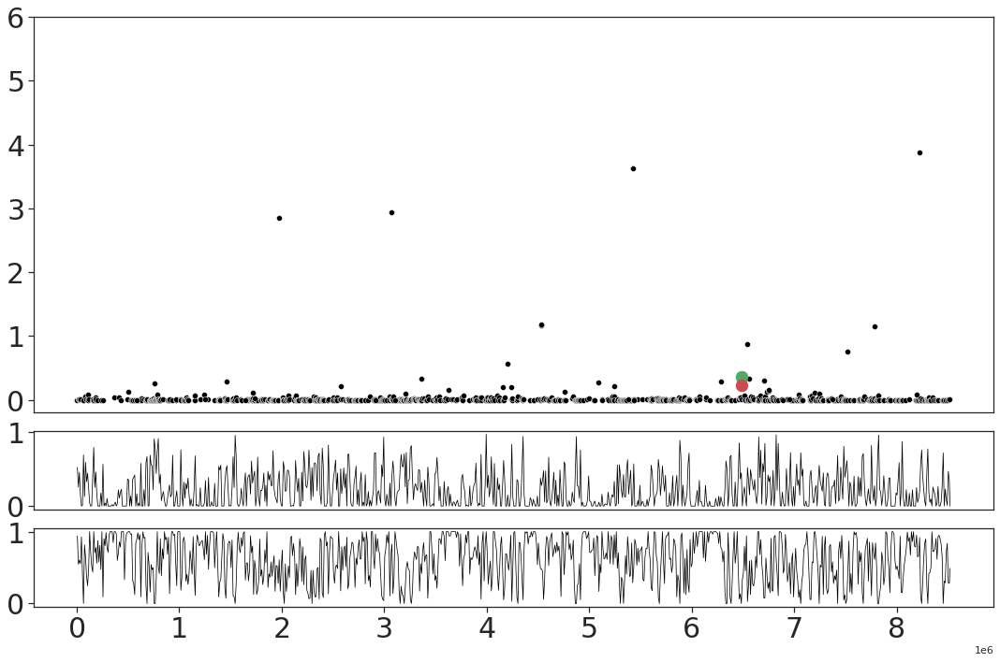

In [14]:
f, axs = plt.subplots(3, 1,sharex=True, figsize=(15,10), gridspec_kw=dict(height_ratios=[5,1,1]))

g1 = sns.scatterplot(data=allele_df_HD,x='start',y='yn00_dS', ax=axs[0], legend=False, color='black')
sns.set()
sns.set_style('white')
#g1.set_xlabel("Loci (bp) ")
#g1.set_ylabel("synonymous divergence rate", fontsize=20)
#g1.text(allele_df_HD.start[allele_df_HD.Target=='Pt76_019208'],allele_df_HD.yn00_dS[allele_df_HD.Target=='Pt76_019208']+0.1,"bE-HD", color='green', fontsize = 20, style = 'italic')
#g1.text(allele_df_HD.start[allele_df_HD.Target=='Pt76_019207']+100000,allele_df_HD.yn00_dS[allele_df_HD.Target=='Pt76_019207'],"bW-HD", color='red', fontsize = 20, style = 'italic')
Pt76_019208=allele_df_HD.start[allele_df_HD.Target=='Pt76_019208']
g1.tick_params(axis='both', which='major', labelsize=30)
g1.plot(allele_df_HD.start[allele_df_HD.Target=='Pt76_019208'],allele_df_HD.yn00_dS[allele_df_HD.Target=='Pt76_019208'],'g.', markersize=25)
g1.plot(allele_df_HD.start[allele_df_HD.Target=='Pt76_019207'],allele_df_HD.yn00_dS[allele_df_HD.Target=='Pt76_019207'],'r.', markersize=25)
g1.tick_params(left=True)

g2 = sns.lineplot(x="1/2 position", y="Gene density", data=gene_density_chr4_A, ax=axs[1], size=1, legend=False, color='black')
g2.tick_params(bottom=False, left=True)
g2.set(xlabel=None)
g2.title.set_position([0, 1.1])
g2.yaxis.labelpad = 15
#g2.set_xlabel("Gene position along chromosome 4A", fontsize=20)
#g2.set_ylabel("Gene density", fontsize=20)
#plt.figure(figsize=(15,0.5))
g2.ticklabel_format(axis="x", style="sci")
g2.tick_params(axis='both', which='major', labelsize=30)

g3 = sns.lineplot(x="1/2 position", y="TE density", data=TE_density_chr4_A, ax=axs[2], size=1, legend=False, color='black')
g3.tick_params(bottom=True, left=True)
g3.set(xlabel=None)
#g3.set_xlabel("Gene position along chromosome 4A", fontsize=20)
g3.title.set_position([0, 1.1])
g3.yaxis.labelpad = 15
#g3.set_ylabel("TE", fontsize=20)
#plt.figure(figsize=(15,0.5))
g3.ticklabel_format(axis="x", style="sci")
g3.ticklabel_format(axis="x", style="sci")
g3.tick_params(axis='both', which='major', labelsize=30)
g1.set_ylabel("")
g2.set_ylabel("")
g3.set_ylabel("")
tick_spacing = 1
g1.axis(ymax=6)
g1.yaxis.set_major_locator(ticker.MultipleLocator(tick_spacing))
#g1.yaxis.set_major_formatter(FormatStrFormatter('%.1f'))
#g2.yaxis.set_major_formatter(FormatStrFormatter('%.1f'))
#g3.yaxis.set_major_formatter(FormatStrFormatter('%.1f'))
tick_spacing = 1000000
g3.xaxis.set_major_locator(ticker.MultipleLocator(tick_spacing))
#f.suptitle("dS value of genes on Pt 76 chr4", x=0.2, y=0.98, fontsize=23, fontweight="bold")
f.tight_layout()
plt.subplots_adjust(hspace = 0.1)
plt.show()

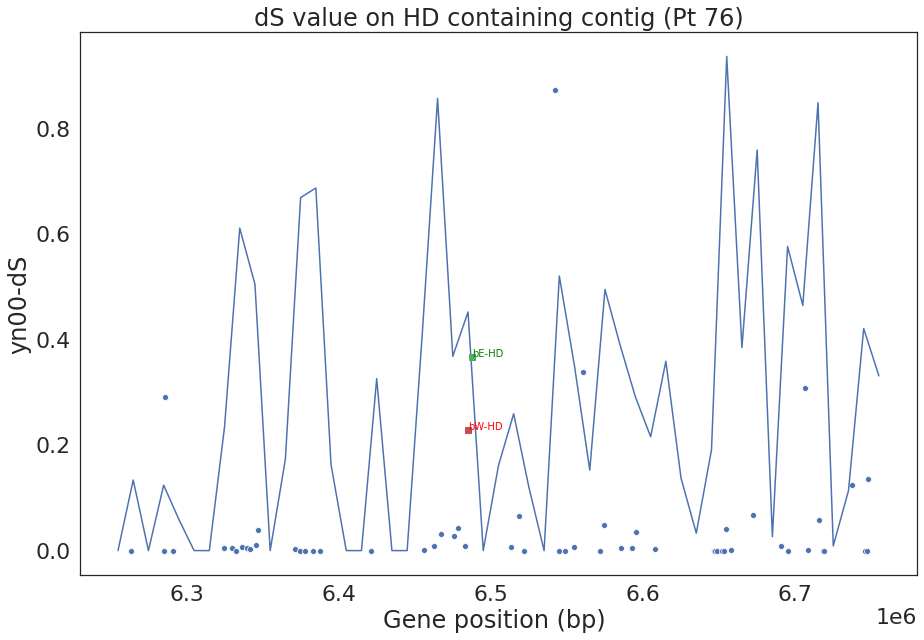

In [110]:
subset=allele_df_HD[allele_df_HD['start'].between(6250000, 6750000)]
gene_density_chr4_A_test=gene_density_chr4_A[gene_density_chr4_A['Start'].between(6250000, 6750000)]
plt.figure(figsize=(15,10))
sns.scatterplot(data=subset,x='start',y='yn00_dS')
sns.set_style(style='white')
sns.lineplot(x="1/2 position", y="Gene density", data=gene_density_chr4_A_test)
plt.title("dS value on HD containing contig (Pt 76)")
plt.xlabel("Gene position (bp) ")
plt.ylabel("yn00-dS")
plt.text(subset.start[subset.Target=='Pt76_019208'],subset.yn00_dS[subset.Target=='Pt76_019208'],"bE-HD", color='green', fontsize = 10)
plt.text(subset.start[subset.Target=='Pt76_019207'],subset.yn00_dS[subset.Target=='Pt76_019207'],"bW-HD", color='red', fontsize = 10)
Pt76_019208=subset.start[subset.Target=='Pt76_019208']
plt.plot(6487768,0.3669,'gs')
plt.plot(6484924,0.2292,'rs')
plt.show()

In [128]:
test_df = pd.merge(allele_df_drop, gff_p, on='Target', how='outer')
test_df['yn00_dS'] = test_df['yn00_dS'].fillna(-0.1)
test_STE3 = test_df[test_df['Contig'] == 'chr9_A']

In [111]:
allele_df_STE[allele_df_STE.Target=='Pt76_028748']

,Unnamed: 0,Target,evalue_ab,bitscore_ab,evalue_ba,bitscore_ba,same_strand,simscore,Index,protein_hamming,...,yn00_dS,yn00_dN,Contig,annotation,feature,start,end,factor,strand,factor2
10589,10589,Pt76_028748,6.650000e-110,326.0,3.470000e-107,319.0,1,1.0,Pt76_028748_Pt76_029586,0.5595,...,2.2247,0.5214,chr9_A,funannotate,CDS,2159631,2161671,.,-,.


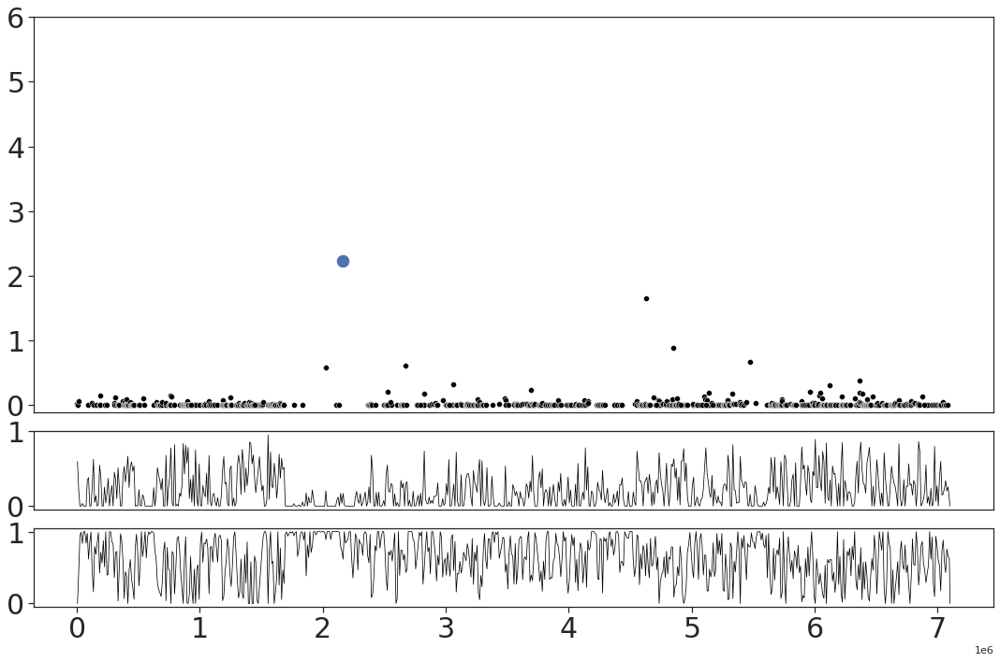

In [15]:
f, axs = plt.subplots(3, 1,sharex=True, figsize=(15,10), gridspec_kw=dict(height_ratios=[5,1,1]))

g1 = sns.scatterplot(data=allele_df_STE,x='start',y='yn00_dS', ax=axs[0], legend=False, color='black')
sns.set()
sns.set_style('white')
#g1.set_xlabel("Loci (bp) ")
#g1.set_ylabel("synonymous divergence rate", fontsize=20)
#g1.text(allele_df_STE.start[allele_df_STE.Target=='Pt76_028748'],allele_df_STE.yn00_dS[allele_df_STE.Target=='Pt76_028748']+0.2,"STE3.2 / STE3.3", color='red', fontsize = 20, style='italic')
g1.plot(allele_df_STE.start[allele_df_STE.Target=='Pt76_028748'],allele_df_STE.yn00_dS[allele_df_STE.Target=='Pt76_028748'],'b.', markersize=25)
g1.tick_params(axis='both', which='major', labelsize=30)

g2 = sns.lineplot(x="1/2 position", y="Gene density", data=gene_density_chr9_A, ax=axs[1], size=1, legend=False, color='black')
g2.tick_params(bottom=False)
#g2.set_xlabel("Gene position along chromosome 9A", fontsize=20)
g2.title.set_position([0, 1.1])
g2.yaxis.labelpad = 15
#g2.set_ylabel("Gene density", fontsize=20)
#plt.figure(figsize=(15,0.5))
g2.ticklabel_format(axis="x", style="sci")
g2.tick_params(axis='both', which='major', labelsize=30)

g3 = sns.lineplot(x="1/2 position", y="TE density", data=TE_density_chr9_A, ax=axs[2], size=1, legend=False, color='black')
g3.tick_params(bottom=False)
g3.set(xlabel=None)
#g3.set_xlabel("Gene position along chromosome 9A", fontsize=20)
#g3.title.set_position([0, 1.1])
g3.yaxis.labelpad = 15
#g3.set_ylabel("TE", fontsize=20)
#plt.figure(figsize=(15,0.5))
g3.ticklabel_format(axis="x", style="sci")
g3.tick_params(axis='both', which='major', labelsize=30)
g1.set_ylabel("")
g2.set_ylabel("")
g3.set_ylabel("")
tick_spacing = 1
g1.yaxis.set_major_locator(ticker.MultipleLocator(tick_spacing))
g1.tick_params(left=True)
g2.tick_params(left=True)
g3.tick_params(left=True)
g3.tick_params(bottom=True)
#g1.yaxis.set_major_formatter(FormatStrFormatter('%.1f'))
#g2.yaxis.set_major_formatter(FormatStrFormatter('%.1f'))
#g3.yaxis.set_major_formatter(FormatStrFormatter('%.1f'))
g1.axis(ymax=6)
g2.axis(ymax=1)
#f.suptitle("dS value of genes on Pt 76 chr9", x=0.2, y=0.98, fontsize=23, fontweight="bold")
f.tight_layout()
plt.subplots_adjust(hspace = 0.1)
plt.show()

In [217]:
allele_df_STE31[allele_df_STE31.Target=='Pt76_012571']

,Unnamed: 0,Target,evalue_ab,bitscore_ab,evalue_ba,bitscore_ba,same_strand,simscore,Index,protein_hamming,...,yn00_dS,yn00_dN,Contig,annotation,feature,start,end,factor,strand,factor2
4842,4842,Pt76_012571,2.880000e-296,799.0,6.790000e-295,795.0,1,1.0,Pt76_012571_Pt76_013792,0.0051,...,-0.0,0.0024,chr1_A,funannotate,CDS,7142852,7144655,.,-,.


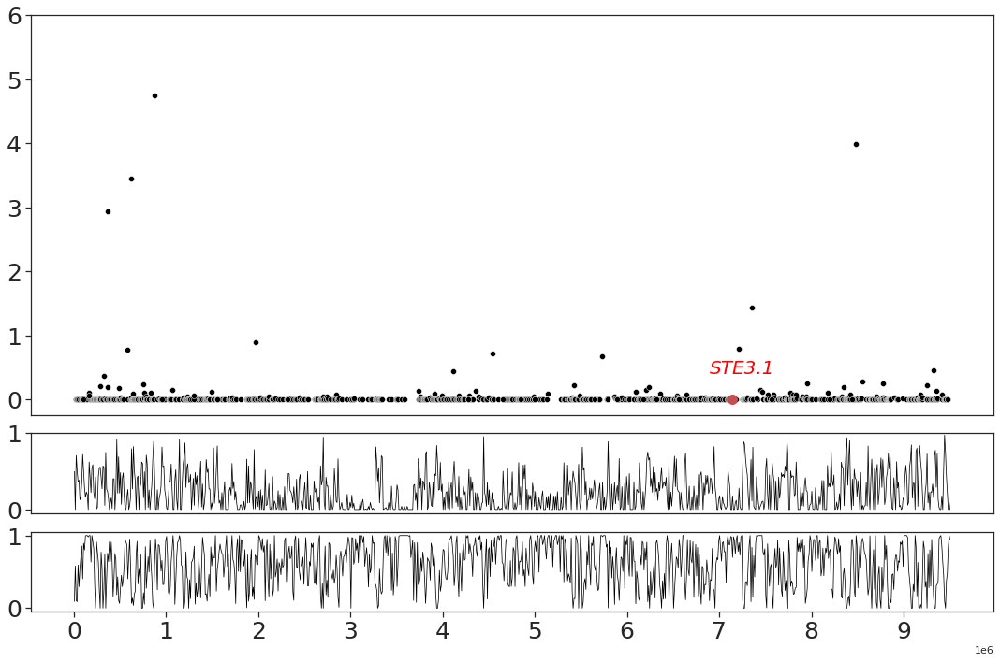

In [26]:
f, axs = plt.subplots(3, 1,sharex=True, figsize=(15,10), gridspec_kw=dict(height_ratios=[5,1,1]))

g1 = sns.scatterplot(data=allele_df_STE31,x='start',y='yn00_dS', ax=axs[0], legend=False, color='black')
sns.set()
sns.set_style('white')
g1.set_xlabel("Loci (bp) ")
g1.set_ylabel("synonymous divergence rate", fontsize=20)
g1.text(allele_df_STE31.start[allele_df_STE31.Target=='Pt76_012571']-250000,allele_df_STE31.yn00_dS[allele_df_STE31.Target=='Pt76_012571']+0.4,"STE3.1", color='red', size = 20, style='italic')
g1.plot(allele_df_STE31.start[allele_df_STE31.Target=='Pt76_012571'],allele_df_STE31.yn00_dS[allele_df_STE31.Target=='Pt76_012571'],'r.', markersize=20)
g1.tick_params(axis='both', which='major', labelsize=25)

g2 = sns.lineplot(x="1/2 position", y="Gene density", data=gene_density_chr1_A, ax=axs[1], size=1, legend=False, color='black')
g2.tick_params(bottom=False)
g2.set(xlabel=None)
g2.title.set_position([0, 1.1])
g2.set_xlabel("Gene position along chromosome 1A", fontsize=20)
g2.yaxis.labelpad = 15
g2.set_ylabel("Gene density", fontsize=20)
#plt.figure(figsize=(15,0.5))
g2.ticklabel_format(axis="x", style="sci")
g2.tick_params(axis='both', which='major', labelsize=25)

g3 = sns.lineplot(x="1/2 position", y="TE density", data=TE_density_chr1_A, ax=axs[2], size=1, legend=False, color='black')
g3.tick_params(bottom=False)
g3.set(xlabel=None)
#g3.set_xlabel("Gene position along chromosome 1A", fontsize=20)
g3.title.set_position([0, 1.1])
g3.yaxis.labelpad = 15
g3.set_ylabel("TE", fontsize=20)
#plt.figure(figsize=(15,0.5))
g3.ticklabel_format(axis="x", style="sci")
g3.tick_params(axis='both', which='major', labelsize=25)
g1.set_ylabel("")
g2.set_ylabel("")
g3.set_ylabel("")
tick_spacing = 1
g1.yaxis.set_major_locator(ticker.MultipleLocator(tick_spacing))
#g1.yaxis.set_major_formatter(FormatStrFormatter('%.1f'))
#g2.yaxis.set_major_formatter(FormatStrFormatter('%.1f'))
#g3.yaxis.set_major_formatter(FormatStrFormatter('%.1f'))
tick_spacing = 1000000
g3.xaxis.set_major_locator(ticker.MultipleLocator(tick_spacing))
g1.axis(ymax=6)
g2.axis(ymax=1)
g1.tick_params(left=True)
g2.tick_params(left=True)
g3.tick_params(left=True)
g3.tick_params(bottom=True)
#f.suptitle("dS value of genes on Pt 76 chr1", x=0.2, y=0.98, fontsize=23, fontweight="bold")
f.tight_layout()
plt.subplots_adjust(hspace = 0.1)
plt.show()

In [17]:
########## FIGURE PLOTTING ##########

def make_autopct(values):
    def my_autopct(pct):
        total = sum(values)
        val = int(round(pct*total/100.0))
        return '{p:.2f}%\n({v:d})'.format(p=pct,v=val)
    return my_autopct

def autolabel(rects, labels, ax, fontsize):
    """
    Attach a text label above each bar displaying its height
    """
    for i, rect in enumerate(rects):
        height = rect.get_height()
        ax.text(rect.get_x() + rect.get_width()/2., height, str(labels[i]), ha='center', va='bottom', fontsize=fontsize)

def getNumNoAlleles(pProteinFastaFile, allele_df):
    with open(pProteinFastaFile) as pProteinFasta:
        pProteinList = []
        for line in pProteinFasta:
            if line.startswith('>'):
                pProteinList.append(line[1:].strip())

    assert(len(pProteinList) == len(set(pProteinList)))


    pairedPProteinList = list(allele_df['Query'])
    pairedPProteinList += list(allele_df['Target'])
    pairedPProteinList = set(pairedPProteinList)
    
    for pairedPProtein in pairedPProteinList:
        if pairedPProtein in pProteinList:
            pProteinList.remove(pairedPProtein)
    
    return len(pProteinList)

#def plotAlleleTypesPie(ax, allele_df, colors, includeNoAlleles=True):
#    '''Plots a pie chart of allele types, with the option of also including 
#    primary proteins with no alleles. Strictly, this is not an accurate representation
#    of the distribution of primary proteins as the reciprocal BLAST-identified (h on p) alleles
#    may result in double-counting of primary proteins.
#    '''
    # OrderedDict to preserve order, so that plots are coloured with same key as the distance 
    # bar graphs. This is a bit of a hack-fix; must enter these by hand again in the same order 
    # as 'matchType' occurs in the alleleAveragesByMatchType DataFrame.
 #   alleleTypeCountDict = collections.OrderedDict()
    
  #  for matchType in allele_df['matchType'].unique():
#        alleleTypeCountDict[matchType] = len(alleleDf[alleleDf['matchType'] == matchType])
    
 #   if includeNoAlleles==True:
 #       numNoAlleles = getNumNoAlleles(P_PROTEINS_FASTA, alleleDf)
 #       alleleTypeCountDict['no_allele'] = numNoAlleles

  #  patches, texts, autotexts = ax.pie(list(alleleTypeCountDict.values()), labels=alleleTypeCountDict.keys(), autopct=make_autopct(list(alleleTypeCountDict.values())), colors=colors)
   # ax.axis('equal')
 #   ax.set_title('Allele Types', loc='center', fontsize=TITLE_SIZE, position=(0.5, 1.1))

def plotLevenshteinBar(alleleAverages, ax, colors):
    '''Plots a bar graph of normalised Levenshtein distances on ax from DataFrame alleleAverages.'''
    
    ind = np.arange(len(alleleAverages.protein_levenshtein))
    rects = ax.bar(ind, alleleAverages.protein_levenshtein, 0.35, color=colors, align='center') 
    
    sns.despine(top=True, right=True)
    
    barLabels = []
    for levDist in alleleAverages.protein_levenshtein:
        barLabels.append(str(int((1-levDist)*100)) + '%')
    autolabel(rects, barLabels, ax, INLINE_LABEL_SIZE)

    ax.set_xticks(ind)
    ax.set_xticklabels(alleleAverages.index, rotation=45)

    # ax.set_xlabel('Allele Types', fontsize=AXIS_LABEL_SIZE)
    ax.set_ylabel('Normalised Levenshtein Distance', fontsize=AXIS_LABEL_SIZE)

    ax.tick_params(axis='both', which='major', labelsize=AXIS_TICK_SIZE, pad=3)

    for tick in ax.get_xaxis().get_major_ticks():
        tick.set_pad(2*tick.get_pad())
        tick.label1 = tick._get_text1()
        
def plotAlleles(allele_df, qCovFilters, tCovFilters, pctIdFilters, levSimFilters, leavePO):
    '''Makes a 3x2 plot with normalised Levenshtein distance plots in column 1 and
    a pie chart representing the distribution of allele types in column 2.
    Each row shows different levels of filtering.
    
    leavePO is a boolean that determines whether only BLAST hits will be filtered (leavePO=True)
    or both BLAST and PO alleles should be filtered (leavePO=False)'''
    cmap = plt.cm.Greens
#    colors = cmap(np.linspace(0.0, 0.6, len(alleleDf['matchType'].unique())))
    
    assert(len(qCovFilters) == len(pctIdFilters) == len(levSimFilters))
    
    fig, ax = plt.subplots(len(qCovFilters), 2, figsize=(30, 12*len(qCovFilters)))
    
    for i in range(len(qCovFilters)):
        
        filteredAlleleDf = filterAlleleDf(allele_df, qCovFilters[i], tCovFilters[i], pctIdFilters[i], levSimFilters[i], True)
        print(filteredAlleleDf[filteredAlleleDf.allele_source == 'PO'].shape[0])
        # levenshtein distance plot
        alleleAveragesByMatchType = filteredAlleleDf.groupby(['matchType']).mean()
        plotLevenshteinBar(alleleAveragesByMatchType, ax[i, 0], colors)
        ax[i, 0].set_xticklabels(alleleAveragesByMatchType.index, rotation=45, ha='right')
        
        # pie plot
        plotAlleleTypesPie(ax[i, 1], filteredAlleleDf)#, colors)
        
        # include filtering criteria in title
        qCovFilter = qCovFilters[i]
        tCovFilter = tCovFilters[i]
        pctIdFilter = pctIdFilters[i]
        levSimFilter = levSimFilters[i]
        if qCovFilter < BASE_QCOV_CUTOFF:
            qCovFilter = BASE_QCOV_CUTOFF
            print('Base QCov cut-off is 70%; if you desire to filter below this value, decrease BASE_QCOV_CUTOFF.')
        if tCovFilter < BASE_TCOV_CUTOFF:
            tCovFilter = BASE_TCOV_CUTOFF
            print('Base TCov cut-off is 70%; if you desire to filter below this value, decrease BASE_TCOV_CUTOFF.')
        if pctIdFilter < BASE_PCTID_CUTOFF:
            pctIdFilter = BASE_PCTID_CUTOFF
            print('Base %ID cut-off is 70%; if you desire to filter below this value, decrease BASE_PCTID_CUTOFF.')
        if not levSimFilter:
            levSimFilter = 0
    
        ax[i, 0].set_title('QCov > %s%%, TCov > %s%%, ID > %s%%, L. sim. > %s%%, PO Filtered: %s' % (qCovFilter, tCovFilter, pctIdFilter, levSimFilter, not leavePO), position=(0.5, 0.85))
        
    fig.tight_layout()
    fig.savefig(os.path.join(FIGURE_PATH, 'fig'), bbox_inches='tight')

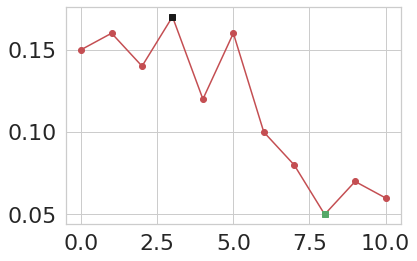

In [43]:
import matplotlib.pyplot as plt
import numpy as np


a=np.array([0.15,0.16,0.14,0.17,0.12,0.16,0.1,0.08,0.05,0.07,0.06])
max_indx=np.argmax(a)#max value index
min_indx=np.argmin(a)#min value index
plt.plot(a,'r-o')
plt.plot(max_indx,a[max_indx],'ks')
show_max='['+str(max_indx)+' '+str(a[max_indx])+']'
plt.plot(min_indx,a[min_indx],'gs')
plt.show()